<a href="https://colab.research.google.com/github/AbdelilahNossair/Phishing-Email-Detection/blob/main/Phishing_Email_Detection_Deliverable_Complete.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Install Required Librairies

In [ ]:
!pip install transformers==4.30.2

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.2/7.2 MB 44.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 86.0 MB/s eta 0:00:00
  Attempting uninstall: tokenizers
    Found existing installation: tokenizers 0.19.1
    Uninstalling tokenizers-0.19.1:
      Successfully uninstalled tokenizers-0.19.1
  Attempting uninstall: transformers
    Found existing installation: transformers 4.41.2
    Uninstalling transformers-4.41.2:
      Successfully uninstalled transformers-4.41.2


In [ ]:
!pip install accelerate==0.21.0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 244.2/244.2 kB 3.7 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-m

# Import Necessary Librairies

In [ ]:
import pandas as pd
from sklearn.utils import resample
from sklearn.model_selection import train_test_split
from transformers import DistilBertTokenizer, DistilBertModel, Trainer, TrainingArguments
from torch.utils.data import Dataset
import torch
from sklearn.metrics import accuracy_score, precision_recall_fscore_support
import numpy as np
import re
import torch.nn as nn


# Load Datasets

In [ ]:
ceas = pd.read_csv('/content/drive/MyDrive/Phishing_Email_Detection/CEAS_08.csv')
spamassassin = pd.read_csv('/content/drive/MyDrive/Phishing_Email_Detection/SpamAssasin.csv')
trec_1 = pd.read_csv('/content/drive/MyDrive/Phishing_Email_Detection/cleaned_TREC_06.csv')
trec_2 = pd.read_csv('/content/drive/MyDrive/Phishing_Email_Detection/cleaned_TREC_05.csv')
trec_3 = pd.read_csv('/content/drive/MyDrive/Phishing_Email_Detection/cleaned_TREC_07.csv')
enron = pd.read_csv('/content/drive/MyDrive/Phishing_Email_Detection/Enron.csv')
ling = pd.read_csv('/content/drive/MyDrive/Phishing_Email_Detection/Ling.csv')
nazario = pd.read_csv('/content/drive/MyDrive/Phishing_Email_Detection/Nazario.csv')
nigerian_fraud = pd.read_csv('/content/drive/MyDrive/Phishing_Email_Detection/Nigerian_Fraud.csv')


# Exploratory Data Analysis (EDA)

## EDA for CEAS Dataset

### Display First Few Rows

In [ ]:
print("CEAS Dataset Head:")
print(ceas.head())

CEAS Dataset Head:
                                              sender  \
0                   Young Esposito <Young@iworld.de>   
1                       Mok <ipline's1983@icable.ph>   
2  Daily Top 10 <Karmandeep-opengevl@universalnet...   
3                 Michael Parker <ivqrnai@pobox.com>   
4  Gretchen Suggs <externalsep1@loanofficertool.com>   

                                         receiver  \
0                     user4@gvc.ceas-challenge.cc   
1                   user2.2@gvc.ceas-challenge.cc   
2                   user2.9@gvc.ceas-challenge.cc   
3  SpamAssassin Dev <xrh@spamassassin.apache.org>   
4                   user2.2@gvc.ceas-challenge.cc   

                              date  \
0  Tue, 05 Aug 2008 16:31:02 -0700   
1  Tue, 05 Aug 2008 18:31:03 -0500   
2  Tue, 05 Aug 2008 20:28:00 -1200   
3  Tue, 05 Aug 2008 17:31:20 -0600   
4  Tue, 05 Aug 2008 19:31:21 -0400   

                                             subject  \
0                          Never agree t

### Shape, Statistics, Missing Values, and Data Types

In [ ]:
print("Shape of the CEAS dataset:", ceas.shape)

Shape of the CEAS dataset: (39154, 7)


In [ ]:
print("Summary Statistics:")
print(ceas.describe())

Summary Statistics:
              label         urls
count  39154.000000  39154.00000
mean       0.557848      0.66997
std        0.496649      0.47023
min        0.000000      0.00000
25%        0.000000      0.00000
50%        1.000000      1.00000
75%        1.000000      1.00000
max        1.000000      1.00000


In [ ]:
print("Missing Values:")
print(ceas.isnull().sum())

Missing Values:
sender        0
receiver    462
date          0
subject      28
body          0
label         0
urls          0
dtype: int64


In [ ]:
print("Data Types:")
print(ceas.dtypes)

Data Types:
sender      object
receiver    object
date        object
subject     object
body        object
label        int64
urls         int64
dtype: object


### Class Distribution

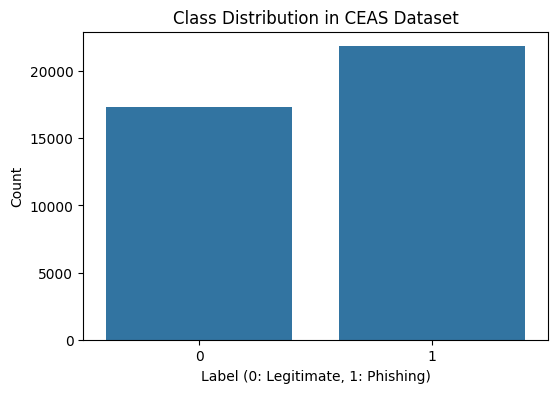

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Class distribution
plt.figure(figsize=(6,4))
sns.countplot(x='label', data=ceas)
plt.title('Class Distribution in CEAS Dataset')
plt.xlabel('Label (0: Legitimate, 1: Phishing)')
plt.ylabel('Count')
plt.show()


### Length of Emails

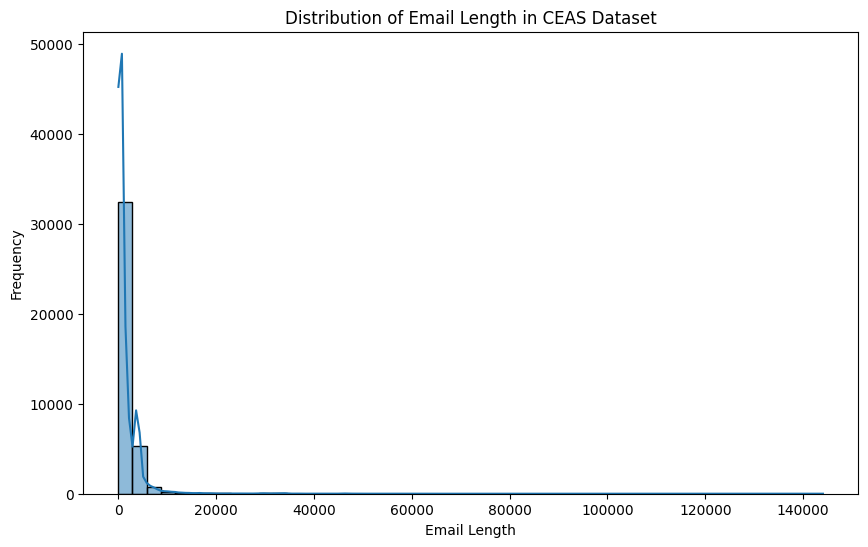

In [ ]:
# Calculate length of emails
ceas['email_length'] = ceas['subject'].str.len() + ceas['body'].str.len()

# Plot email length distribution
plt.figure(figsize=(10,6))
sns.histplot(ceas['email_length'], bins=50, kde=True)
plt.title('Distribution of Email Length in CEAS Dataset')
plt.xlabel('Email Length')
plt.ylabel('Frequency')
plt.show()


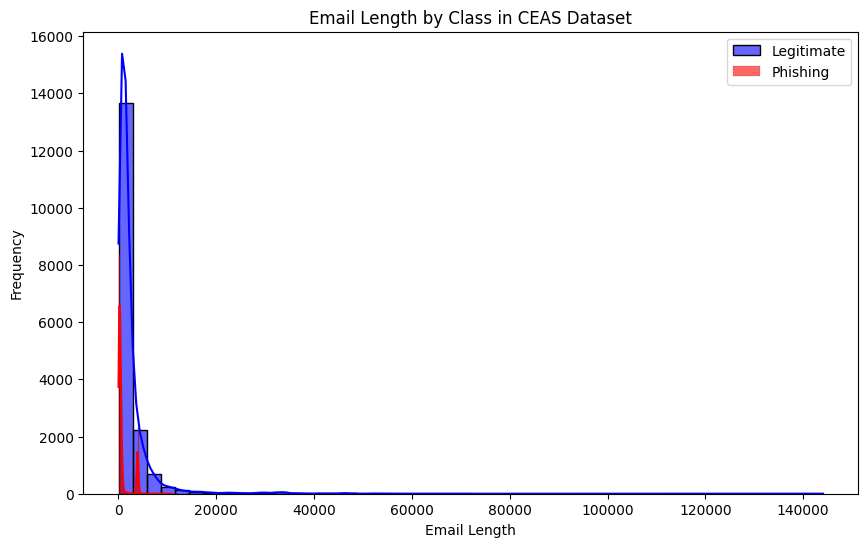

In [ ]:
# Compare lengths between phishing and legitimate emails
plt.figure(figsize=(10,6))
sns.histplot(ceas[ceas['label'] == 0]['email_length'], bins=50, kde=True, color='blue', label='Legitimate', alpha=0.6)
sns.histplot(ceas[ceas['label'] == 1]['email_length'], bins=50, kde=True, color='red', label='Phishing', alpha=0.6)
plt.title('Email Length by Class in CEAS Dataset')
plt.xlabel('Email Length')
plt.ylabel('Frequency')
plt.legend()
plt.show()

### Subject Line Analysis

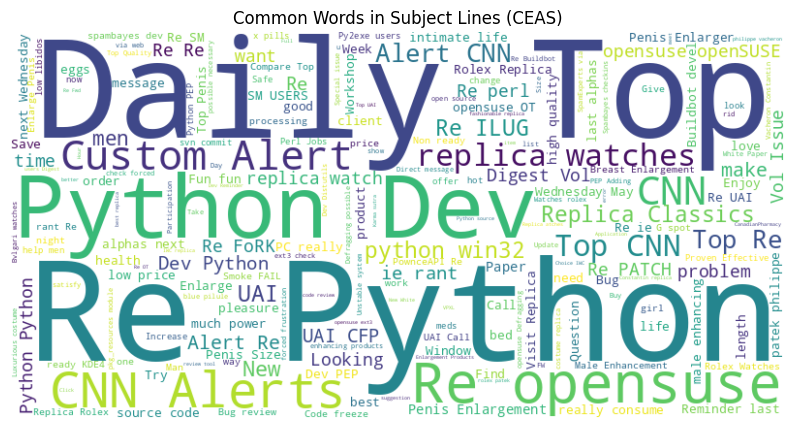

In [ ]:
from wordcloud import WordCloud

# Combine all subject lines
all_subjects = ' '.join(ceas['subject'].dropna().values)

# Generate word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_subjects)

# Plot word cloud
plt.figure(figsize=(10,6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Common Words in Subject Lines (CEAS)')
plt.show()

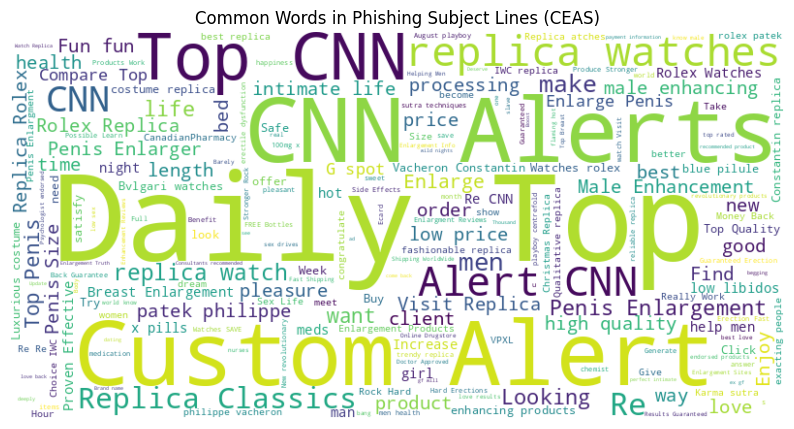

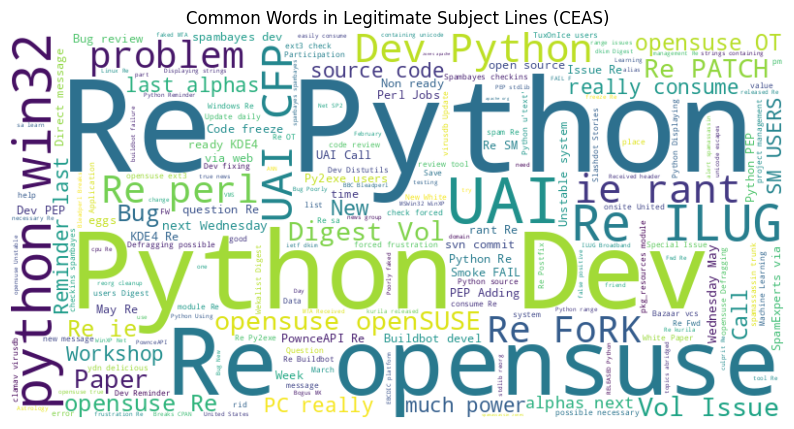

In [ ]:
# Separate word clouds for phishing and legitimate emails
phishing_subjects = ' '.join(ceas[ceas['label'] == 1]['subject'].dropna().values)
legit_subjects = ' '.join(ceas[ceas['label'] == 0]['subject'].dropna().values)

# Phishing word cloud
wordcloud_phishing = WordCloud(width=800, height=400, background_color='white').generate(phishing_subjects)
plt.figure(figsize=(10,6))
plt.imshow(wordcloud_phishing, interpolation='bilinear')
plt.axis('off')
plt.title('Common Words in Phishing Subject Lines (CEAS)')
plt.show()

# Legitimate word cloud
wordcloud_legit = WordCloud(width=800, height=400, background_color='white').generate(legit_subjects)
plt.figure(figsize=(10,6))
plt.imshow(wordcloud_legit, interpolation='bilinear')
plt.axis('off')
plt.title('Common Words in Legitimate Subject Lines (CEAS)')
plt.show()

### URLs and Special Characters

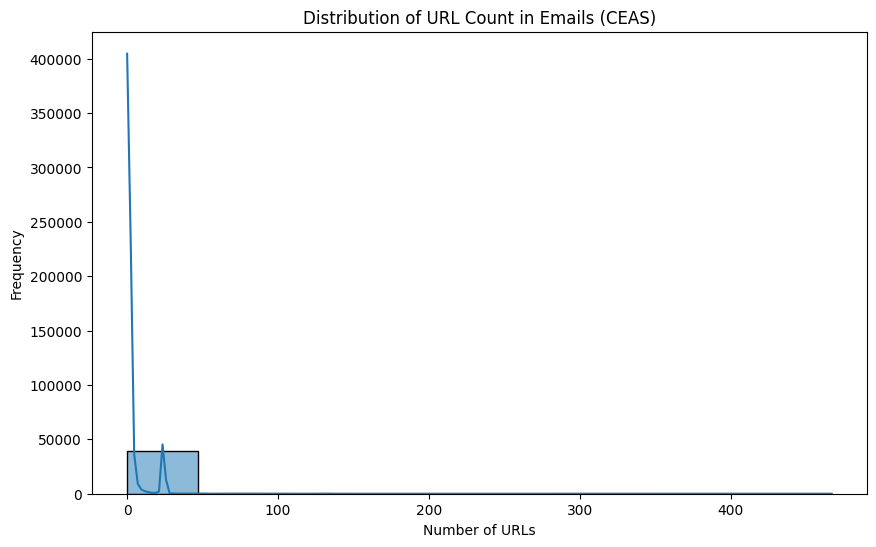

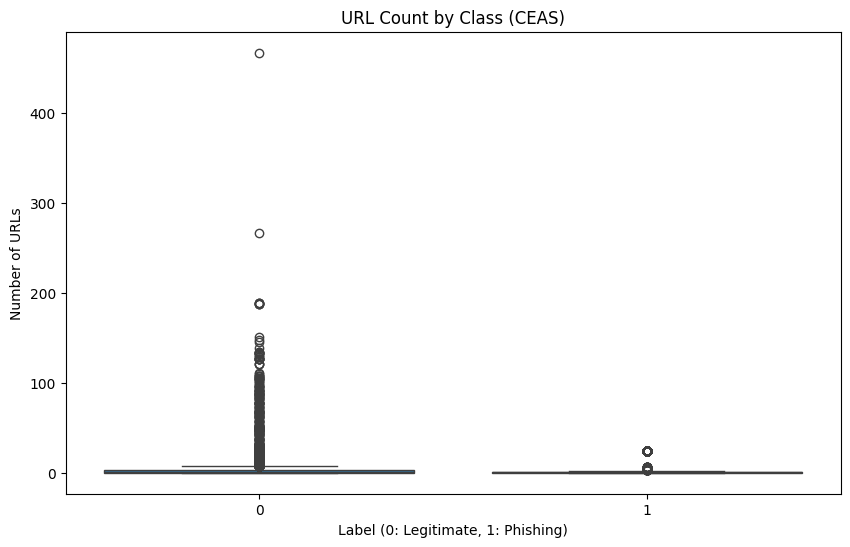

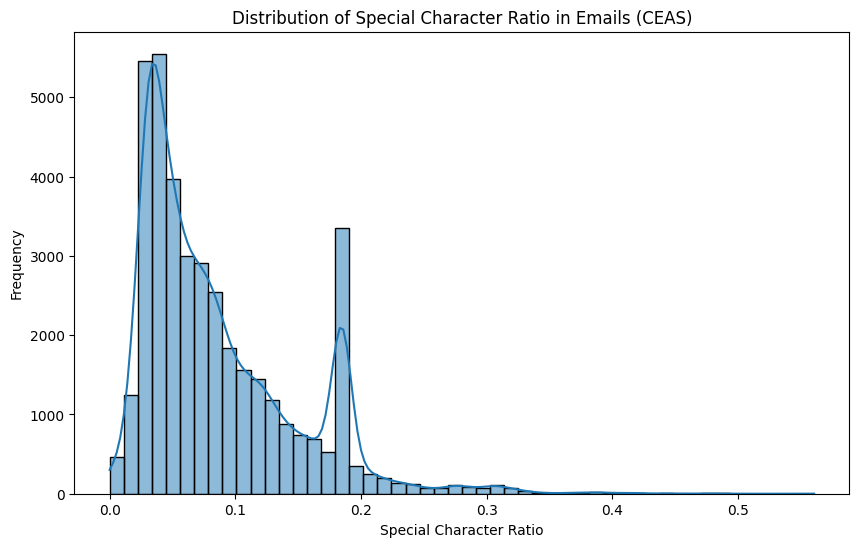

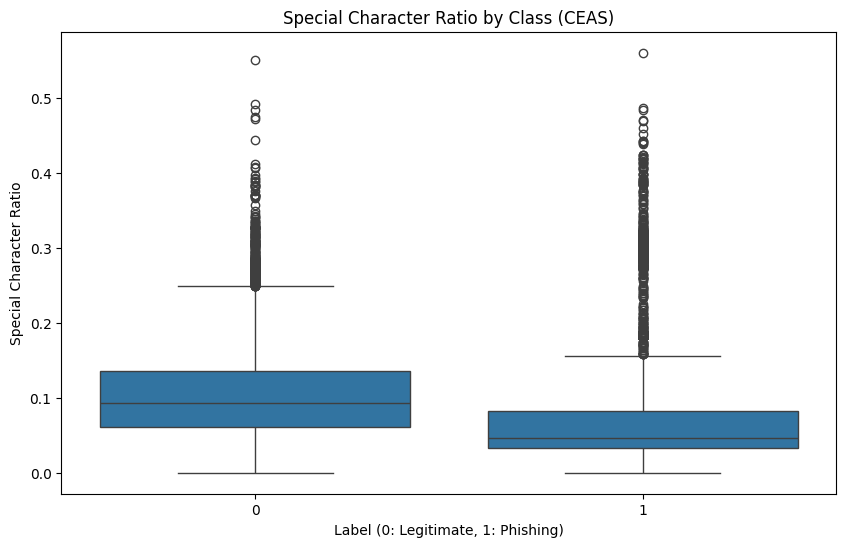

In [ ]:
import re

# Function to count URLs
def count_urls(text):
    url_pattern = r'(https?://[^\s]+|http?://[^\s]+)'
    return len(re.findall(url_pattern, text))

# Apply function to body of emails
ceas['url_count'] = ceas['body'].apply(count_urls)

# Plot URL count distribution
plt.figure(figsize=(10,6))
sns.histplot(ceas['url_count'], bins=10, kde=True)
plt.title('Distribution of URL Count in Emails (CEAS)')
plt.xlabel('Number of URLs')
plt.ylabel('Frequency')
plt.show()

# Compare URL count between phishing and legitimate emails
plt.figure(figsize=(10,6))
sns.boxplot(x='label', y='url_count', data=ceas)
plt.title('URL Count by Class (CEAS)')
plt.xlabel('Label (0: Legitimate, 1: Phishing)')
plt.ylabel('Number of URLs')
plt.show()

# Function to calculate special character ratio
def get_special_char_ratio(text):
    special_chars = sum(not c.isalnum() and not c.isspace() for c in text)
    return special_chars / len(text) if len(text) > 0 else 0

# Apply function to body of emails
ceas['special_char_ratio'] = ceas['body'].apply(get_special_char_ratio)

# Plot special character ratio distribution
plt.figure(figsize=(10,6))
sns.histplot(ceas['special_char_ratio'], bins=50, kde=True)
plt.title('Distribution of Special Character Ratio in Emails (CEAS)')
plt.xlabel('Special Character Ratio')
plt.ylabel('Frequency')
plt.show()

# Compare special character ratio between phishing and legitimate emails
plt.figure(figsize=(10,6))
sns.boxplot(x='label', y='special_char_ratio', data=ceas)
plt.title('Special Character Ratio by Class (CEAS)')
plt.xlabel('Label (0: Legitimate, 1: Phishing)')
plt.ylabel('Special Character Ratio')
plt.show()


### Keyword Analysis

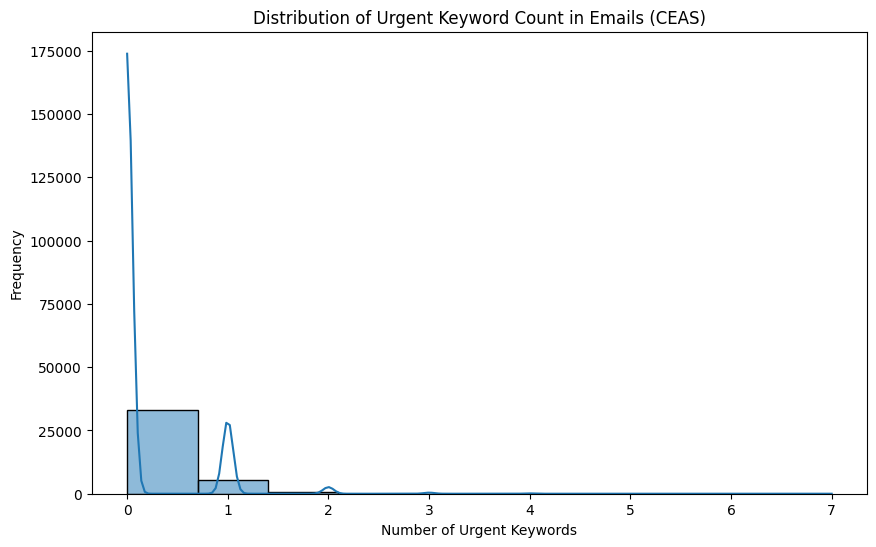

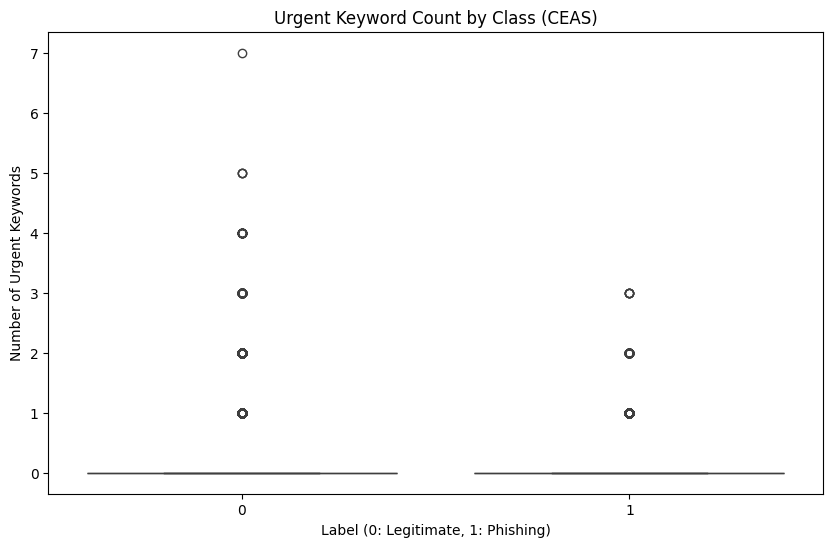

In [ ]:
def keyword_frequency(text, keywords):
    text = text.lower()
    return sum(keyword in text for keyword in keywords)

# Keywords for urgent action
urgent_keywords = [
    'urgent', 'immediately', 'asap', 'action required', 'important', 'critical', 'attention', 'prompt',
    'emergency', 'act now', 'time-sensitive', 'alert', 'high-priority', 'important update', 'do not ignore',
    'response needed', 'please respond'
]

# Apply keyword frequency function
ceas['urgent_keyword_count'] = ceas['body'].apply(lambda x: keyword_frequency(x, urgent_keywords))

# Plot urgent keyword count distribution
plt.figure(figsize=(10,6))
sns.histplot(ceas['urgent_keyword_count'], bins=10, kde=True)
plt.title('Distribution of Urgent Keyword Count in Emails (CEAS)')
plt.xlabel('Number of Urgent Keywords')
plt.ylabel('Frequency')
plt.show()

# Compare urgent keyword count between phishing and legitimate emails
plt.figure(figsize=(10,6))
sns.boxplot(x='label', y='urgent_keyword_count', data=ceas)
plt.title('Urgent Keyword Count by Class (CEAS)')
plt.xlabel('Label (0: Legitimate, 1: Phishing)')
plt.ylabel('Number of Urgent Keywords')
plt.show()


## EDA for SpamAssasin Dataset

### Display First Few Rows

In [ ]:
print("SpamAssassin Dataset Head:")
print(spamassassin.head())

SpamAssassin Dataset Head:
                                      sender  \
0             Robert Elz <kre@munnari.OZ.AU>   
1  Steve Burt <Steve_Burt@cursor-system.com>   
2              "Tim Chapman" <timc@2ubh.com>   
3           Monty Solomon <monty@roscom.com>   
4  Stewart Smith <Stewart.Smith@ee.ed.ac.uk>   

                                            receiver  \
0  Chris Garrigues <cwg-dated-1030377287.06fa6d@D...   
1  "'zzzzteana@yahoogroups.com'" <zzzzteana@yahoo...   
2              zzzzteana <zzzzteana@yahoogroups.com>   
3                           undisclosed-recipient: ;   
4                          zzzzteana@yahoogroups.com   

                              date  \
0  Thu, 22 Aug 2002 18:26:25 +0700   
1  Thu, 22 Aug 2002 12:46:18 +0100   
2  Thu, 22 Aug 2002 13:52:38 +0100   
3  Thu, 22 Aug 2002 09:15:25 -0400   
4  Thu, 22 Aug 2002 14:38:22 +0100   

                                          subject  \
0                        Re: New Sequences Window   
1           

### Shape, Statistics, Missing Values, and Data Types

In [ ]:
# Check the shape of the dataset
print("Shape of the SpamAssasin dataset:", spamassassin.shape)

# Summary statistics
print("Summary Statistics:")
print(spamassassin.describe())

# Check for missing values
print("Missing Values:")
print(spamassassin.isnull().sum())

# Check the data types
print("Data Types:")
print(spamassassin.dtypes)


Shape of the SpamAssasin dataset: (5809, 7)
Summary Statistics:
             label         urls
count  5809.000000  5809.000000
mean      0.295748     0.861078
std       0.456418     0.345895
min       0.000000     0.000000
25%       0.000000     1.000000
50%       0.000000     1.000000
75%       1.000000     1.000000
max       1.000000     1.000000
Missing Values:
sender        0
receiver    210
date          0
subject      16
body          1
label         0
urls          0
dtype: int64
Data Types:
sender      object
receiver    object
date        object
subject     object
body        object
label        int64
urls         int64
dtype: object


### Class Distribution

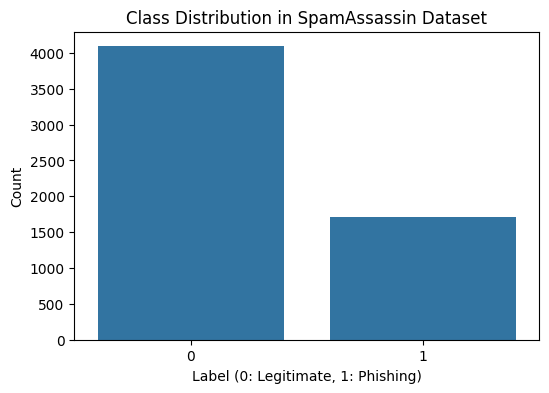

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Class distribution
plt.figure(figsize=(6,4))
sns.countplot(x='label', data=spamassassin)
plt.title('Class Distribution in SpamAssassin Dataset')
plt.xlabel('Label (0: Legitimate, 1: Phishing)')
plt.ylabel('Count')
plt.show()

### Length of Emails

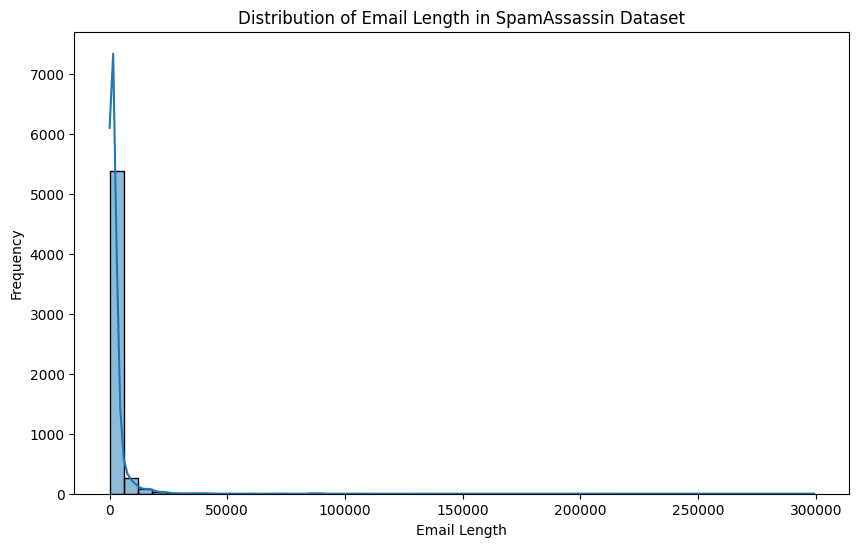

In [ ]:
# Calculate length of emails
spamassassin['email_length'] = spamassassin['subject'].str.len() + spamassassin['body'].str.len()

# Plot email length distribution
plt.figure(figsize=(10,6))
sns.histplot(spamassassin['email_length'], bins=50, kde=True)
plt.title('Distribution of Email Length in SpamAssassin Dataset')
plt.xlabel('Email Length')
plt.ylabel('Frequency')
plt.show()


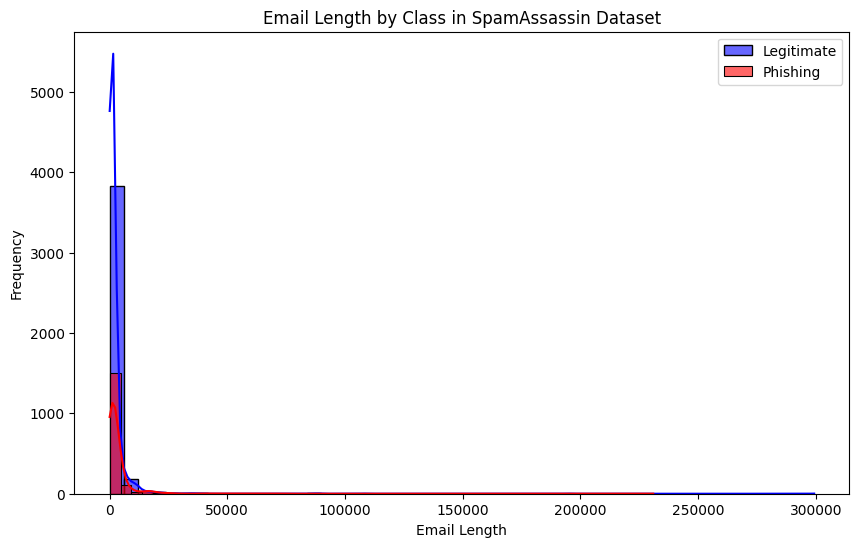

In [ ]:
# Compare lengths between phishing and legitimate emails
plt.figure(figsize=(10,6))
sns.histplot(spamassassin[spamassassin['label'] == 0]['email_length'], bins=50, kde=True, color='blue', label='Legitimate', alpha=0.6)
sns.histplot(spamassassin[spamassassin['label'] == 1]['email_length'], bins=50, kde=True, color='red', label='Phishing', alpha=0.6)
plt.title('Email Length by Class in SpamAssassin Dataset')
plt.xlabel('Email Length')
plt.ylabel('Frequency')
plt.legend()
plt.show()

### Subject Line Analysis

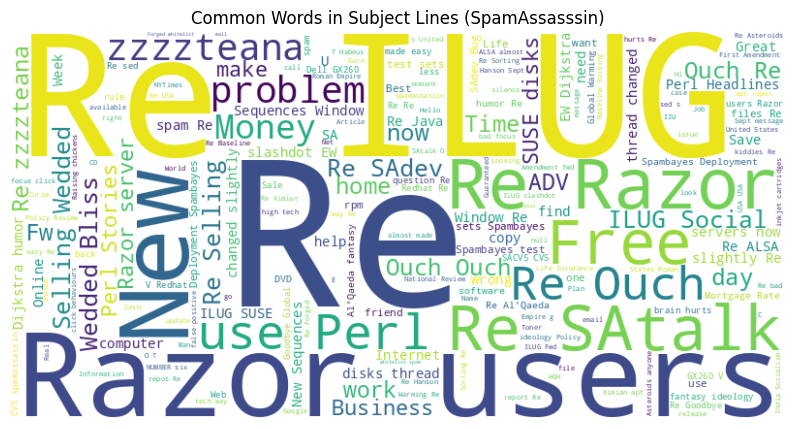

In [ ]:
from wordcloud import WordCloud

# Combine all subject lines
all_subjects = ' '.join(spamassassin['subject'].dropna().values)

# Generate word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_subjects)

# Plot word cloud
plt.figure(figsize=(10,6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Common Words in Subject Lines (SpamAssasssin)')
plt.show()

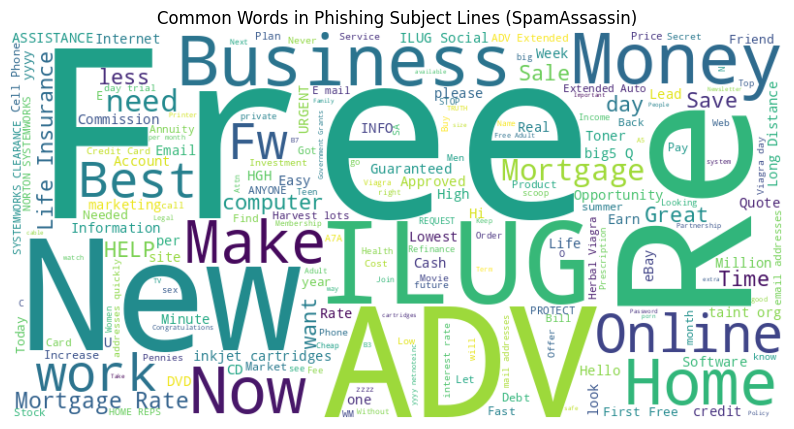

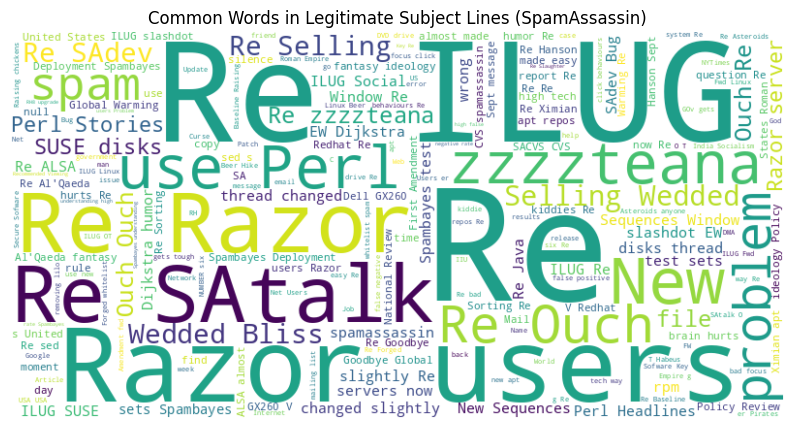

In [ ]:
# Separate word clouds for phishing and legitimate emails
phishing_subjects = ' '.join(spamassassin[spamassassin['label'] == 1]['subject'].dropna().values)
legit_subjects = ' '.join(spamassassin[spamassassin['label'] == 0]['subject'].dropna().values)

# Phishing word cloud
wordcloud_phishing = WordCloud(width=800, height=400, background_color='white').generate(phishing_subjects)
plt.figure(figsize=(10,6))
plt.imshow(wordcloud_phishing, interpolation='bilinear')
plt.axis('off')
plt.title('Common Words in Phishing Subject Lines (SpamAssassin)')
plt.show()

# Legitimate word cloud
wordcloud_legit = WordCloud(width=800, height=400, background_color='white').generate(legit_subjects)
plt.figure(figsize=(10,6))
plt.imshow(wordcloud_legit, interpolation='bilinear')
plt.axis('off')
plt.title('Common Words in Legitimate Subject Lines (SpamAssassin)')
plt.show()

### URLs and Special Characters

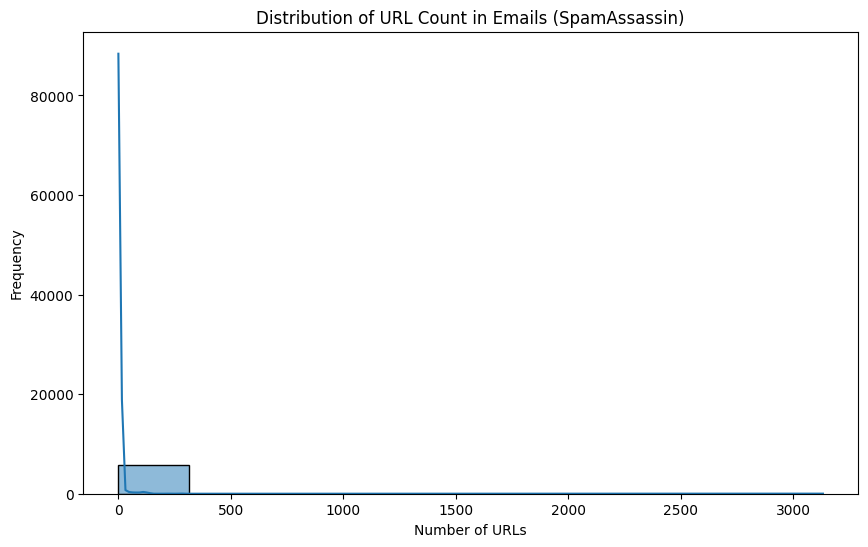

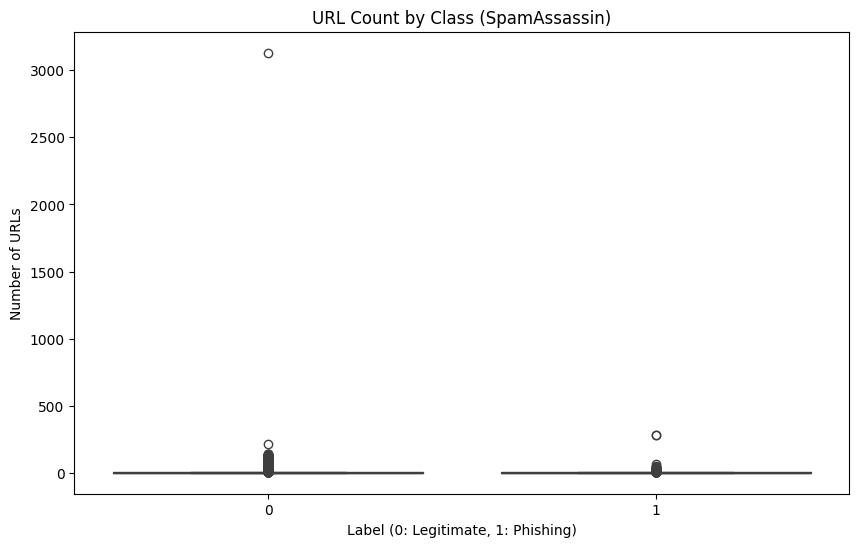

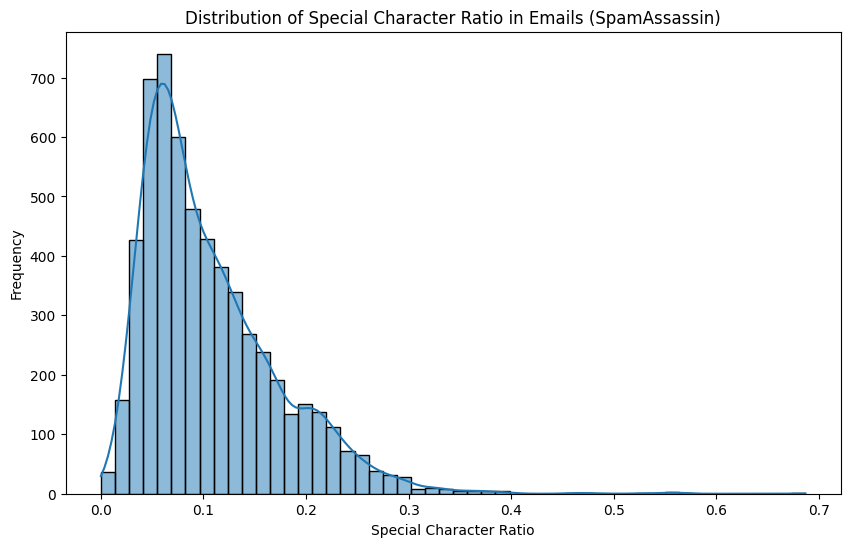

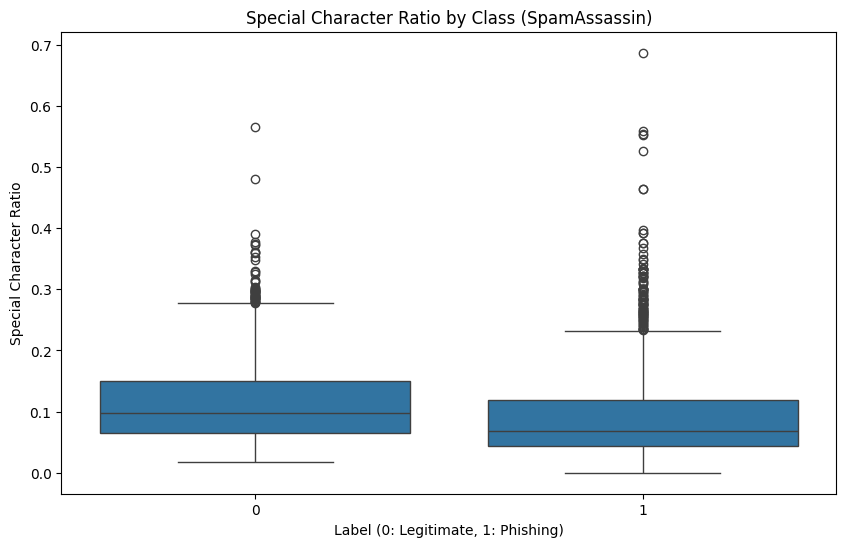

In [ ]:
import re

# Convert the 'body' column to strings
spamassassin['body'] = spamassassin['body'].astype(str)

# Function to count URLs
def count_urls(text):
    url_pattern = r'(https?://[^\s]+|http?://[^\s]+)'
    return len(re.findall(url_pattern, text))

# Apply function to body of emails
spamassassin['url_count'] = spamassassin['body'].apply(count_urls)

# Plot URL count distribution
plt.figure(figsize=(10,6))
sns.histplot(spamassassin['url_count'], bins=10, kde=True)
plt.title('Distribution of URL Count in Emails (SpamAssassin)')
plt.xlabel('Number of URLs')
plt.ylabel('Frequency')
plt.show()

# Compare URL count between phishing and legitimate emails
plt.figure(figsize=(10,6))
sns.boxplot(x='label', y='url_count', data=spamassassin)
plt.title('URL Count by Class (SpamAssassin)')
plt.xlabel('Label (0: Legitimate, 1: Phishing)')
plt.ylabel('Number of URLs')
plt.show()

# Function to calculate special character ratio
def get_special_char_ratio(text):
    special_chars = sum(not c.isalnum() and not c.isspace() for c in text)
    return special_chars / len(text) if len(text) > 0 else 0

# Apply function to body of emails
spamassassin['special_char_ratio'] = spamassassin['body'].apply(get_special_char_ratio)

# Plot special character ratio distribution
plt.figure(figsize=(10,6))
sns.histplot(spamassassin['special_char_ratio'], bins=50, kde=True)
plt.title('Distribution of Special Character Ratio in Emails (SpamAssassin)')
plt.xlabel('Special Character Ratio')
plt.ylabel('Frequency')
plt.show()

# Compare special character ratio between phishing and legitimate emails
plt.figure(figsize=(10,6))
sns.boxplot(x='label', y='special_char_ratio', data=spamassassin)
plt.title('Special Character Ratio by Class (SpamAssassin)')
plt.xlabel('Label (0: Legitimate, 1: Phishing)')
plt.ylabel('Special Character Ratio')
plt.show()


### Keyword Analysis

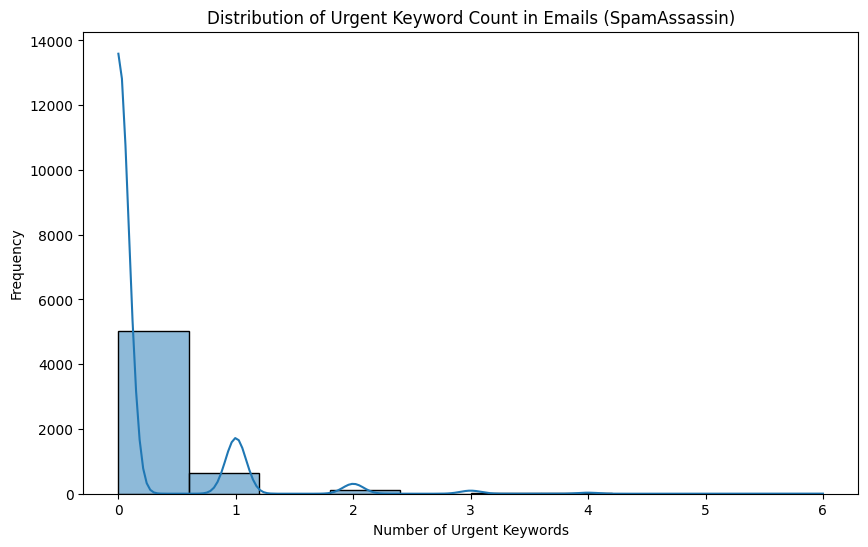

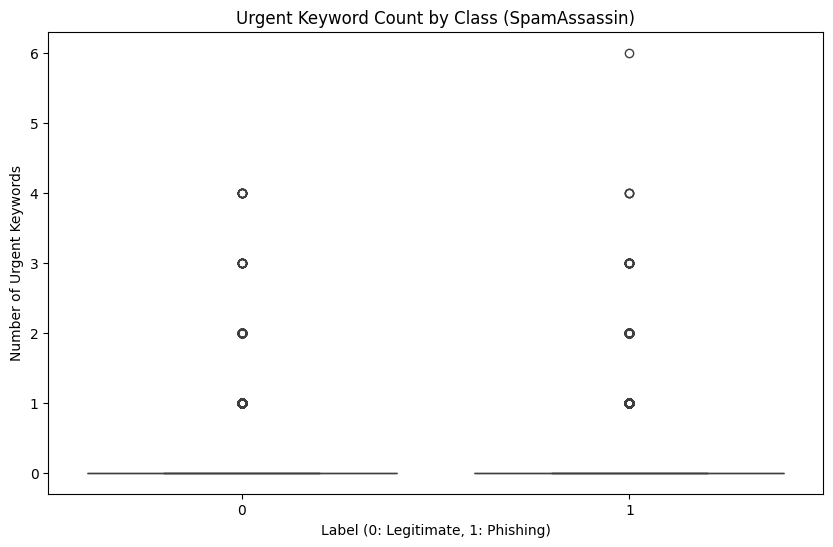

In [ ]:
def keyword_frequency(text, keywords):
    text = text.lower()
    return sum(keyword in text for keyword in keywords)

# Keywords for urgent action
urgent_keywords = [
    'urgent', 'immediately', 'asap', 'action required', 'important', 'critical', 'attention', 'prompt',
    'emergency', 'act now', 'time-sensitive', 'alert', 'high-priority', 'important update', 'do not ignore',
    'response needed', 'please respond'
]

# Apply keyword frequency function
spamassassin['urgent_keyword_count'] = spamassassin['body'].apply(lambda x: keyword_frequency(x, urgent_keywords))

# Plot urgent keyword count distribution
plt.figure(figsize=(10,6))
sns.histplot(spamassassin['urgent_keyword_count'], bins=10, kde=True)
plt.title('Distribution of Urgent Keyword Count in Emails (SpamAssassin)')
plt.xlabel('Number of Urgent Keywords')
plt.ylabel('Frequency')
plt.show()

# Compare urgent keyword count between phishing and legitimate emails
plt.figure(figsize=(10,6))
sns.boxplot(x='label', y='urgent_keyword_count', data=spamassassin)
plt.title('Urgent Keyword Count by Class (SpamAssassin)')
plt.xlabel('Label (0: Legitimate, 1: Phishing)')
plt.ylabel('Number of Urgent Keywords')
plt.show()


## EDA for TREC 06 Dataset

### Display First Few Rows

In [ ]:
print("TREC 06 Dataset Head:")
print(trec_1.head())

TREC 06 Dataset Head:
                                         sender  \
0                    jhpb@sarto.budd-lake.nj.us   
1            Stella Lowry <rookcuduq@yahoo.com>   
2       Walter <trwmpca@downtowncumberland.com>   
3  Scott Schwartz <schwartz@groucho.cs.psu.edu>   
4   Mr Jailyn Koepke <kiflsbizc@attheworld.com>   

                             receiver                             date  \
0                                 NaN  Tue, 28 Jul 1992 03:13:55 +0000   
1  Brian <bernice@groucho.cs.psu.edu>  Sat, 03 Apr 1993 10:34:36 -0500   
2           arline@groucho.cs.psu.edu  Tue, 06 Apr 1993 20:33:13 -0600   
3       9fans <plan9-fans@cs.psu.edu>  Fri, 09 Apr 1993 14:29:43 -0400   
4           melvin@groucho.cs.psu.edu  Fri, 09 Apr 1993 21:31:58 -0800   

                                        subject  \
0  new Catholic mailing list now up and running   
1                                       re[12]:   
2                Take a moment to explore this.   
3                     

### Shape, Statistics, Missing Values, and Data Types

In [ ]:
# Check the shape of the dataset
print("Shape of the SpamAssasin dataset:", trec_1.shape)

# Summary statistics
print("Summary Statistics:")
print(trec_1.describe())

# Check for missing values
print("Missing Values:")
print(trec_1.isnull().sum())

# Check the data types
print("Data Types:")
print(trec_1.dtypes)


Shape of the SpamAssasin dataset: (16400, 7)
Summary Statistics:
              label          urls
count  16400.000000  16400.000000
mean       0.243232      0.412561
std        0.429047      0.492310
min        0.000000      0.000000
25%        0.000000      0.000000
50%        0.000000      0.000000
75%        0.000000      1.000000
max        1.000000      1.000000
Missing Values:
sender      268
receiver    512
date        469
subject     336
body          1
label         0
urls          0
dtype: int64
Data Types:
sender      object
receiver    object
date        object
subject     object
body        object
label        int64
urls         int64
dtype: object


### Class Distribution

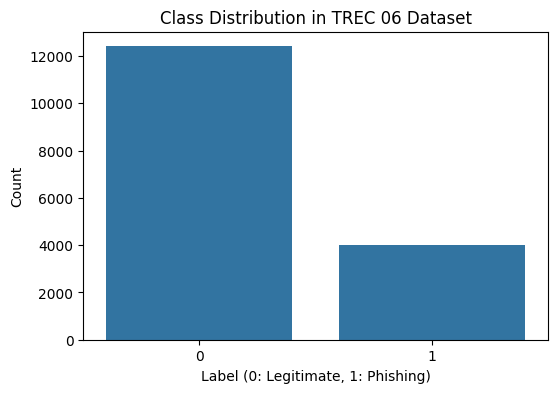

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Class distribution
plt.figure(figsize=(6,4))
sns.countplot(x='label', data=trec_1)
plt.title('Class Distribution in TREC 06 Dataset')
plt.xlabel('Label (0: Legitimate, 1: Phishing)')
plt.ylabel('Count')
plt.show()

### Length of Emails

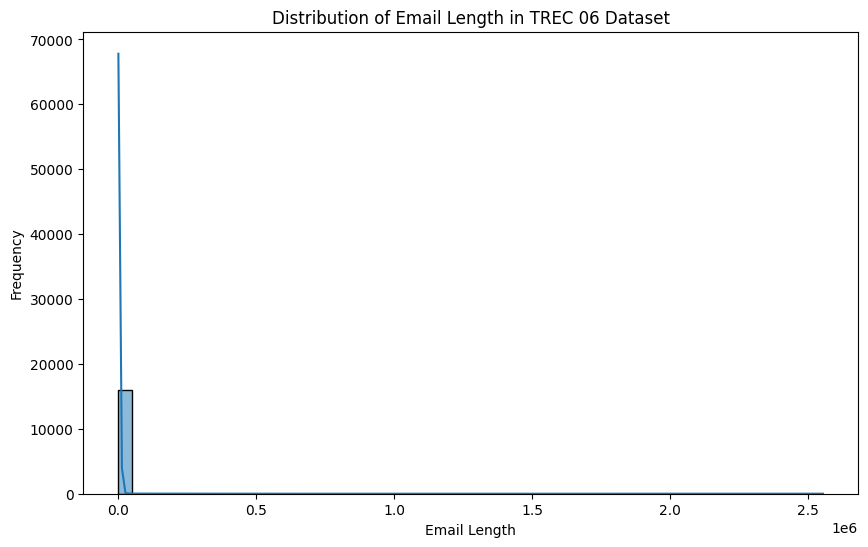

In [ ]:
# Calculate length of emails
trec_1['email_length'] = trec_1['subject'].str.len() + trec_1['body'].str.len()

# Plot email length distribution
plt.figure(figsize=(10,6))
sns.histplot(trec_1['email_length'], bins=50, kde=True)
plt.title('Distribution of Email Length in TREC 06 Dataset')
plt.xlabel('Email Length')
plt.ylabel('Frequency')
plt.show()


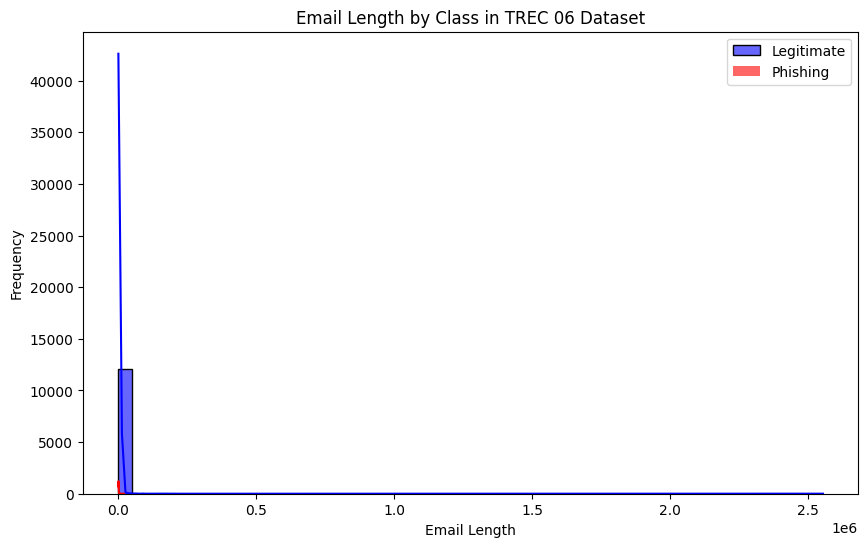

In [ ]:
# Compare lengths between phishing and legitimate emails
plt.figure(figsize=(10,6))
sns.histplot(trec_1[trec_1['label'] == 0]['email_length'], bins=50, kde=True, color='blue', label='Legitimate', alpha=0.6)
sns.histplot(trec_1[trec_1['label'] == 1]['email_length'], bins=50, kde=True, color='red', label='Phishing', alpha=0.6)
plt.title('Email Length by Class in TREC 06 Dataset')
plt.xlabel('Email Length')
plt.ylabel('Frequency')
plt.legend()
plt.show()

### Subject Line Analysis

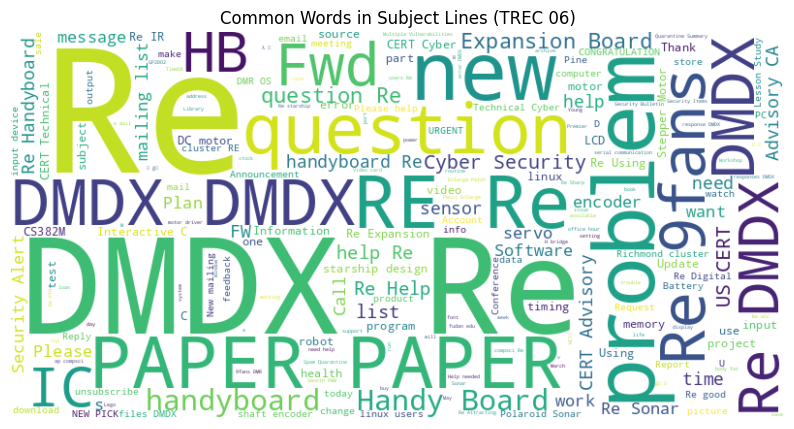

In [ ]:
from wordcloud import WordCloud

# Combine all subject lines
all_subjects = ' '.join(trec_1['subject'].dropna().values)

# Generate word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_subjects)

# Plot word cloud
plt.figure(figsize=(10,6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Common Words in Subject Lines (TREC 06)')
plt.show()

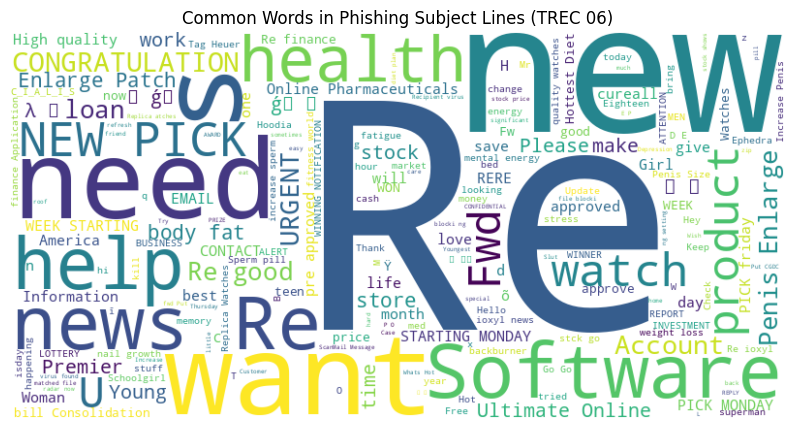

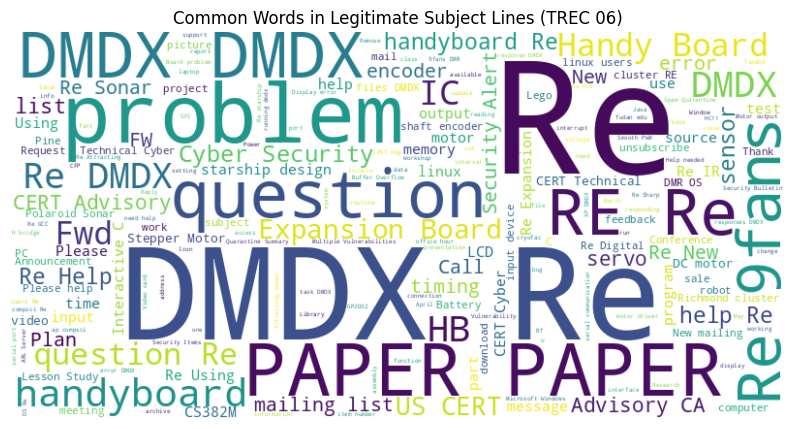

In [ ]:
# Separate word clouds for phishing and legitimate emails
phishing_subjects = ' '.join(trec_1[trec_1['label'] == 1]['subject'].dropna().values)
legit_subjects = ' '.join(trec_1[trec_1['label'] == 0]['subject'].dropna().values)

# Phishing word cloud
wordcloud_phishing = WordCloud(width=800, height=400, background_color='white').generate(phishing_subjects)
plt.figure(figsize=(10,6))
plt.imshow(wordcloud_phishing, interpolation='bilinear')
plt.axis('off')
plt.title('Common Words in Phishing Subject Lines (TREC 06)')
plt.show()

# Legitimate word cloud
wordcloud_legit = WordCloud(width=800, height=400, background_color='white').generate(legit_subjects)
plt.figure(figsize=(10,6))
plt.imshow(wordcloud_legit, interpolation='bilinear')
plt.axis('off')
plt.title('Common Words in Legitimate Subject Lines (TREC 06)')
plt.show()

### URLs and Special Characters

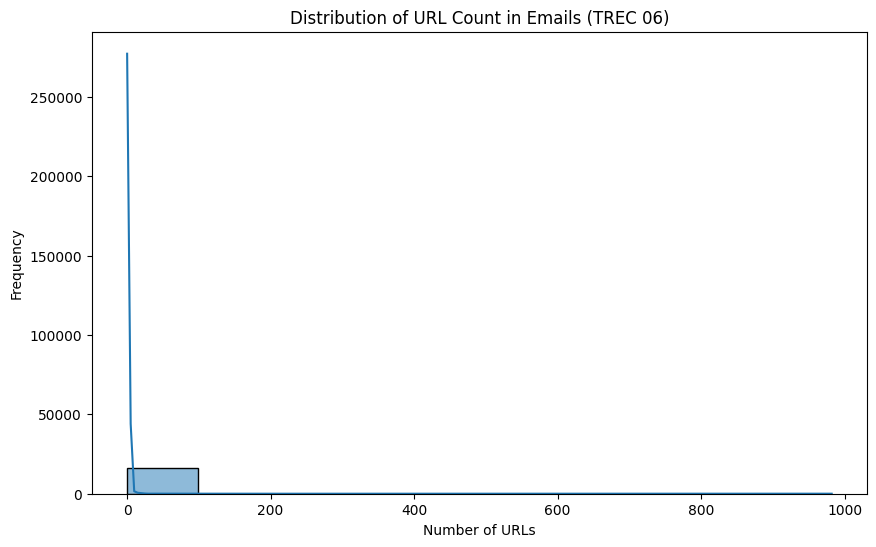

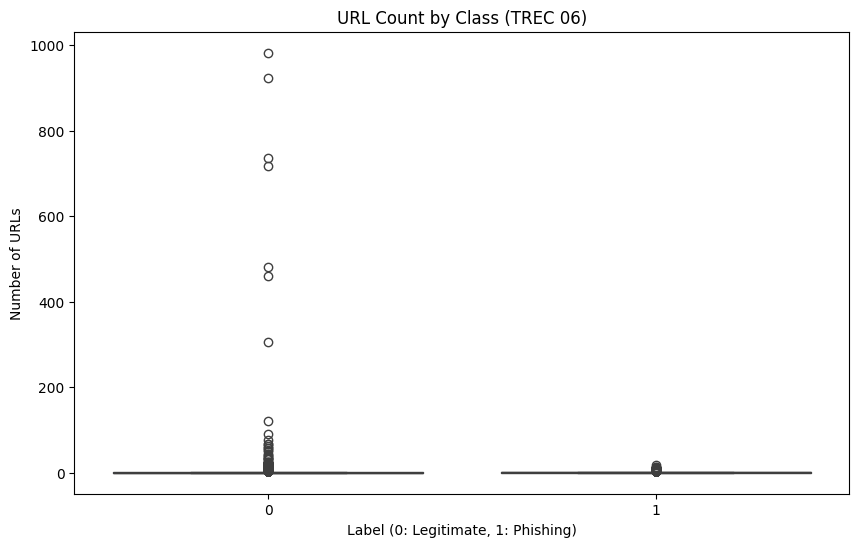

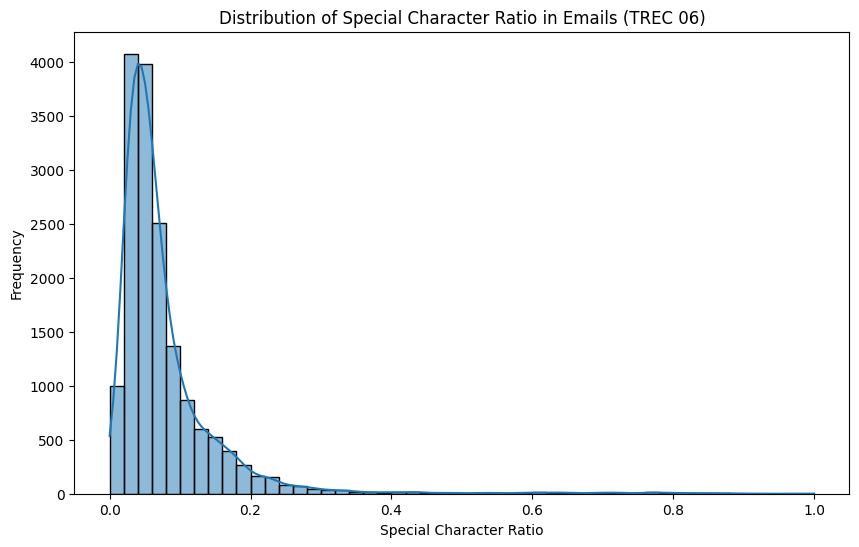

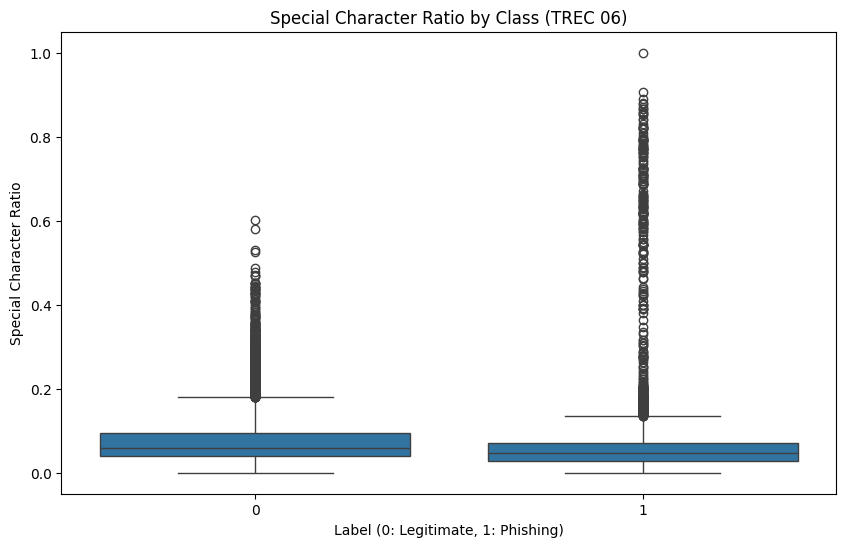

In [ ]:
import re

# Convert the 'body' column to strings
trec_1['body'] = trec_1['body'].astype(str)

# Function to count URLs
def count_urls(text):
    url_pattern = r'(https?://[^\s]+|http?://[^\s]+)'
    return len(re.findall(url_pattern, text))

# Apply function to body of emails
trec_1['url_count'] = trec_1['body'].apply(count_urls)

# Plot URL count distribution
plt.figure(figsize=(10,6))
sns.histplot(trec_1['url_count'], bins=10, kde=True)
plt.title('Distribution of URL Count in Emails (TREC 06)')
plt.xlabel('Number of URLs')
plt.ylabel('Frequency')
plt.show()

# Compare URL count between phishing and legitimate emails
plt.figure(figsize=(10,6))
sns.boxplot(x='label', y='url_count', data=trec_1)
plt.title('URL Count by Class (TREC 06)')
plt.xlabel('Label (0: Legitimate, 1: Phishing)')
plt.ylabel('Number of URLs')
plt.show()

# Function to calculate special character ratio
def get_special_char_ratio(text):
    special_chars = sum(not c.isalnum() and not c.isspace() for c in text)
    return special_chars / len(text) if len(text) > 0 else 0

# Apply function to body of emails
trec_1['special_char_ratio'] = trec_1['body'].apply(get_special_char_ratio)

# Plot special character ratio distribution
plt.figure(figsize=(10,6))
sns.histplot(trec_1['special_char_ratio'], bins=50, kde=True)
plt.title('Distribution of Special Character Ratio in Emails (TREC 06)')
plt.xlabel('Special Character Ratio')
plt.ylabel('Frequency')
plt.show()

# Compare special character ratio between phishing and legitimate emails
plt.figure(figsize=(10,6))
sns.boxplot(x='label', y='special_char_ratio', data=trec_1)
plt.title('Special Character Ratio by Class (TREC 06)')
plt.xlabel('Label (0: Legitimate, 1: Phishing)')
plt.ylabel('Special Character Ratio')
plt.show()


### Keyword Analysis

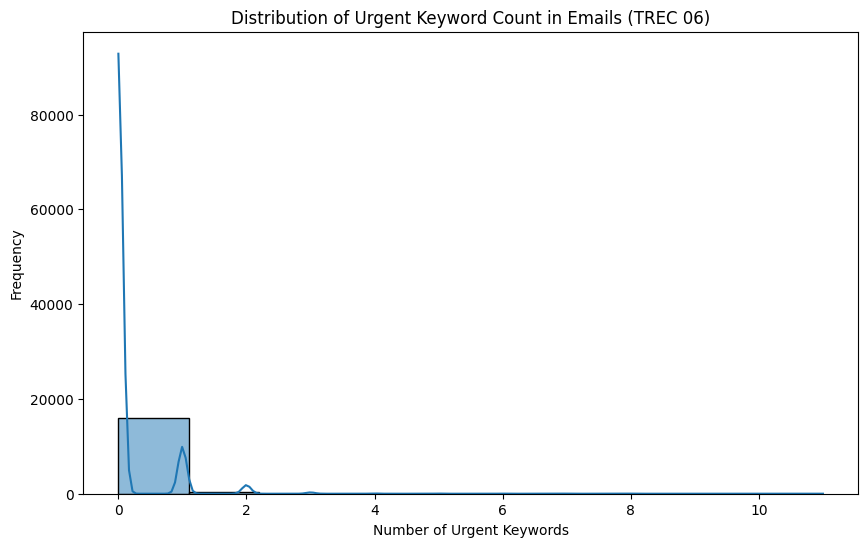

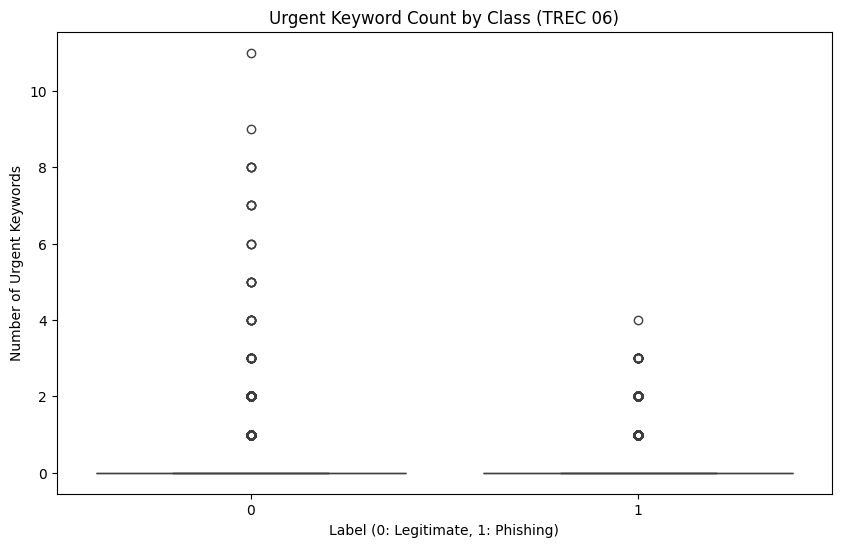

In [ ]:
def keyword_frequency(text, keywords):
    text = text.lower()
    return sum(keyword in text for keyword in keywords)

# Keywords for urgent action
urgent_keywords = [
    'urgent', 'immediately', 'asap', 'action required', 'important', 'critical', 'attention', 'prompt',
    'emergency', 'act now', 'time-sensitive', 'alert', 'high-priority', 'important update', 'do not ignore',
    'response needed', 'please respond'
]

# Apply keyword frequency function
trec_1['urgent_keyword_count'] = trec_1['body'].apply(lambda x: keyword_frequency(x, urgent_keywords))

# Plot urgent keyword count distribution
plt.figure(figsize=(10,6))
sns.histplot(trec_1['urgent_keyword_count'], bins=10, kde=True)
plt.title('Distribution of Urgent Keyword Count in Emails (TREC 06)')
plt.xlabel('Number of Urgent Keywords')
plt.ylabel('Frequency')
plt.show()

# Compare urgent keyword count between phishing and legitimate emails
plt.figure(figsize=(10,6))
sns.boxplot(x='label', y='urgent_keyword_count', data=trec_1)
plt.title('Urgent Keyword Count by Class (TREC 06)')
plt.xlabel('Label (0: Legitimate, 1: Phishing)')
plt.ylabel('Number of Urgent Keywords')
plt.show()


## EDA for TREC 05 Dataset

### Display First Few Rows

In [ ]:
print("TREC 05 Dataset Head:")
print(trec_2.head())

TREC 05 Dataset Head:
                                              sender  \
0                 "Hu, Sylvia" <Sylvia.Hu@ENRON.com>   
1                   "Webb, Jay" <Jay.Webb@ENRON.com>   
2               "Symms, Mark" <Mark.Symms@ENRON.com>   
3             "Thorne, Judy" <Judy.Thorne@ENRON.com>   
4  "Williams, Jason R (Credit)" <Jason.R.Williams...   

                                            receiver  \
0  "Acevedo, Felecia" <Felecia.Acevedo@ENRON.com>...   
1           "Lambie, Chris" <Chris.Lambie@ENRON.com>   
2        "Thomas, Paul D." <Paul.D.Thomas@ENRON.com>   
3  "Grass, John" <John.Grass@ENRON.com>, "Nemec, ...   
4  "Nemec, Gerald" <Gerald.Nemec@ENRON.com>, "Dic...   

                              date  \
0  Fri, 29 Jun 2001 08:36:09 -0500   
1  Fri, 29 Jun 2001 09:37:04 -0500   
2  Fri, 29 Jun 2001 08:39:30 -0500   
3  Fri, 29 Jun 2001 10:35:17 -0500   
4  Fri, 29 Jun 2001 10:40:02 -0500   

                                       subject  \
0  FW: June 29 -- BNA, In

### Shape, Statistics, Missing Values, and Data Types

In [ ]:
# Check the shape of the dataset
print("Shape of the TREC 05 dataset:", trec_2.shape)

# Summary statistics
print("Summary Statistics:")
print(trec_2.describe())

# Check for missing values
print("Missing Values:")
print(trec_2.isnull().sum())

# Check the data types
print("Data Types:")
print(trec_2.dtypes)


Shape of the TREC 05 dataset: (55275, 7)
Summary Statistics:
              label          urls
count  55275.000000  55275.000000
mean       0.415124      0.444830
std        0.492748      0.496951
min        0.000000      0.000000
25%        0.000000      0.000000
50%        0.000000      0.000000
75%        1.000000      1.000000
max        1.000000      1.000000
Missing Values:
sender        16
receiver    1780
date        1331
subject     1319
body           1
label          0
urls           0
dtype: int64
Data Types:
sender      object
receiver    object
date        object
subject     object
body        object
label        int64
urls         int64
dtype: object


### Class Distribution

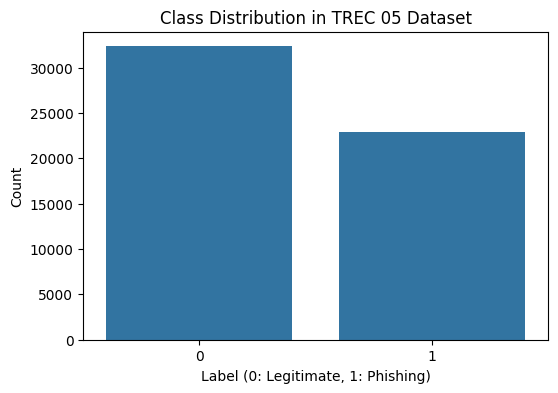

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Class distribution
plt.figure(figsize=(6,4))
sns.countplot(x='label', data=trec_2)
plt.title('Class Distribution in TREC 05 Dataset')
plt.xlabel('Label (0: Legitimate, 1: Phishing)')
plt.ylabel('Count')
plt.show()

### Length of Emails

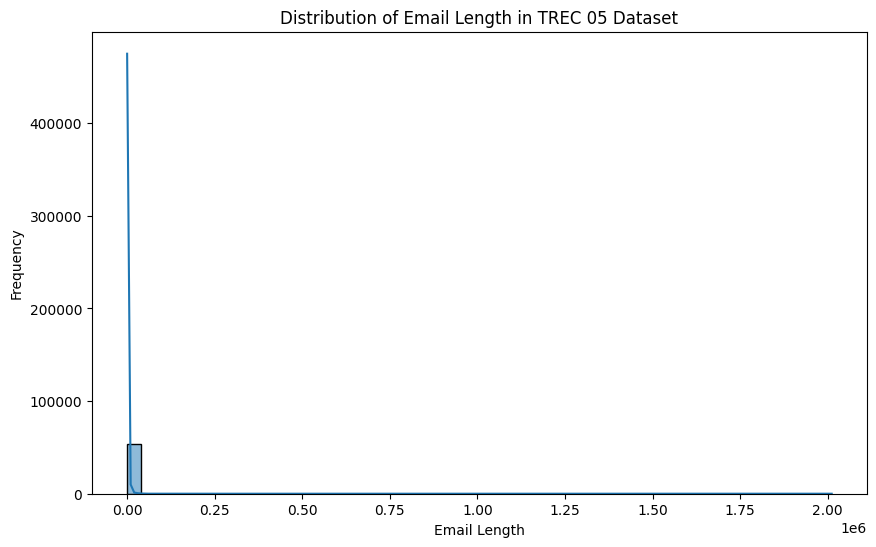

In [ ]:
# Calculate length of emails
trec_2['email_length'] = trec_2['subject'].str.len() + trec_2['body'].str.len()

# Plot email length distribution
plt.figure(figsize=(10,6))
sns.histplot(trec_2['email_length'], bins=50, kde=True)
plt.title('Distribution of Email Length in TREC 05 Dataset')
plt.xlabel('Email Length')
plt.ylabel('Frequency')
plt.show()


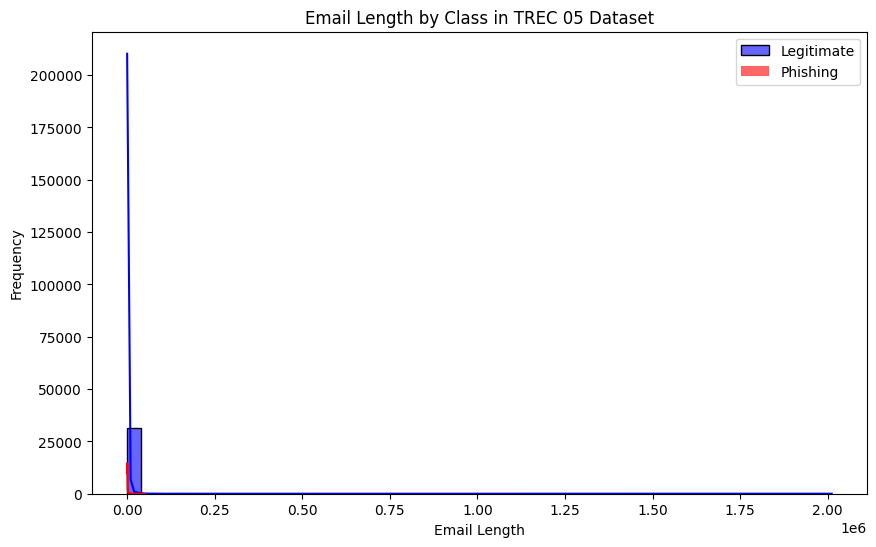

In [ ]:
# Compare lengths between phishing and legitimate emails
plt.figure(figsize=(10,6))
sns.histplot(trec_2[trec_2['label'] == 0]['email_length'], bins=50, kde=True, color='blue', label='Legitimate', alpha=0.6)
sns.histplot(trec_2[trec_2['label'] == 1]['email_length'], bins=50, kde=True, color='red', label='Phishing', alpha=0.6)
plt.title('Email Length by Class in TREC 05 Dataset')
plt.xlabel('Email Length')
plt.ylabel('Frequency')
plt.legend()
plt.show()

### Subject Line Analysis

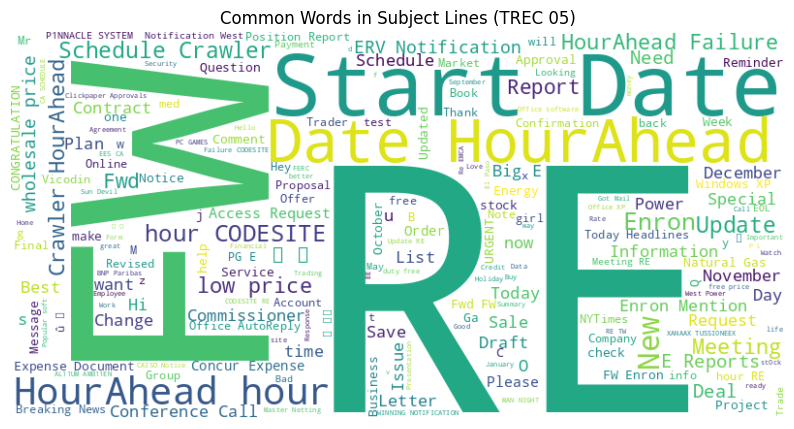

In [ ]:
from wordcloud import WordCloud

# Combine all subject lines
all_subjects = ' '.join(trec_2['subject'].dropna().values)

# Generate word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_subjects)

# Plot word cloud
plt.figure(figsize=(10,6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Common Words in Subject Lines (TREC 05)')
plt.show()

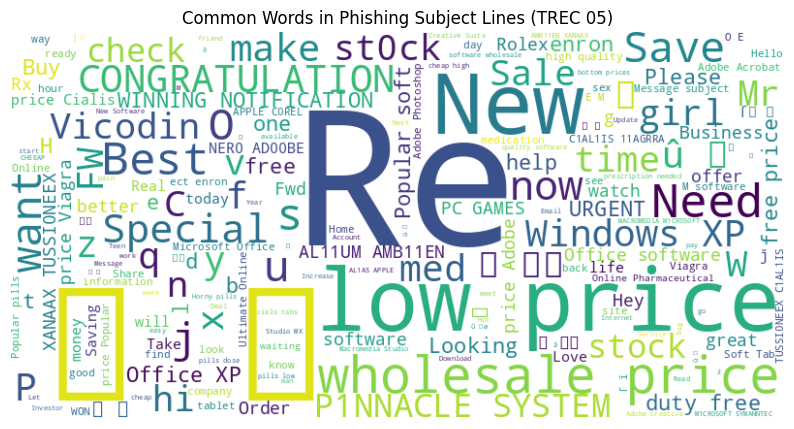

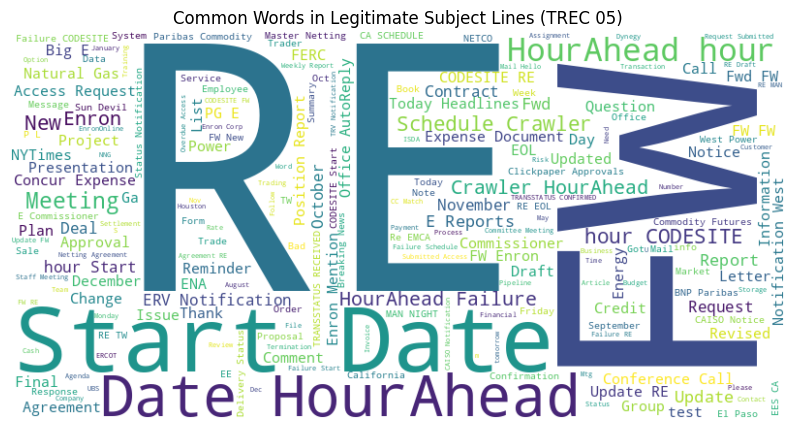

In [ ]:
# Separate word clouds for phishing and legitimate emails
phishing_subjects = ' '.join(trec_2[trec_2['label'] == 1]['subject'].dropna().values)
legit_subjects = ' '.join(trec_2[trec_2['label'] == 0]['subject'].dropna().values)

# Phishing word cloud
wordcloud_phishing = WordCloud(width=800, height=400, background_color='white').generate(phishing_subjects)
plt.figure(figsize=(10,6))
plt.imshow(wordcloud_phishing, interpolation='bilinear')
plt.axis('off')
plt.title('Common Words in Phishing Subject Lines (TREC 05)')
plt.show()

# Legitimate word cloud
wordcloud_legit = WordCloud(width=800, height=400, background_color='white').generate(legit_subjects)
plt.figure(figsize=(10,6))
plt.imshow(wordcloud_legit, interpolation='bilinear')
plt.axis('off')
plt.title('Common Words in Legitimate Subject Lines (TREC 05)')
plt.show()

### URLs and Special Characters

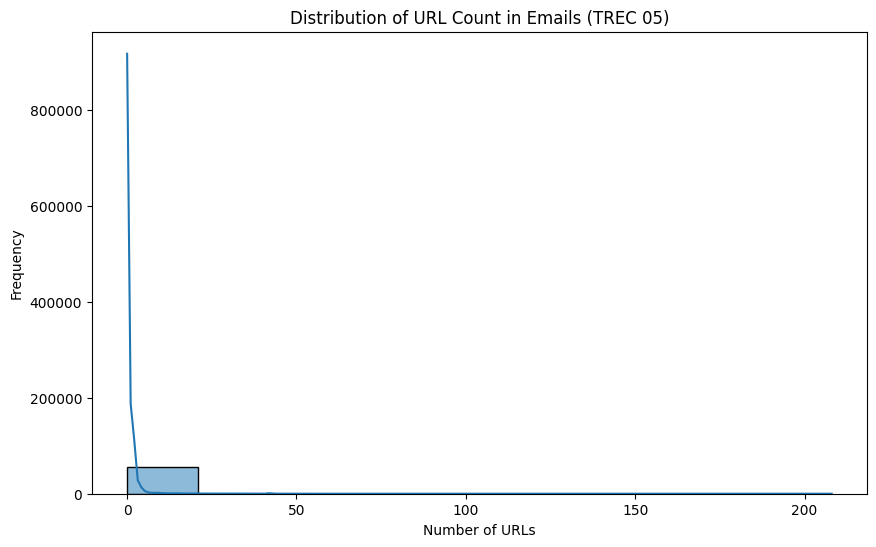

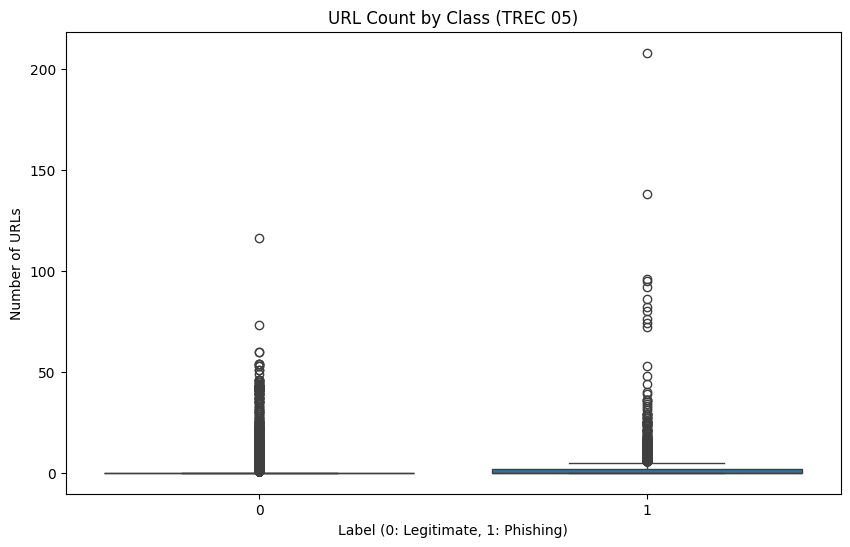

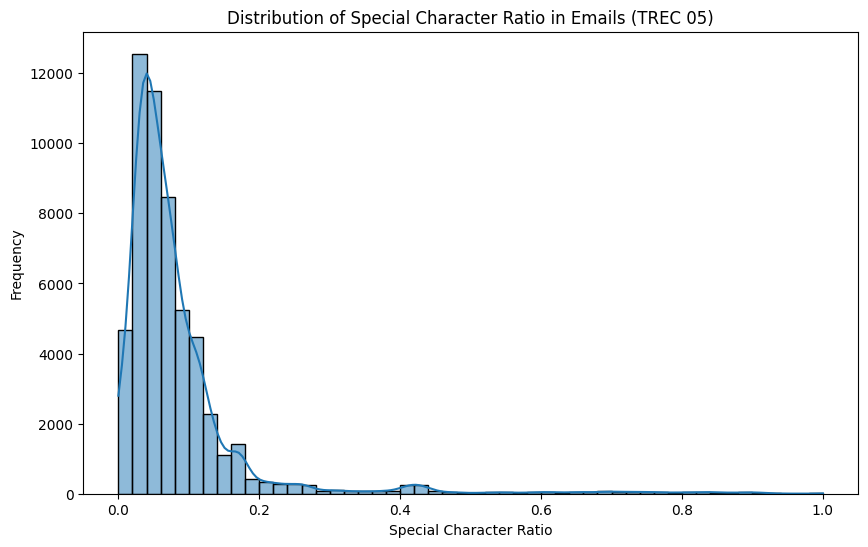

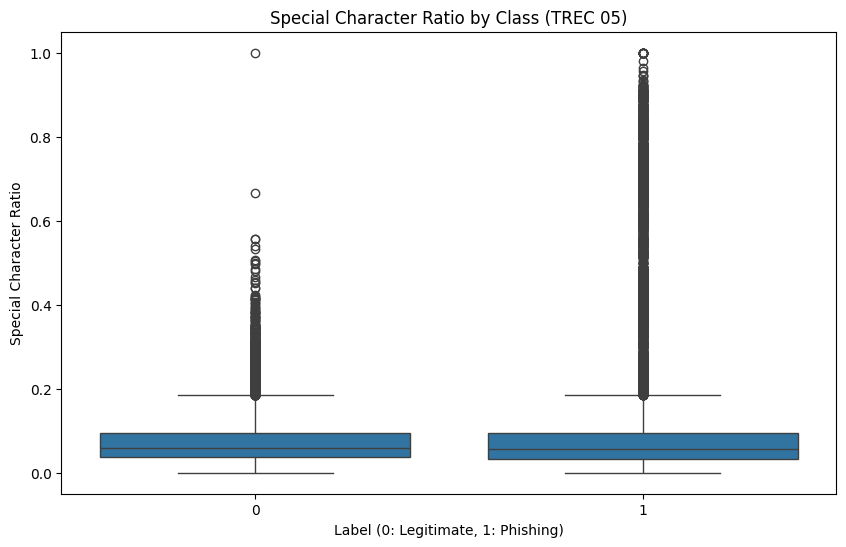

In [ ]:
import re

# Convert the 'body' column to strings
trec_2['body'] = trec_2['body'].astype(str)

# Function to count URLs
def count_urls(text):
    url_pattern = r'(https?://[^\s]+|http?://[^\s]+)'
    return len(re.findall(url_pattern, text))

# Apply function to body of emails
trec_2['url_count'] = trec_2['body'].apply(count_urls)

# Plot URL count distribution
plt.figure(figsize=(10,6))
sns.histplot(trec_2['url_count'], bins=10, kde=True)
plt.title('Distribution of URL Count in Emails (TREC 05)')
plt.xlabel('Number of URLs')
plt.ylabel('Frequency')
plt.show()

# Compare URL count between phishing and legitimate emails
plt.figure(figsize=(10,6))
sns.boxplot(x='label', y='url_count', data=trec_2)
plt.title('URL Count by Class (TREC 05)')
plt.xlabel('Label (0: Legitimate, 1: Phishing)')
plt.ylabel('Number of URLs')
plt.show()

# Function to calculate special character ratio
def get_special_char_ratio(text):
    special_chars = sum(not c.isalnum() and not c.isspace() for c in text)
    return special_chars / len(text) if len(text) > 0 else 0

# Apply function to body of emails
trec_2['special_char_ratio'] = trec_2['body'].apply(get_special_char_ratio)

# Plot special character ratio distribution
plt.figure(figsize=(10,6))
sns.histplot(trec_2['special_char_ratio'], bins=50, kde=True)
plt.title('Distribution of Special Character Ratio in Emails (TREC 05)')
plt.xlabel('Special Character Ratio')
plt.ylabel('Frequency')
plt.show()

# Compare special character ratio between phishing and legitimate emails
plt.figure(figsize=(10,6))
sns.boxplot(x='label', y='special_char_ratio', data=trec_2)
plt.title('Special Character Ratio by Class (TREC 05)')
plt.xlabel('Label (0: Legitimate, 1: Phishing)')
plt.ylabel('Special Character Ratio')
plt.show()


### Keyword Analysis

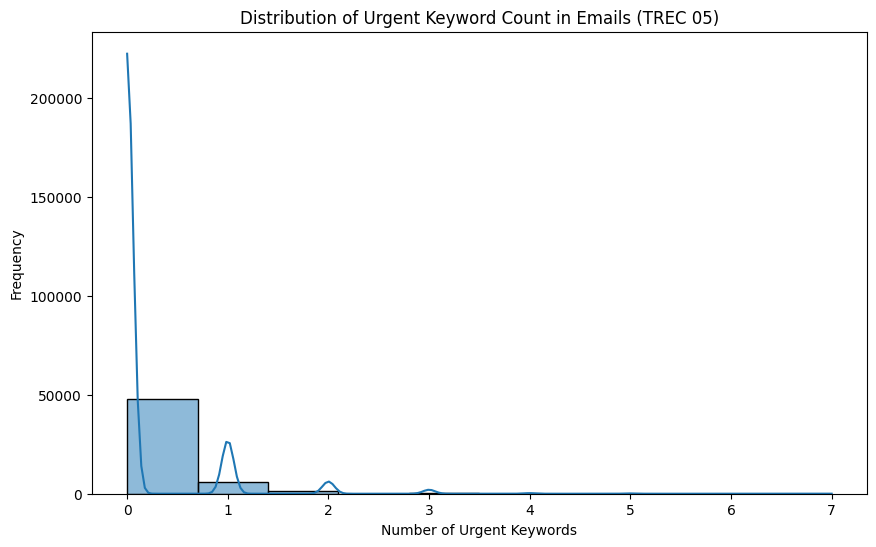

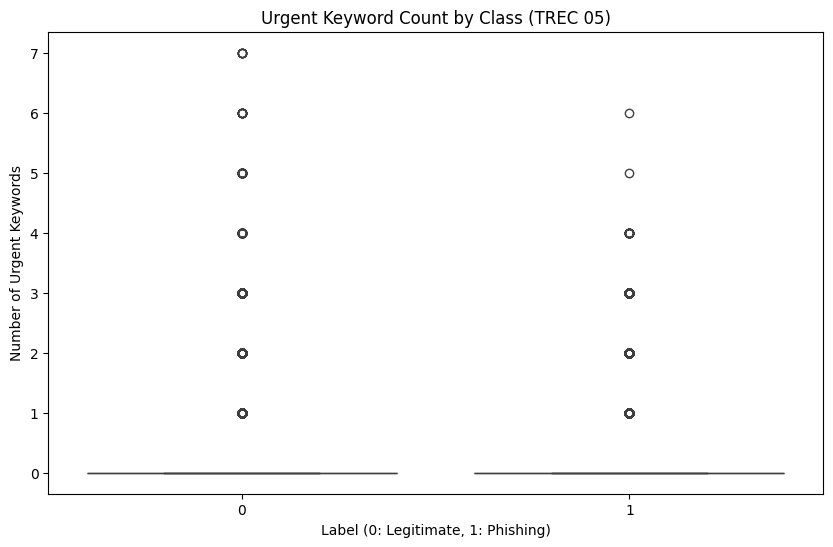

In [ ]:
def keyword_frequency(text, keywords):
    text = text.lower()
    return sum(keyword in text for keyword in keywords)

# Keywords for urgent action
urgent_keywords = [
    'urgent', 'immediately', 'asap', 'action required', 'important', 'critical', 'attention', 'prompt',
    'emergency', 'act now', 'time-sensitive', 'alert', 'high-priority', 'important update', 'do not ignore',
    'response needed', 'please respond'
]

# Apply keyword frequency function
trec_2['urgent_keyword_count'] = trec_2['body'].apply(lambda x: keyword_frequency(x, urgent_keywords))

# Plot urgent keyword count distribution
plt.figure(figsize=(10,6))
sns.histplot(trec_2['urgent_keyword_count'], bins=10, kde=True)
plt.title('Distribution of Urgent Keyword Count in Emails (TREC 05)')
plt.xlabel('Number of Urgent Keywords')
plt.ylabel('Frequency')
plt.show()

# Compare urgent keyword count between phishing and legitimate emails
plt.figure(figsize=(10,6))
sns.boxplot(x='label', y='urgent_keyword_count', data=trec_2)
plt.title('Urgent Keyword Count by Class (TREC 05)')
plt.xlabel('Label (0: Legitimate, 1: Phishing)')
plt.ylabel('Number of Urgent Keywords')
plt.show()


## EDA for TREC 07 Dataset

### Display First Few Rows

In [ ]:
print("TREC 07 Dataset Head:")
print(trec_3.head())

TREC 07 Dataset Head:
                                              sender  \
0                   Tomas Jacobs <RickyAmes@aol.com>   
1         Yan Morin <yan.morin@savoirfairelinux.com>   
2  Sheila Crenshaw <7stocknews@tractionmarketing....   
3         Stormy Dempsey <vqucsmdfgvsg@ruraltek.com>   
4         "Christi T. Jernigan" <dcube@totalink.net>   

                          receiver                             date  \
0        the00@speedy.uwaterloo.ca  Sun, 08 Apr 2007 21:00:48 +0300   
1  debian-mirrors@lists.debian.org  Sun, 08 Apr 2007 12:52:30 -0400   
2           the00@plg.uwaterloo.ca  Sun, 08 Apr 2007 17:12:19 +0000   
3         opt4@speedy.uwaterloo.ca  Sun, 08 Apr 2007 17:15:47 -0100   
4     ktwarwic@speedy.uwaterloo.ca  Sun, 08 Apr 2007 19:19:07 +0200   

                                             subject  \
0                  Generic Cialis, branded quality@    
1                             Typo in /debian/README   
2                                   authentic 

### Shape, Statistics, Missing Values, and Data Types

In [ ]:
# Check the shape of the dataset
print("Shape of the TREC 07 dataset:", trec_3.shape)

# Summary statistics
print("Summary Statistics:")
print(trec_3.describe())

# Check for missing values
print("Missing Values:")
print(trec_3.isnull().sum())

# Check the data types
print("Data Types:")
print(trec_3.dtypes)


Shape of the TREC 07 dataset: (53757, 7)
Summary Statistics:
              label          urls
count  53757.000000  53757.000000
mean       0.546887      0.561936
std        0.497801      0.496154
min        0.000000      0.000000
25%        0.000000      0.000000
50%        1.000000      1.000000
75%        1.000000      1.000000
max        1.000000      1.000000
Missing Values:
sender        0
receiver    325
date         23
subject     449
body          0
label         0
urls          0
dtype: int64
Data Types:
sender      object
receiver    object
date        object
subject     object
body        object
label        int64
urls         int64
dtype: object


### Class Distribution

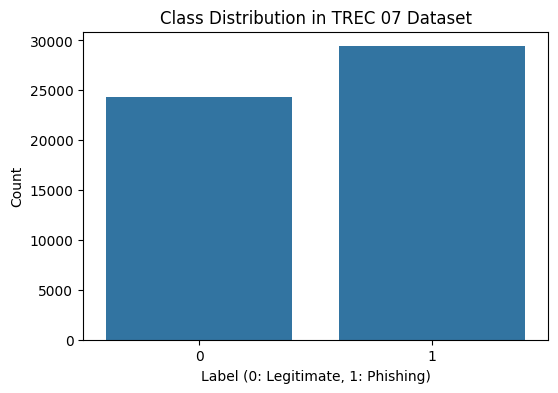

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Class distribution
plt.figure(figsize=(6,4))
sns.countplot(x='label', data=trec_3)
plt.title('Class Distribution in TREC 07 Dataset')
plt.xlabel('Label (0: Legitimate, 1: Phishing)')
plt.ylabel('Count')
plt.show()

### Length of Emails

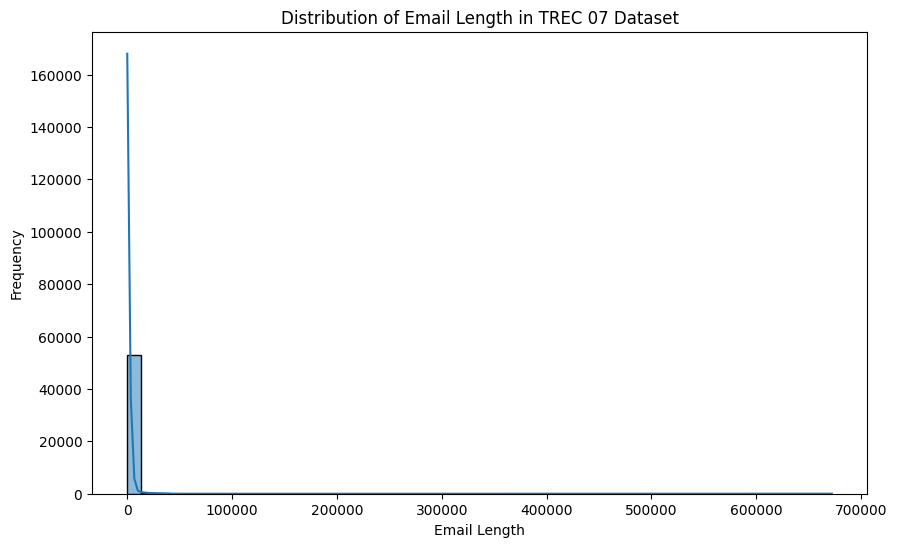

In [ ]:
# Calculate length of emails
trec_3['email_length'] = trec_3['subject'].str.len() + trec_3['body'].str.len()

# Plot email length distribution
plt.figure(figsize=(10,6))
sns.histplot(trec_3['email_length'], bins=50, kde=True)
plt.title('Distribution of Email Length in TREC 07 Dataset')
plt.xlabel('Email Length')
plt.ylabel('Frequency')
plt.show()


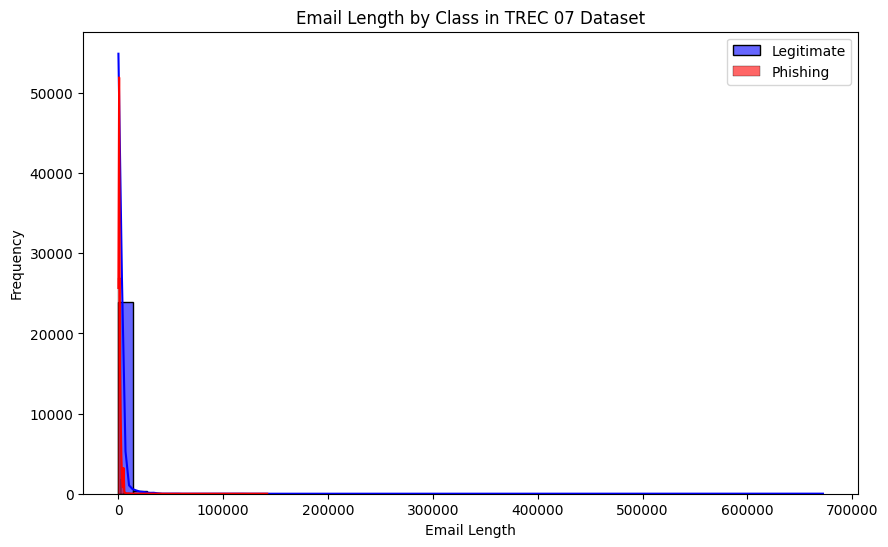

In [ ]:
# Compare lengths between phishing and legitimate emails
plt.figure(figsize=(10,6))
sns.histplot(trec_3[trec_3['label'] == 0]['email_length'], bins=50, kde=True, color='blue', label='Legitimate', alpha=0.6)
sns.histplot(trec_3[trec_3['label'] == 1]['email_length'], bins=50, kde=True, color='red', label='Phishing', alpha=0.6)
plt.title('Email Length by Class in TREC 07 Dataset')
plt.xlabel('Email Length')
plt.ylabel('Frequency')
plt.legend()
plt.show()

### Subject Line Analysis

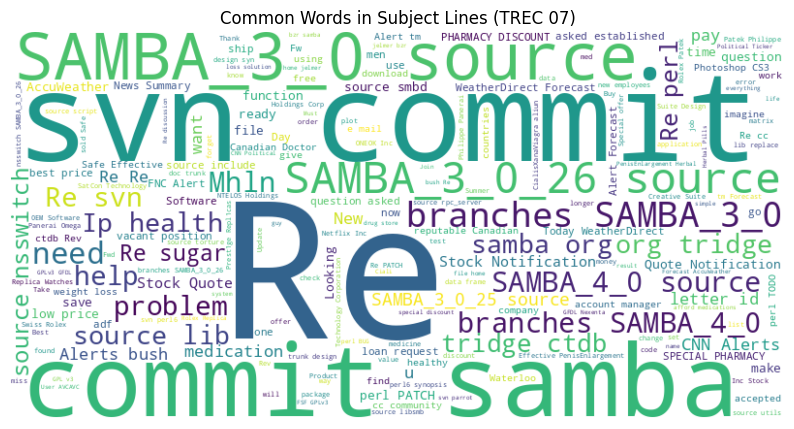

In [ ]:
from wordcloud import WordCloud

# Combine all subject lines
all_subjects = ' '.join(trec_3['subject'].dropna().values)

# Generate word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_subjects)

# Plot word cloud
plt.figure(figsize=(10,6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Common Words in Subject Lines (TREC 07)')
plt.show()

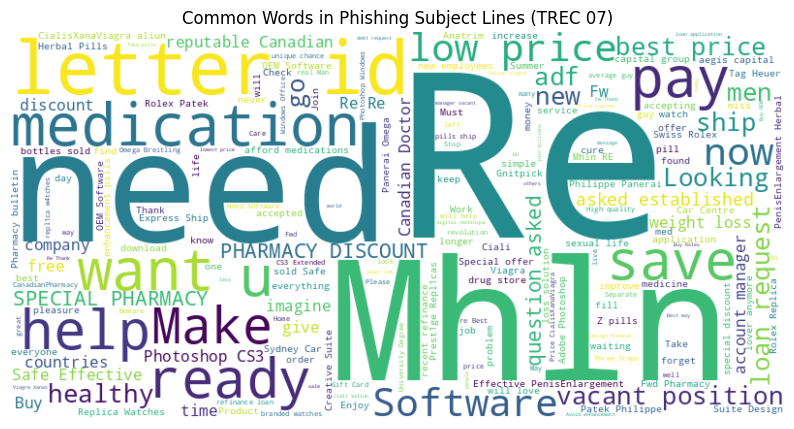

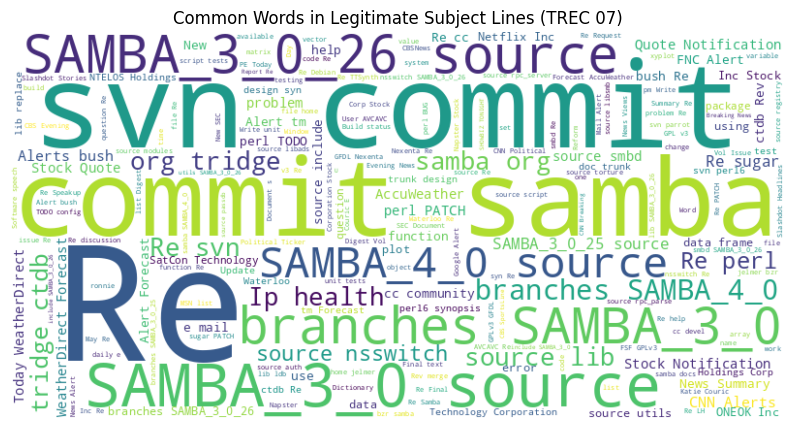

In [ ]:
# Separate word clouds for phishing and legitimate emails
phishing_subjects = ' '.join(trec_3[trec_3['label'] == 1]['subject'].dropna().values)
legit_subjects = ' '.join(trec_3[trec_3['label'] == 0]['subject'].dropna().values)

# Phishing word cloud
wordcloud_phishing = WordCloud(width=800, height=400, background_color='white').generate(phishing_subjects)
plt.figure(figsize=(10,6))
plt.imshow(wordcloud_phishing, interpolation='bilinear')
plt.axis('off')
plt.title('Common Words in Phishing Subject Lines (TREC 07)')
plt.show()

# Legitimate word cloud
wordcloud_legit = WordCloud(width=800, height=400, background_color='white').generate(legit_subjects)
plt.figure(figsize=(10,6))
plt.imshow(wordcloud_legit, interpolation='bilinear')
plt.axis('off')
plt.title('Common Words in Legitimate Subject Lines (TREC 07)')
plt.show()

### URLs and Special Characters

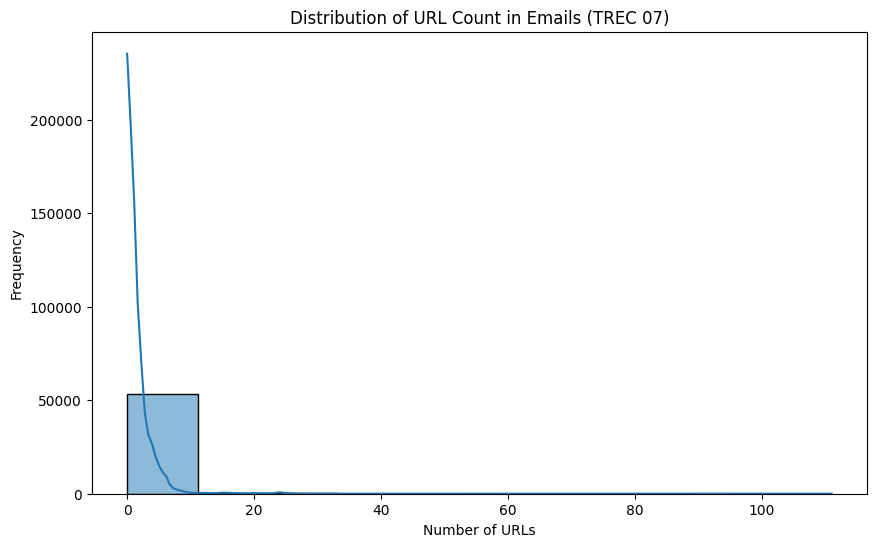

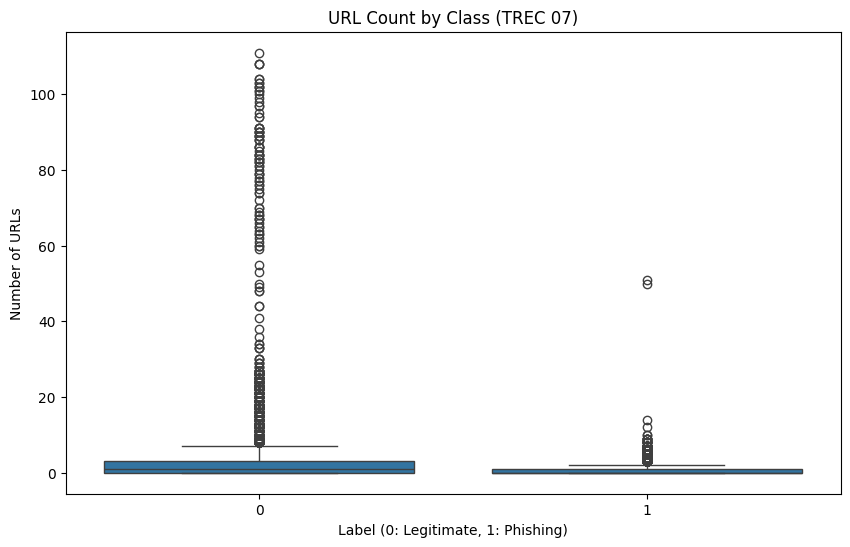

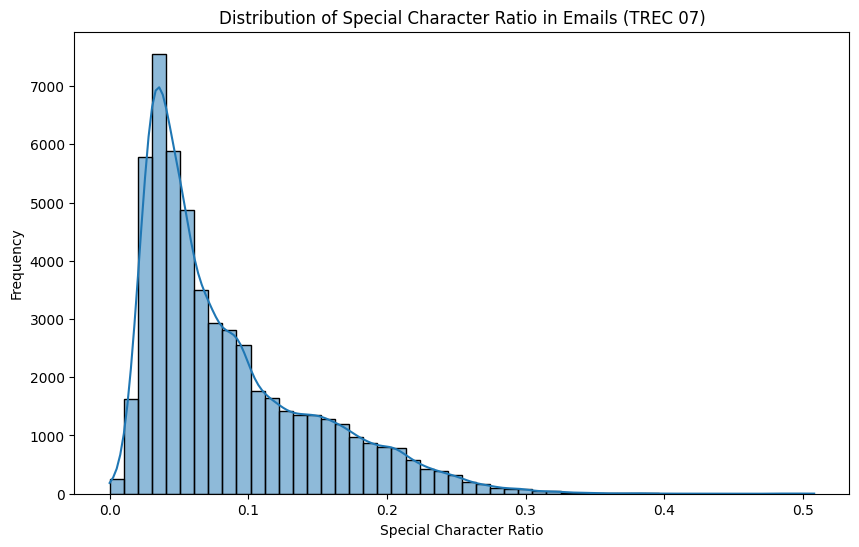

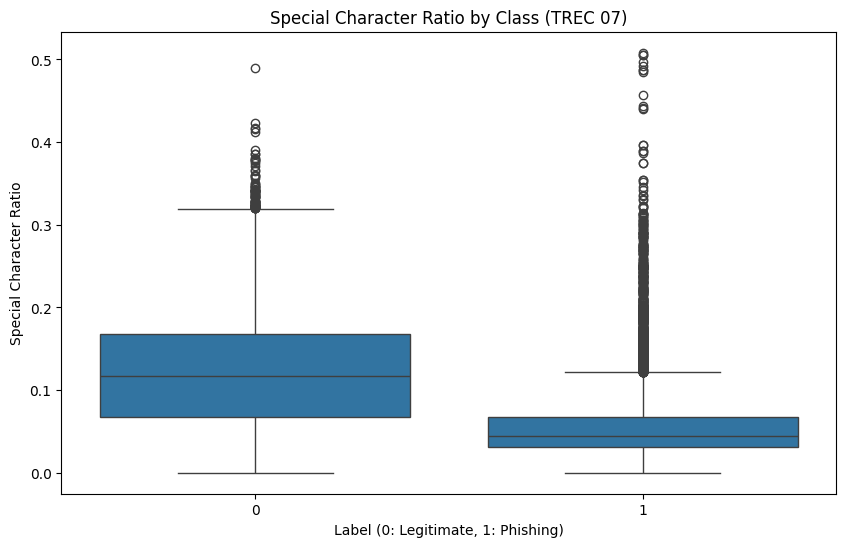

In [ ]:
import re

# Convert the 'body' column to strings
trec_3['body'] = trec_3['body'].astype(str)

# Function to count URLs
def count_urls(text):
    url_pattern = r'(https?://[^\s]+|http?://[^\s]+)'
    return len(re.findall(url_pattern, text))

# Apply function to body of emails
trec_3['url_count'] = trec_3['body'].apply(count_urls)

# Plot URL count distribution
plt.figure(figsize=(10,6))
sns.histplot(trec_3['url_count'], bins=10, kde=True)
plt.title('Distribution of URL Count in Emails (TREC 07)')
plt.xlabel('Number of URLs')
plt.ylabel('Frequency')
plt.show()

# Compare URL count between phishing and legitimate emails
plt.figure(figsize=(10,6))
sns.boxplot(x='label', y='url_count', data=trec_3)
plt.title('URL Count by Class (TREC 07)')
plt.xlabel('Label (0: Legitimate, 1: Phishing)')
plt.ylabel('Number of URLs')
plt.show()

# Function to calculate special character ratio
def get_special_char_ratio(text):
    special_chars = sum(not c.isalnum() and not c.isspace() for c in text)
    return special_chars / len(text) if len(text) > 0 else 0

# Apply function to body of emails
trec_3['special_char_ratio'] = trec_3['body'].apply(get_special_char_ratio)

# Plot special character ratio distribution
plt.figure(figsize=(10,6))
sns.histplot(trec_3['special_char_ratio'], bins=50, kde=True)
plt.title('Distribution of Special Character Ratio in Emails (TREC 07)')
plt.xlabel('Special Character Ratio')
plt.ylabel('Frequency')
plt.show()

# Compare special character ratio between phishing and legitimate emails
plt.figure(figsize=(10,6))
sns.boxplot(x='label', y='special_char_ratio', data=trec_3)
plt.title('Special Character Ratio by Class (TREC 07)')
plt.xlabel('Label (0: Legitimate, 1: Phishing)')
plt.ylabel('Special Character Ratio')
plt.show()


### Keyword Analysis

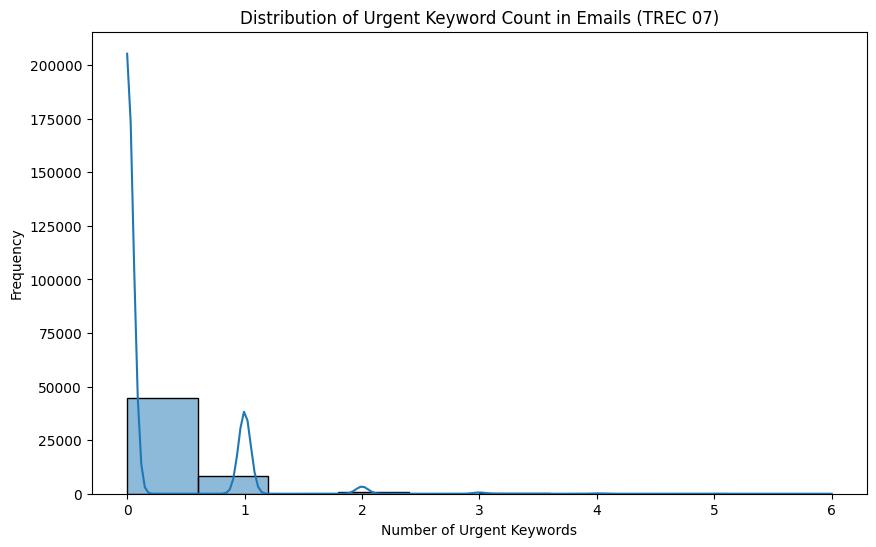

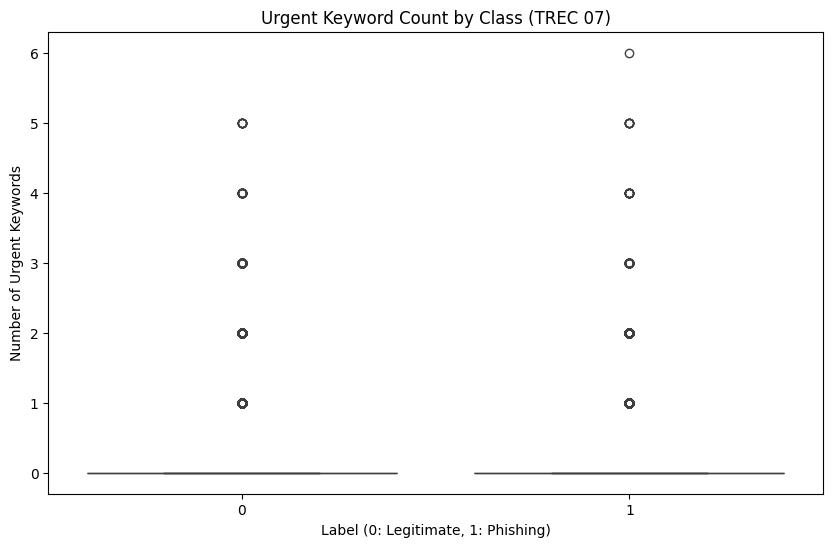

In [ ]:
def keyword_frequency(text, keywords):
    text = text.lower()
    return sum(keyword in text for keyword in keywords)

# Keywords for urgent action
urgent_keywords = [
    'urgent', 'immediately', 'asap', 'action required', 'important', 'critical', 'attention', 'prompt',
    'emergency', 'act now', 'time-sensitive', 'alert', 'high-priority', 'important update', 'do not ignore',
    'response needed', 'please respond'
]

# Apply keyword frequency function
trec_3['urgent_keyword_count'] = trec_3['body'].apply(lambda x: keyword_frequency(x, urgent_keywords))

# Plot urgent keyword count distribution
plt.figure(figsize=(10,6))
sns.histplot(trec_3['urgent_keyword_count'], bins=10, kde=True)
plt.title('Distribution of Urgent Keyword Count in Emails (TREC 07)')
plt.xlabel('Number of Urgent Keywords')
plt.ylabel('Frequency')
plt.show()

# Compare urgent keyword count between phishing and legitimate emails
plt.figure(figsize=(10,6))
sns.boxplot(x='label', y='urgent_keyword_count', data=trec_3)
plt.title('Urgent Keyword Count by Class (TREC 07)')
plt.xlabel('Label (0: Legitimate, 1: Phishing)')
plt.ylabel('Number of Urgent Keywords')
plt.show()


## EDA for Enron Dataset

### Display First Few Rows

In [ ]:
print("Enron Dataset Head:")
print(enron.head())

Enron Dataset Head:
                                      subject  \
0                   hpl nom for may 25 , 2001   
1            re : nom / actual vols for 24 th   
2  enron actuals for march 30 - april 1 , 201   
3                   hpl nom for may 30 , 2001   
4                   hpl nom for june 1 , 2001   

                                                body  label  
0  ( see attached file : hplno 525 . xls )\n- hpl...      0  
1  - - - - - - - - - - - - - - - - - - - - - - fo...      0  
2  estimated actuals\nmarch 30 , 2001\nno flow\nm...      0  
3  ( see attached file : hplno 530 . xls )\n- hpl...      0  
4  ( see attached file : hplno 601 . xls )\n- hpl...      0  


### Shape, Statistics, Missing Values, and Data Types

In [ ]:
# Check the shape of the dataset
print("Shape of the Enron dataset:", enron.shape)

# Summary statistics
print("Summary Statistics:")
print(enron.describe())

# Check for missing values
print("Missing Values:")
print(enron.isnull().sum())

# Check the data types
print("Data Types:")
print(enron.dtypes)


Shape of the Enron dataset: (29767, 3)
Summary Statistics:
              label
count  29767.000000
mean       0.469513
std        0.499078
min        0.000000
25%        0.000000
50%        0.000000
75%        1.000000
max        1.000000
Missing Values:
subject    198
body         0
label        0
dtype: int64
Data Types:
subject    object
body       object
label       int64
dtype: object


### Class Distribution

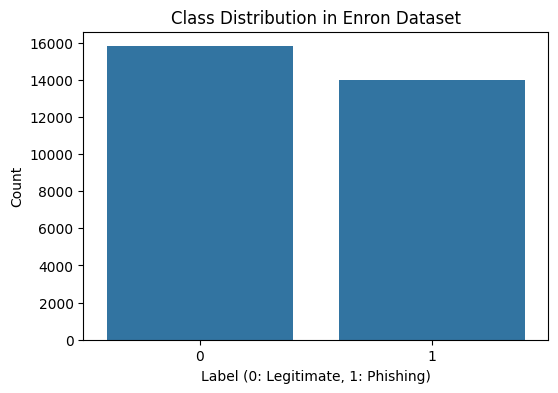

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Class distribution
plt.figure(figsize=(6,4))
sns.countplot(x='label', data=enron)
plt.title('Class Distribution in Enron Dataset')
plt.xlabel('Label (0: Legitimate, 1: Phishing)')
plt.ylabel('Count')
plt.show()

### Length of Emails

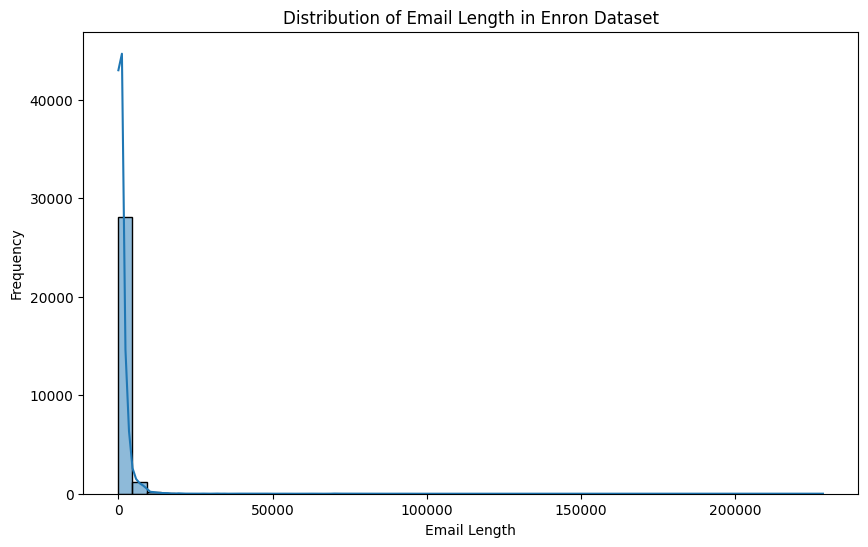

In [ ]:
# Calculate length of emails
enron['email_length'] = enron['subject'].str.len() + enron['body'].str.len()

# Plot email length distribution
plt.figure(figsize=(10,6))
sns.histplot(enron['email_length'], bins=50, kde=True)
plt.title('Distribution of Email Length in Enron Dataset')
plt.xlabel('Email Length')
plt.ylabel('Frequency')
plt.show()


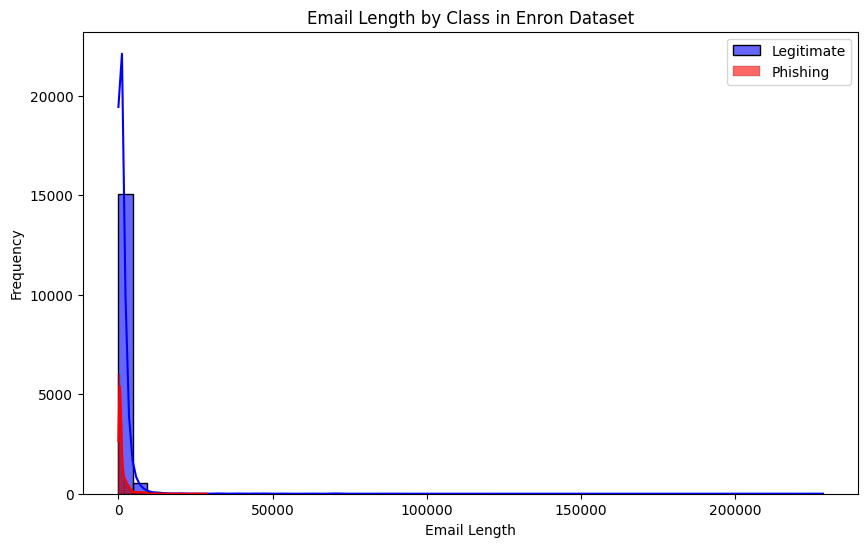

In [ ]:
# Compare lengths between phishing and legitimate emails
plt.figure(figsize=(10,6))
sns.histplot(enron[enron['label'] == 0]['email_length'], bins=50, kde=True, color='blue', label='Legitimate', alpha=0.6)
sns.histplot(enron[enron['label'] == 1]['email_length'], bins=50, kde=True, color='red', label='Phishing', alpha=0.6)
plt.title('Email Length by Class in Enron Dataset')
plt.xlabel('Email Length')
plt.ylabel('Frequency')
plt.legend()
plt.show()

### Subject Line Analysis

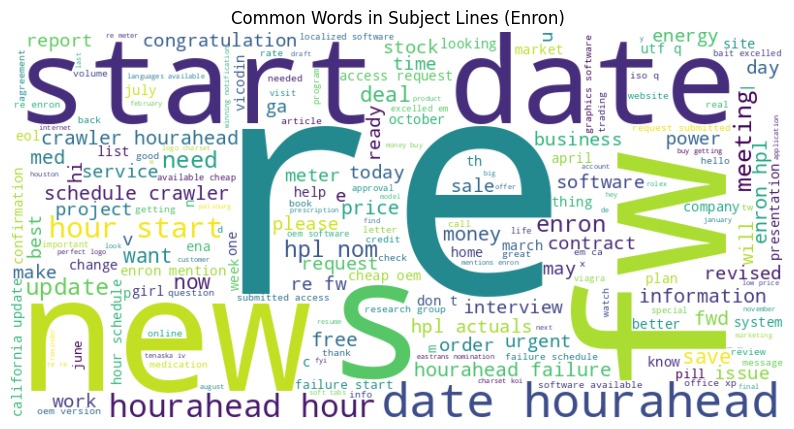

In [ ]:
from wordcloud import WordCloud

# Combine all subject lines
all_subjects = ' '.join(enron['subject'].dropna().values)

# Generate word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_subjects)

# Plot word cloud
plt.figure(figsize=(10,6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Common Words in Subject Lines (Enron)')
plt.show()

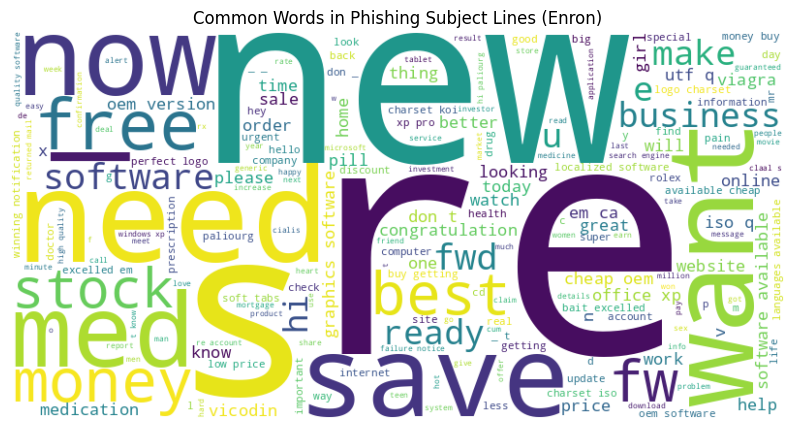

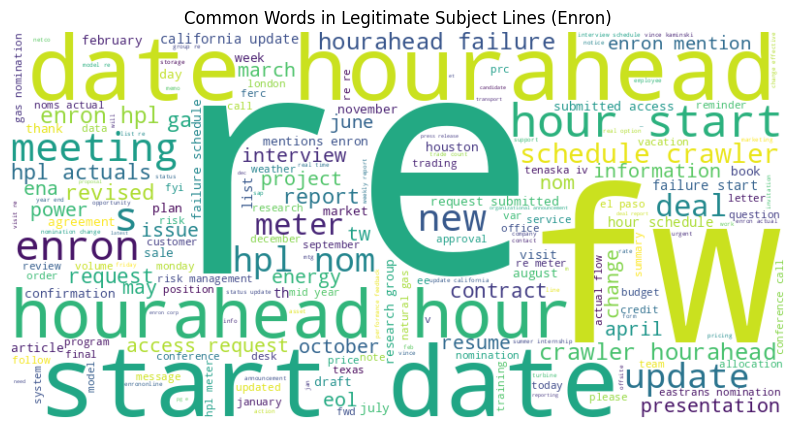

In [ ]:
# Separate word clouds for phishing and legitimate emails
phishing_subjects = ' '.join(enron[enron['label'] == 1]['subject'].dropna().values)
legit_subjects = ' '.join(enron[enron['label'] == 0]['subject'].dropna().values)

# Phishing word cloud
wordcloud_phishing = WordCloud(width=800, height=400, background_color='white').generate(phishing_subjects)
plt.figure(figsize=(10,6))
plt.imshow(wordcloud_phishing, interpolation='bilinear')
plt.axis('off')
plt.title('Common Words in Phishing Subject Lines (Enron)')
plt.show()

# Legitimate word cloud
wordcloud_legit = WordCloud(width=800, height=400, background_color='white').generate(legit_subjects)
plt.figure(figsize=(10,6))
plt.imshow(wordcloud_legit, interpolation='bilinear')
plt.axis('off')
plt.title('Common Words in Legitimate Subject Lines (Enron)')
plt.show()

### URLs and Special Characters

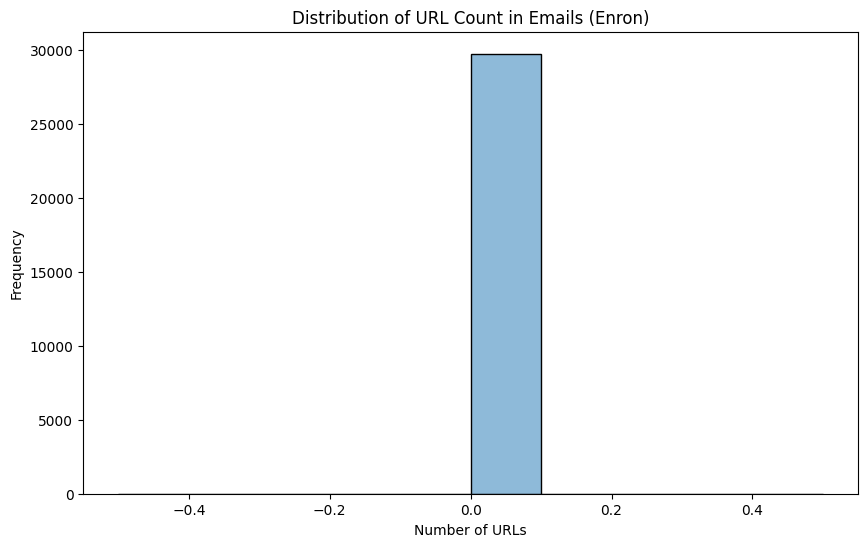

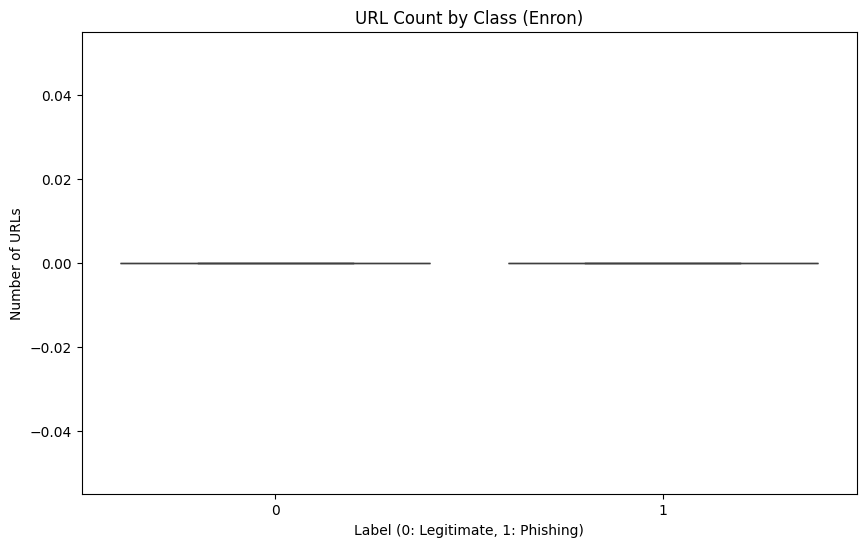

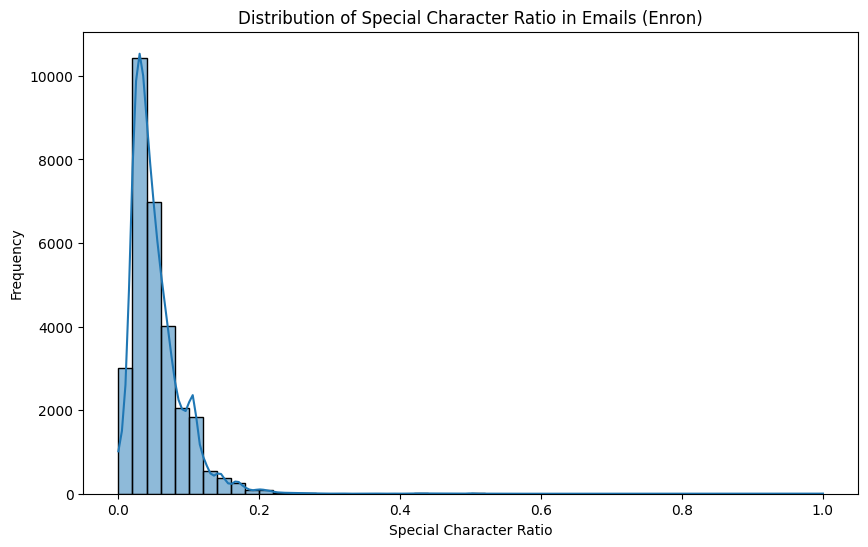

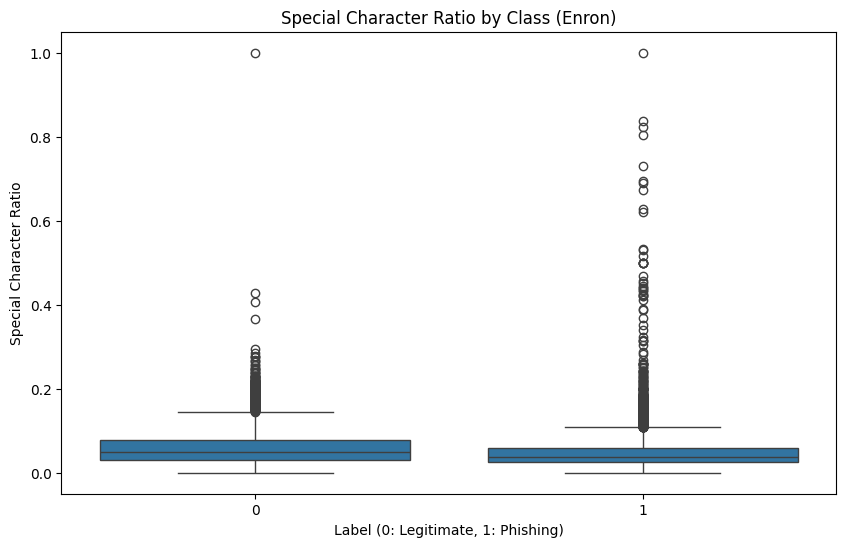

In [ ]:
import re

# Convert the 'body' column to strings
enron['body'] = enron['body'].astype(str)

# Function to count URLs
def count_urls(text):
    url_pattern = r'(https?://[^\s]+|http?://[^\s]+)'
    return len(re.findall(url_pattern, text))

# Apply function to body of emails
enron['url_count'] = enron['body'].apply(count_urls)

# Plot URL count distribution
plt.figure(figsize=(10,6))
sns.histplot(enron['url_count'], bins=10, kde=True)
plt.title('Distribution of URL Count in Emails (Enron)')
plt.xlabel('Number of URLs')
plt.ylabel('Frequency')
plt.show()

# Compare URL count between phishing and legitimate emails
plt.figure(figsize=(10,6))
sns.boxplot(x='label', y='url_count', data=enron)
plt.title('URL Count by Class (Enron)')
plt.xlabel('Label (0: Legitimate, 1: Phishing)')
plt.ylabel('Number of URLs')
plt.show()

# Function to calculate special character ratio
def get_special_char_ratio(text):
    special_chars = sum(not c.isalnum() and not c.isspace() for c in text)
    return special_chars / len(text) if len(text) > 0 else 0

# Apply function to body of emails
enron['special_char_ratio'] = enron['body'].apply(get_special_char_ratio)

# Plot special character ratio distribution
plt.figure(figsize=(10,6))
sns.histplot(enron['special_char_ratio'], bins=50, kde=True)
plt.title('Distribution of Special Character Ratio in Emails (Enron)')
plt.xlabel('Special Character Ratio')
plt.ylabel('Frequency')
plt.show()

# Compare special character ratio between phishing and legitimate emails
plt.figure(figsize=(10,6))
sns.boxplot(x='label', y='special_char_ratio', data=enron)
plt.title('Special Character Ratio by Class (Enron)')
plt.xlabel('Label (0: Legitimate, 1: Phishing)')
plt.ylabel('Special Character Ratio')
plt.show()


### Keyword Analysis

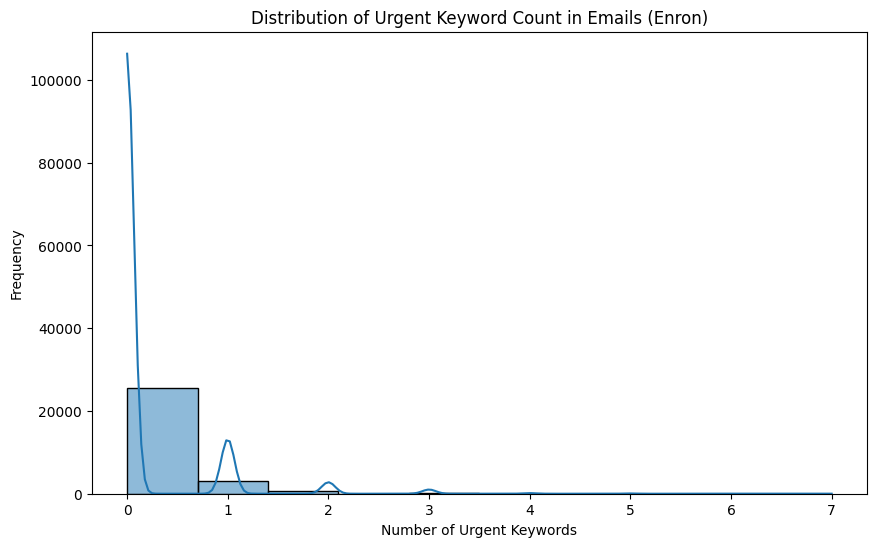

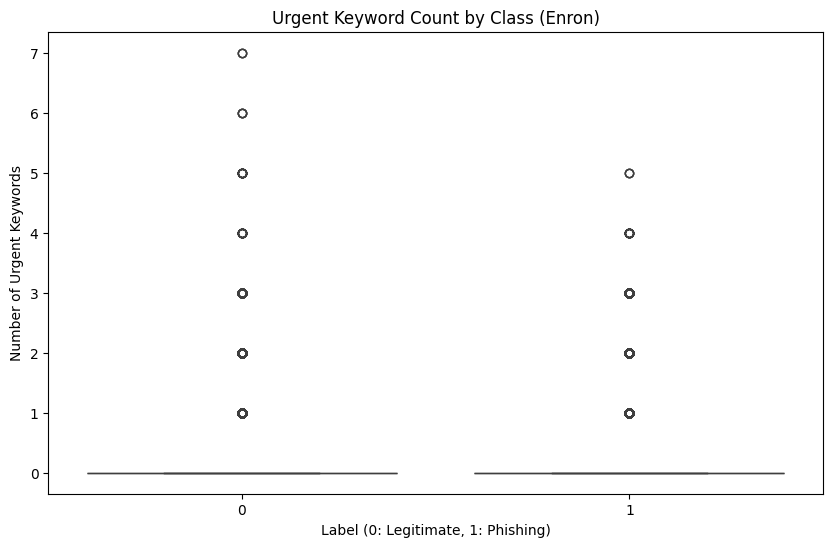

In [ ]:
def keyword_frequency(text, keywords):
    text = text.lower()
    return sum(keyword in text for keyword in keywords)

# Keywords for urgent action
urgent_keywords = [
    'urgent', 'immediately', 'asap', 'action required', 'important', 'critical', 'attention', 'prompt',
    'emergency', 'act now', 'time-sensitive', 'alert', 'high-priority', 'important update', 'do not ignore',
    'response needed', 'please respond'
]

# Apply keyword frequency function
enron['urgent_keyword_count'] = enron['body'].apply(lambda x: keyword_frequency(x, urgent_keywords))

# Plot urgent keyword count distribution
plt.figure(figsize=(10,6))
sns.histplot(enron['urgent_keyword_count'], bins=10, kde=True)
plt.title('Distribution of Urgent Keyword Count in Emails (Enron)')
plt.xlabel('Number of Urgent Keywords')
plt.ylabel('Frequency')
plt.show()

# Compare urgent keyword count between phishing and legitimate emails
plt.figure(figsize=(10,6))
sns.boxplot(x='label', y='urgent_keyword_count', data=enron)
plt.title('Urgent Keyword Count by Class (Enron)')
plt.xlabel('Label (0: Legitimate, 1: Phishing)')
plt.ylabel('Number of Urgent Keywords')
plt.show()


## EDA for Ling Dataset

### Display First Few Rows

In [ ]:
print("Ling Dataset Head:")
print(ling.head())

Ling Dataset Head:
                                             subject  \
0            job posting - apple-iss research center   
1                                                NaN   
2  query : letter frequencies for text identifica...   
3                                               risk   
4                           request book information   

                                                body  label  
0  content - length : 3386 apple-iss research cen...      0  
1  lang classification grimes , joseph e . and ba...      0  
2  i am posting this inquiry for sergei atamas ( ...      0  
3  a colleague and i are researching the differin...      0  
4  earlier this morning i was on the phone with a...      0  


### Shape, Statistics, Missing Values, and Data Types

In [ ]:
# Check the shape of the dataset
print("Shape of the Enron dataset:", ling.shape)

# Summary statistics
print("Summary Statistics:")
print(ling.describe())

# Check for missing values
print("Missing Values:")
print(ling.isnull().sum())

# Check the data types
print("Data Types:")
print(ling.dtypes)


Shape of the Enron dataset: (2859, 3)
Summary Statistics:
             label
count  2859.000000
mean      0.160196
std       0.366852
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       1.000000
Missing Values:
subject    62
body        0
label       0
dtype: int64
Data Types:
subject    object
body       object
label       int64
dtype: object


### Class Distribution

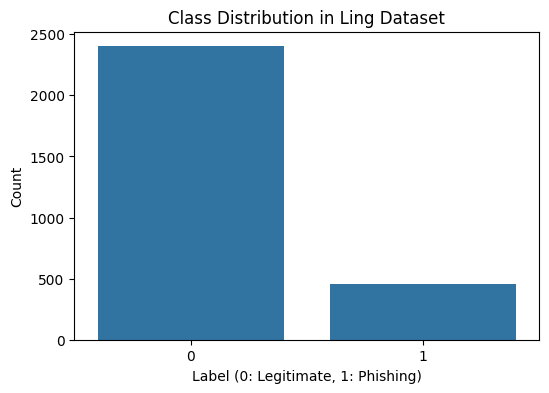

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Class distribution
plt.figure(figsize=(6,4))
sns.countplot(x='label', data=ling)
plt.title('Class Distribution in Ling Dataset')
plt.xlabel('Label (0: Legitimate, 1: Phishing)')
plt.ylabel('Count')
plt.show()

### Length of Emails

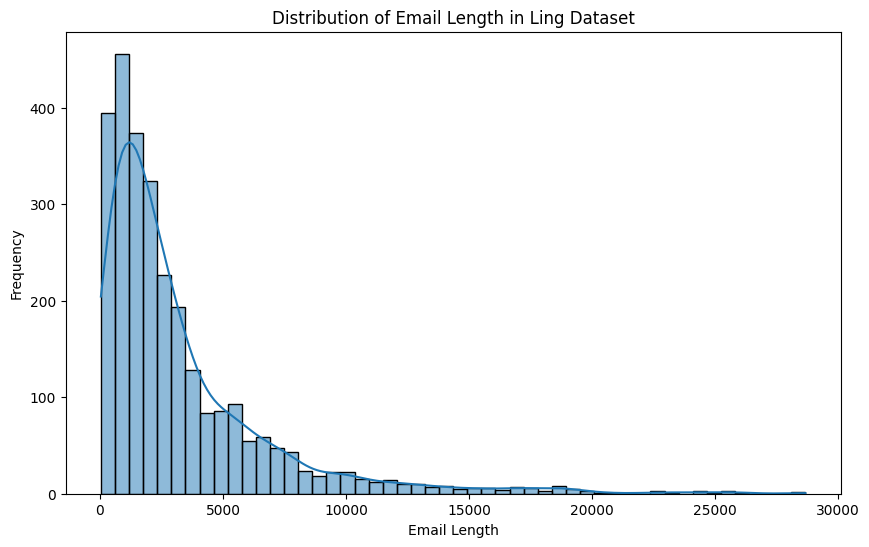

In [ ]:
# Calculate length of emails
ling['email_length'] = ling['subject'].str.len() + ling['body'].str.len()

# Plot email length distribution
plt.figure(figsize=(10,6))
sns.histplot(ling['email_length'], bins=50, kde=True)
plt.title('Distribution of Email Length in Ling Dataset')
plt.xlabel('Email Length')
plt.ylabel('Frequency')
plt.show()


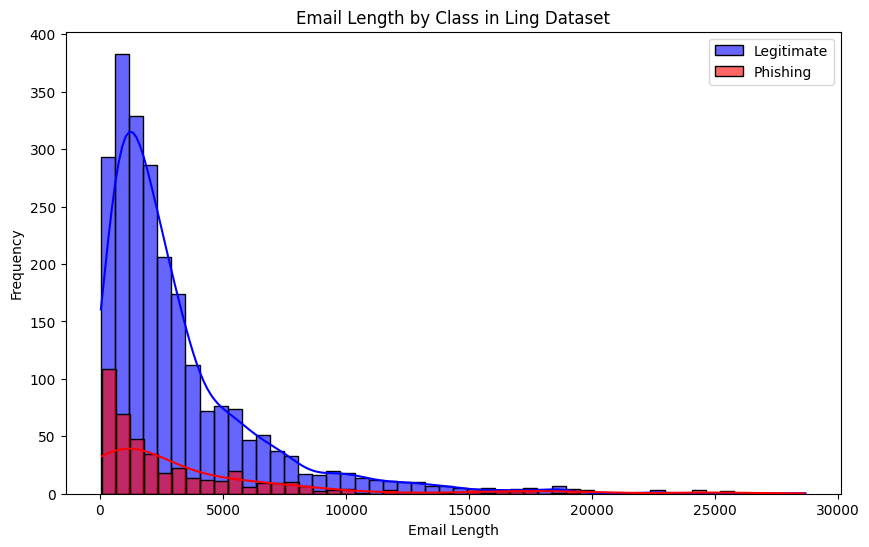

In [ ]:
# Compare lengths between phishing and legitimate emails
plt.figure(figsize=(10,6))
sns.histplot(ling[ling['label'] == 0]['email_length'], bins=50, kde=True, color='blue', label='Legitimate', alpha=0.6)
sns.histplot(ling[ling['label'] == 1]['email_length'], bins=50, kde=True, color='red', label='Phishing', alpha=0.6)
plt.title('Email Length by Class in Ling Dataset')
plt.xlabel('Email Length')
plt.ylabel('Frequency')
plt.legend()
plt.show()

### Subject Line Analysis

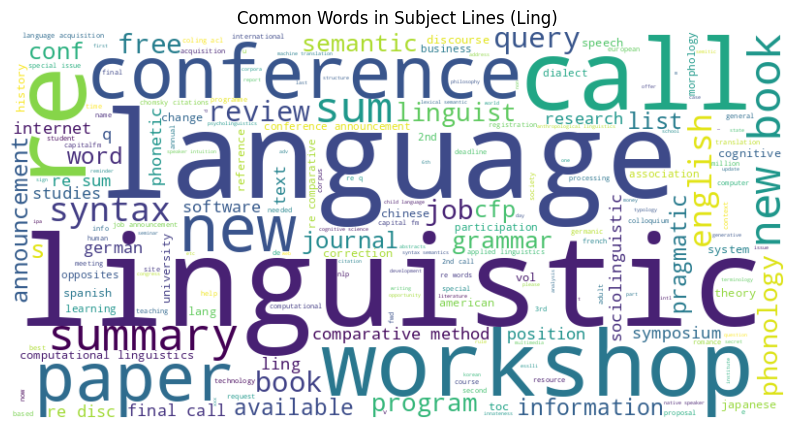

In [ ]:
from wordcloud import WordCloud

# Combine all subject lines
all_subjects = ' '.join(ling['subject'].dropna().values)

# Generate word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_subjects)

# Plot word cloud
plt.figure(figsize=(10,6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Common Words in Subject Lines (Ling)')
plt.show()

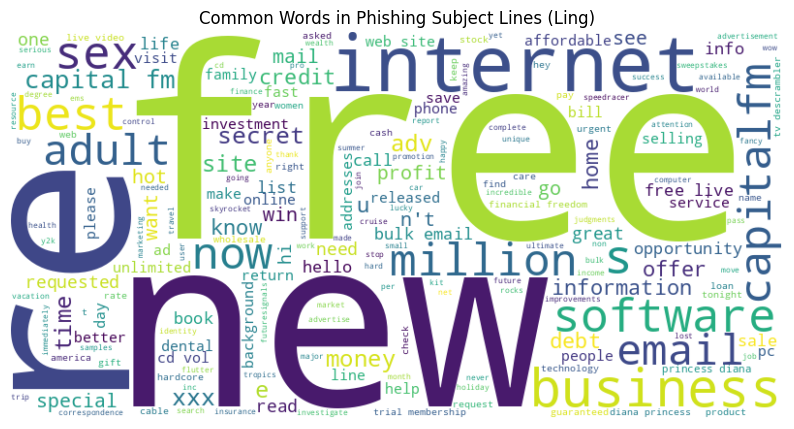

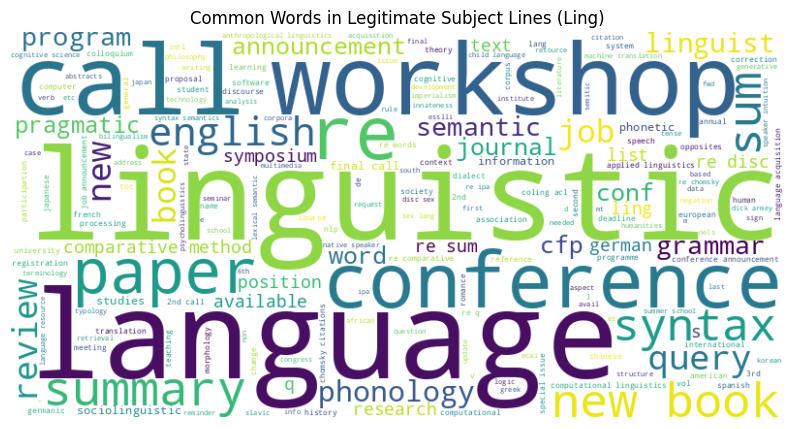

In [ ]:
# Separate word clouds for phishing and legitimate emails
phishing_subjects = ' '.join(ling[ling['label'] == 1]['subject'].dropna().values)
legit_subjects = ' '.join(ling[ling['label'] == 0]['subject'].dropna().values)

# Phishing word cloud
wordcloud_phishing = WordCloud(width=800, height=400, background_color='white').generate(phishing_subjects)
plt.figure(figsize=(10,6))
plt.imshow(wordcloud_phishing, interpolation='bilinear')
plt.axis('off')
plt.title('Common Words in Phishing Subject Lines (Ling)')
plt.show()

# Legitimate word cloud
wordcloud_legit = WordCloud(width=800, height=400, background_color='white').generate(legit_subjects)
plt.figure(figsize=(10,6))
plt.imshow(wordcloud_legit, interpolation='bilinear')
plt.axis('off')
plt.title('Common Words in Legitimate Subject Lines (Ling)')
plt.show()

### URLs and Special Characters

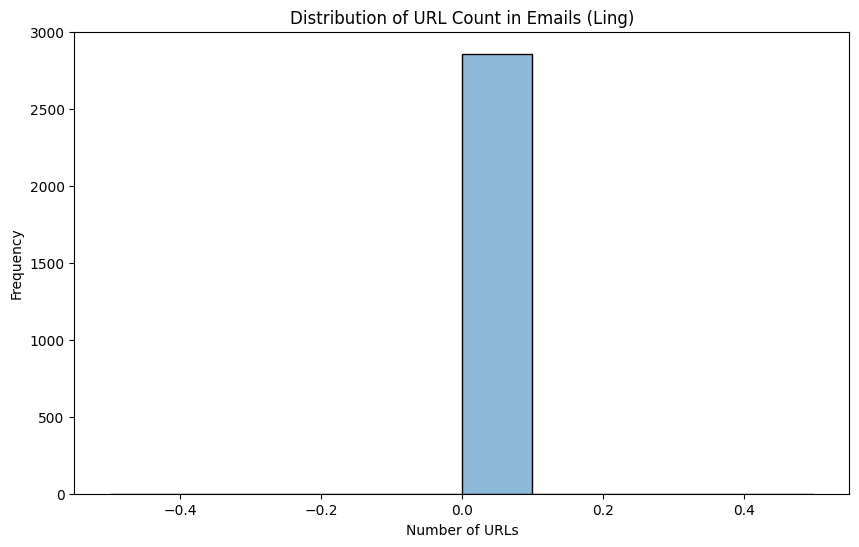

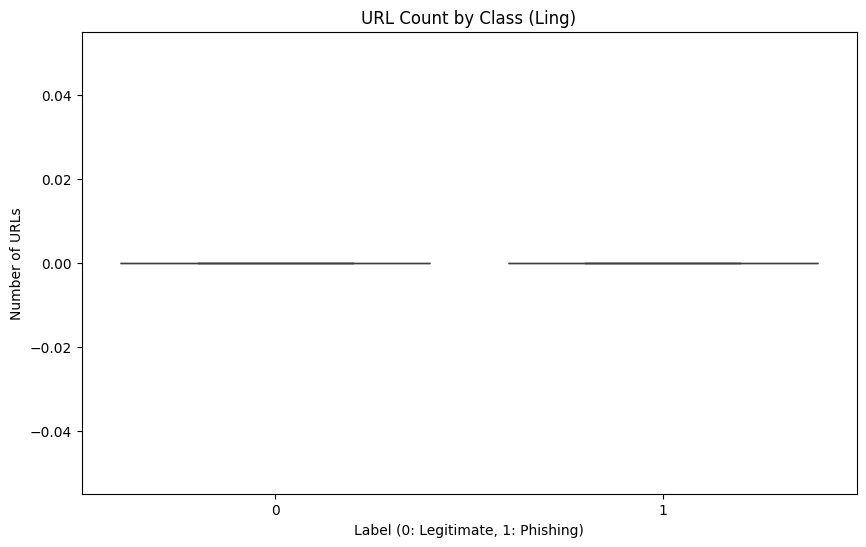

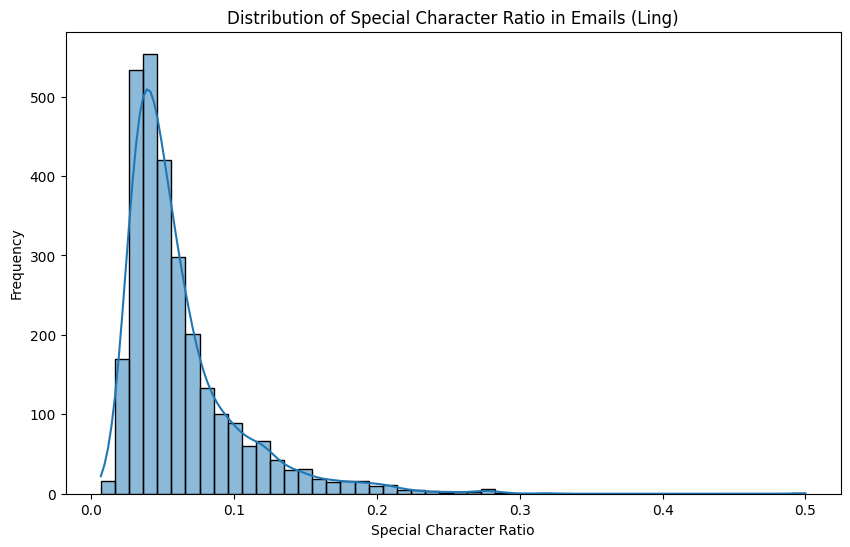

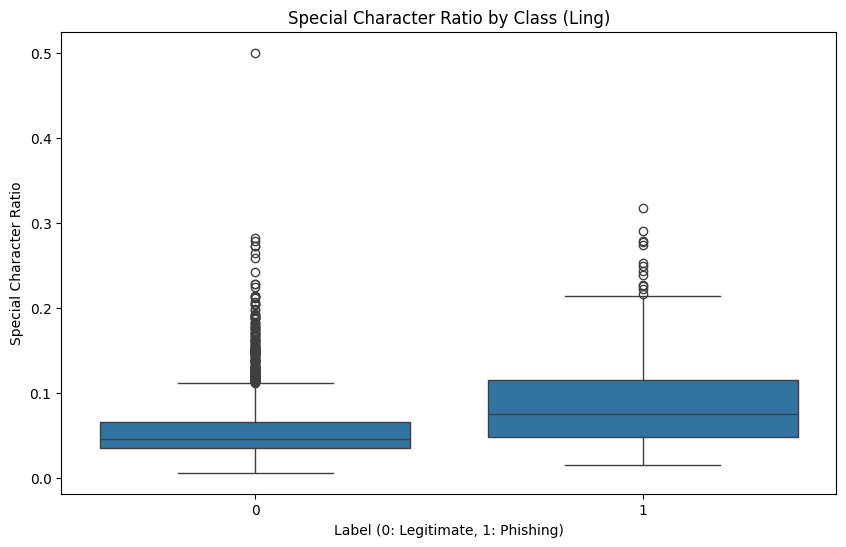

In [ ]:
import re

# Convert the 'body' column to strings
ling['body'] = ling['body'].astype(str)

# Function to count URLs
def count_urls(text):
    url_pattern = r'(https?://[^\s]+|http?://[^\s]+)'
    return len(re.findall(url_pattern, text))

# Apply function to body of emails
ling['url_count'] = ling['body'].apply(count_urls)

# Plot URL count distribution
plt.figure(figsize=(10,6))
sns.histplot(ling['url_count'], bins=10, kde=True)
plt.title('Distribution of URL Count in Emails (Ling)')
plt.xlabel('Number of URLs')
plt.ylabel('Frequency')
plt.show()

# Compare URL count between phishing and legitimate emails
plt.figure(figsize=(10,6))
sns.boxplot(x='label', y='url_count', data=ling)
plt.title('URL Count by Class (Ling)')
plt.xlabel('Label (0: Legitimate, 1: Phishing)')
plt.ylabel('Number of URLs')
plt.show()

# Function to calculate special character ratio
def get_special_char_ratio(text):
    special_chars = sum(not c.isalnum() and not c.isspace() for c in text)
    return special_chars / len(text) if len(text) > 0 else 0

# Apply function to body of emails
ling['special_char_ratio'] = ling['body'].apply(get_special_char_ratio)

# Plot special character ratio distribution
plt.figure(figsize=(10,6))
sns.histplot(ling['special_char_ratio'], bins=50, kde=True)
plt.title('Distribution of Special Character Ratio in Emails (Ling)')
plt.xlabel('Special Character Ratio')
plt.ylabel('Frequency')
plt.show()

# Compare special character ratio between phishing and legitimate emails
plt.figure(figsize=(10,6))
sns.boxplot(x='label', y='special_char_ratio', data=ling)
plt.title('Special Character Ratio by Class (Ling)')
plt.xlabel('Label (0: Legitimate, 1: Phishing)')
plt.ylabel('Special Character Ratio')
plt.show()


### Keyword Analysis

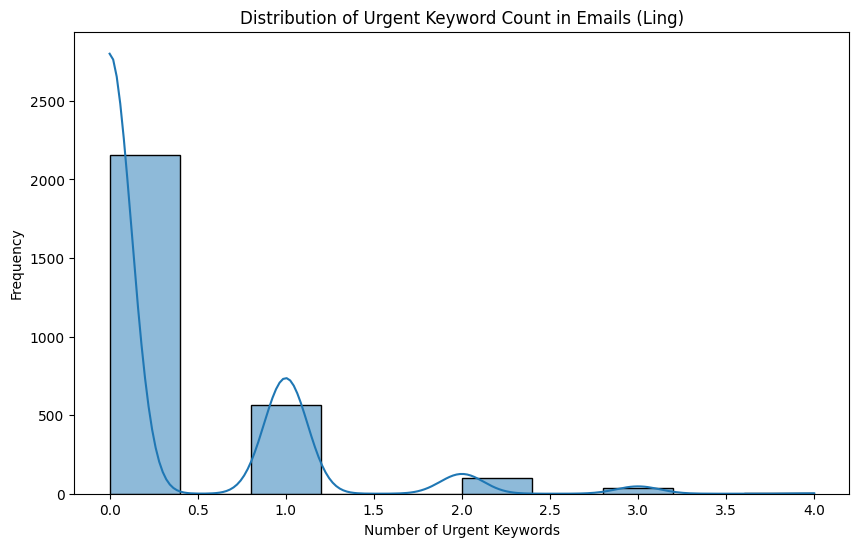

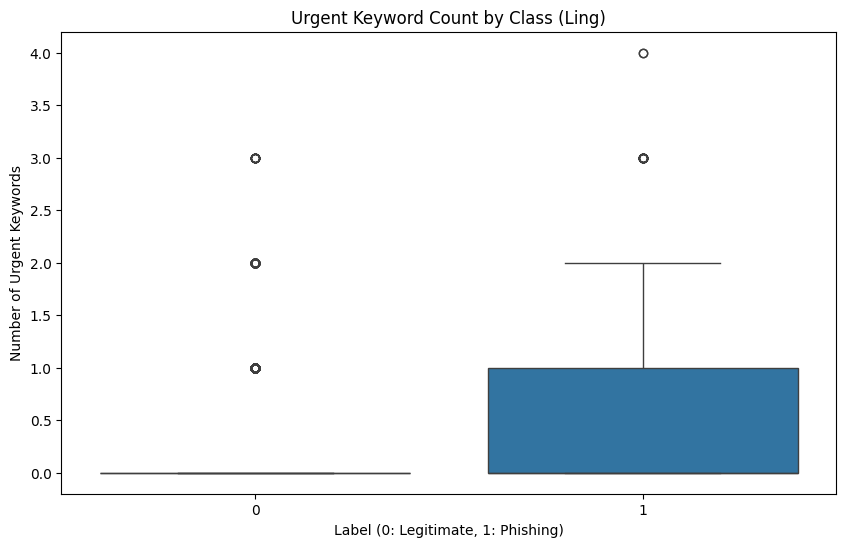

In [ ]:
def keyword_frequency(text, keywords):
    text = text.lower()
    return sum(keyword in text for keyword in keywords)

# Keywords for urgent action
urgent_keywords = [
    'urgent', 'immediately', 'asap', 'action required', 'important', 'critical', 'attention', 'prompt',
    'emergency', 'act now', 'time-sensitive', 'alert', 'high-priority', 'important update', 'do not ignore',
    'response needed', 'please respond'
]

# Apply keyword frequency function
ling['urgent_keyword_count'] = ling['body'].apply(lambda x: keyword_frequency(x, urgent_keywords))

# Plot urgent keyword count distribution
plt.figure(figsize=(10,6))
sns.histplot(ling['urgent_keyword_count'], bins=10, kde=True)
plt.title('Distribution of Urgent Keyword Count in Emails (Ling)')
plt.xlabel('Number of Urgent Keywords')
plt.ylabel('Frequency')
plt.show()

# Compare urgent keyword count between phishing and legitimate emails
plt.figure(figsize=(10,6))
sns.boxplot(x='label', y='urgent_keyword_count', data=ling)
plt.title('Urgent Keyword Count by Class (Ling)')
plt.xlabel('Label (0: Legitimate, 1: Phishing)')
plt.ylabel('Number of Urgent Keywords')
plt.show()


## EDA for Nazario Dataset

### Display First Few Rows

In [ ]:
print("Nazario Dataset Head:")
print(nazario.head())

Nazario Dataset Head:
                                              sender  \
0  Mail System Internal Data <MAILER-DAEMON@monke...   
1                        cPanel <service@cpanel.com>   
2    Microsoft Outlook <recepcao@unimedceara.com.br>   
3                     Ann Garcia <AnGarcia@mcoe.org>   
4                 "USAA" <usaaacctupdate@sccu4u.com>   

                                 receiver  \
0                                     NaN   
1                         jose@monkey.org   
2                                     NaN   
3     "info@maaaaa.org" <info@maaaaa.org>   
4  Recipients <usaaacctupdate@sccu4u.com>   

                                    date  \
0             28 Sep 2017 09:57:25 -0400   
1        Fri, 30 Oct 2015 00:00:48 -0500   
2  Fri, 30 Oct 2015 06:21:59 -0300 (BRT)   
3        Fri, 30 Oct 2015 14:54:33 +0000   
4        Fri, 30 Oct 2015 14:02:33 -0500   

                                             subject  \
0  DON'T DELETE THIS MESSAGE -- FOLDER INTERNAL D

### Shape, Statistics, Missing Values, and Data Types

In [ ]:
# Check the shape of the dataset
print("Shape of the Nazario dataset:", nazario.shape)

# Summary statistics
print("Summary Statistics:")
print(nazario.describe())

# Check for missing values
print("Missing Values:")
print(nazario.isnull().sum())

# Check the data types
print("Data Types:")
print(nazario.dtypes)


Shape of the Nazario dataset: (1565, 7)
Summary Statistics:
              urls   label
count  1565.000000  1565.0
mean      0.909265     1.0
std       0.287323     0.0
min       0.000000     1.0
25%       1.000000     1.0
50%       1.000000     1.0
75%       1.000000     1.0
max       1.000000     1.0
Missing Values:
sender       0
receiver    96
date         1
subject      4
body         0
urls         0
label        0
dtype: int64
Data Types:
sender      object
receiver    object
date        object
subject     object
body        object
urls         int64
label        int64
dtype: object


### Class Distribution

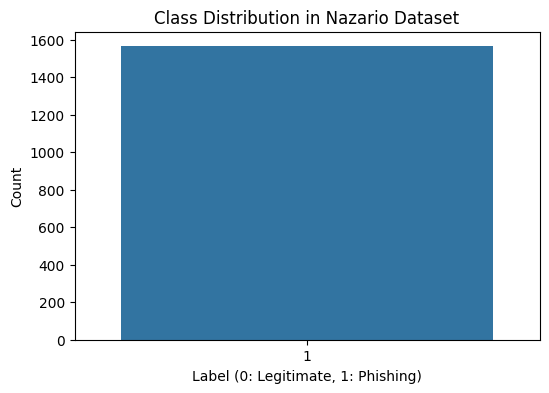

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Class distribution
plt.figure(figsize=(6,4))
sns.countplot(x='label', data=nazario)
plt.title('Class Distribution in Nazario Dataset')
plt.xlabel('Label (0: Legitimate, 1: Phishing)')
plt.ylabel('Count')
plt.show()

### Length of Emails

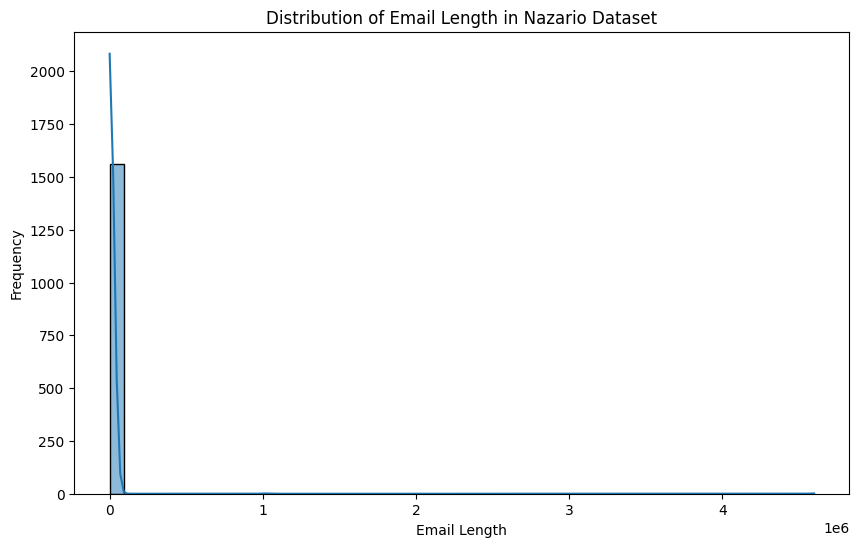

In [ ]:
# Calculate length of emails
nazario['email_length'] = nazario['subject'].str.len() + nazario['body'].str.len()

# Plot email length distribution
plt.figure(figsize=(10,6))
sns.histplot(nazario['email_length'], bins=50, kde=True)
plt.title('Distribution of Email Length in Nazario Dataset')
plt.xlabel('Email Length')
plt.ylabel('Frequency')
plt.show()


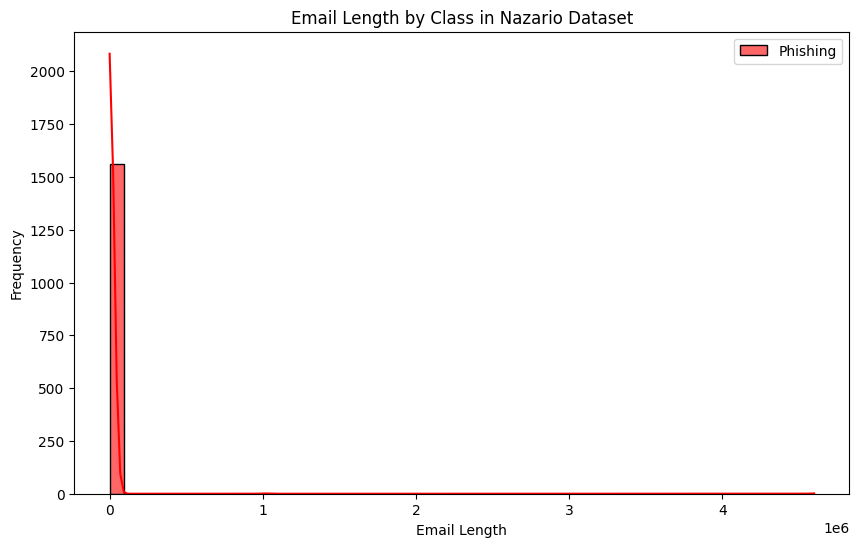

In [ ]:
# Compare lengths between phishing and legitimate emails
plt.figure(figsize=(10,6))
sns.histplot(nazario[nazario['label'] == 0]['email_length'], bins=50, kde=True, color='blue', label='Legitimate', alpha=0.6)
sns.histplot(nazario[nazario['label'] == 1]['email_length'], bins=50, kde=True, color='red', label='Phishing', alpha=0.6)
plt.title('Email Length by Class in Nazario Dataset')
plt.xlabel('Email Length')
plt.ylabel('Frequency')
plt.legend()
plt.show()

### Subject Line Analysis

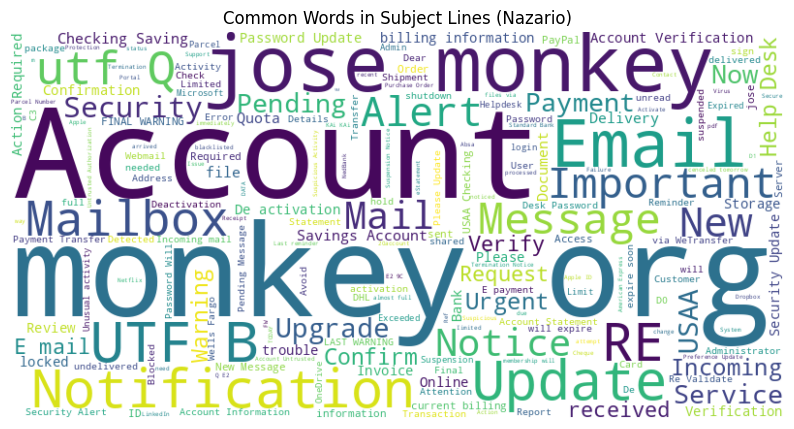

In [ ]:
from wordcloud import WordCloud

# Combine all subject lines
all_subjects = ' '.join(nazario['subject'].dropna().values)

# Generate word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_subjects)

# Plot word cloud
plt.figure(figsize=(10,6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Common Words in Subject Lines (Nazario)')
plt.show()

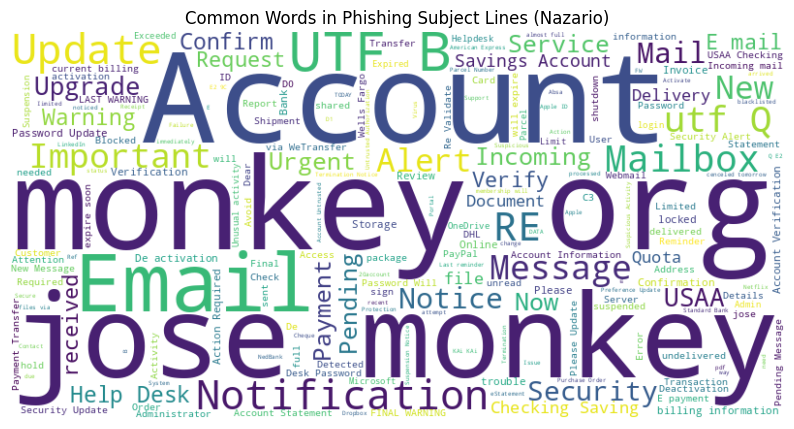

In [ ]:
# Separate word clouds for phishing and legitimate emails
phishing_subjects = ' '.join(nazario[nazario['label'] == 1]['subject'].dropna().values)
legit_subjects = ' '.join(nazario[nazario['label'] == 0]['subject'].dropna().values)

# Phishing word cloud
wordcloud_phishing = WordCloud(width=800, height=400, background_color='white').generate(phishing_subjects)
plt.figure(figsize=(10,6))
plt.imshow(wordcloud_phishing, interpolation='bilinear')
plt.axis('off')
plt.title('Common Words in Phishing Subject Lines (Nazario)')
plt.show()


### URLs and Special Characters

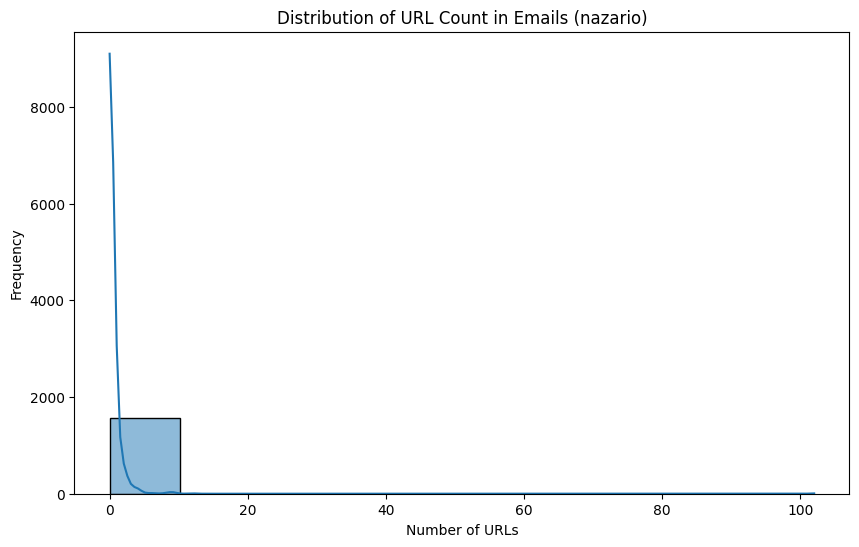

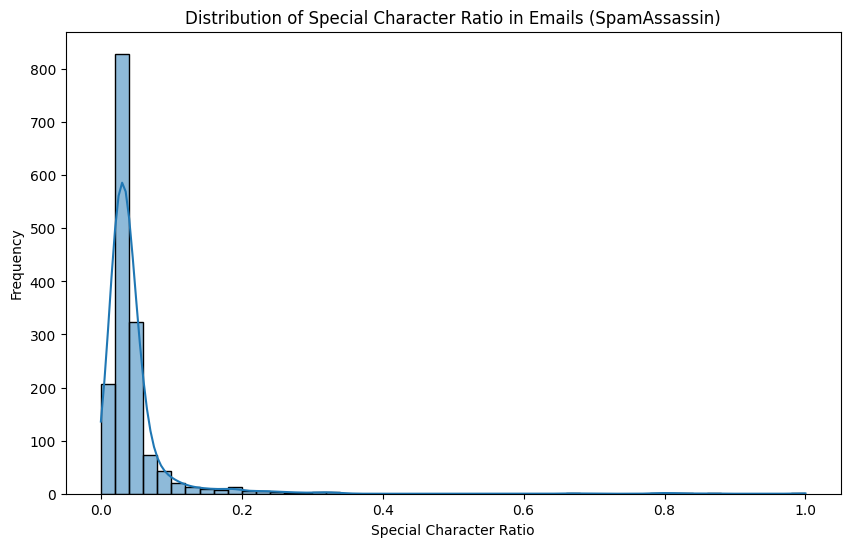

In [ ]:
import re

# Convert the 'body' column to strings
nazario['body'] = nazario['body'].astype(str)

# Function to count URLs
def count_urls(text):
    url_pattern = r'(https?://[^\s]+|http?://[^\s]+)'
    return len(re.findall(url_pattern, text))

# Apply function to body of emails
nazario['url_count'] = nazario['body'].apply(count_urls)

# Plot URL count distribution
plt.figure(figsize=(10,6))
sns.histplot(nazario['url_count'], bins=10, kde=True)
plt.title('Distribution of URL Count in Emails (nazario)')
plt.xlabel('Number of URLs')
plt.ylabel('Frequency')
plt.show()

# Function to calculate special character ratio
def get_special_char_ratio(text):
    special_chars = sum(not c.isalnum() and not c.isspace() for c in text)
    return special_chars / len(text) if len(text) > 0 else 0

# Apply function to body of emails
nazario['special_char_ratio'] = nazario['body'].apply(get_special_char_ratio)

# Plot special character ratio distribution
plt.figure(figsize=(10,6))
sns.histplot(nazario['special_char_ratio'], bins=50, kde=True)
plt.title('Distribution of Special Character Ratio in Emails (SpamAssassin)')
plt.xlabel('Special Character Ratio')
plt.ylabel('Frequency')
plt.show()



### Keyword Analysis

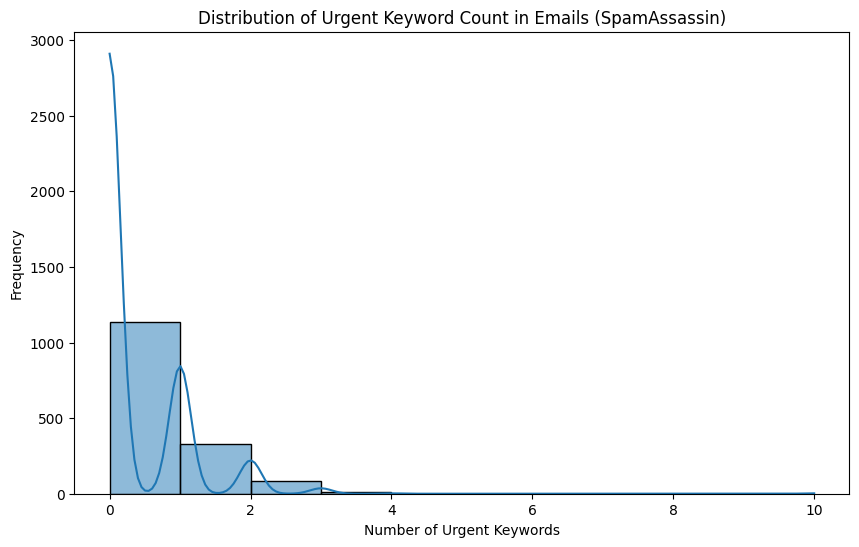

In [ ]:
def keyword_frequency(text, keywords):
    text = text.lower()
    return sum(keyword in text for keyword in keywords)

# Keywords for urgent action
urgent_keywords = [
    'urgent', 'immediately', 'asap', 'action required', 'important', 'critical', 'attention', 'prompt',
    'emergency', 'act now', 'time-sensitive', 'alert', 'high-priority', 'important update', 'do not ignore',
    'response needed', 'please respond'
]

# Apply keyword frequency function
nazario['urgent_keyword_count'] = nazario['body'].apply(lambda x: keyword_frequency(x, urgent_keywords))

# Plot urgent keyword count distribution
plt.figure(figsize=(10,6))
sns.histplot(nazario['urgent_keyword_count'], bins=10, kde=True)
plt.title('Distribution of Urgent Keyword Count in Emails (SpamAssassin)')
plt.xlabel('Number of Urgent Keywords')
plt.ylabel('Frequency')
plt.show()




## EDA for Nigerian Fraud Dataset

### Display First Few Rows

In [ ]:
print("Nigerian Fraud  Dataset Head:")
print(nigerian_fraud.head())

Nigerian Fraud  Dataset Head:
                                           sender              receiver  \
0  MR. JAMES NGOLA. <james_ngola2002@maktoob.com>  webmaster@aclweb.org   
1  Mr. Ben Suleman <bensul2004nng@spinfinder.com>                   R@M   
2       PRINCE OBONG ELEME <obong_715@epatra.com>  webmaster@aclweb.org   
3       PRINCE OBONG ELEME <obong_715@epatra.com>  webmaster@aclweb.org   
4              Maryam Abacha <m_abacha03@www.com>                   R@M   

                              date  \
0  Thu, 31 Oct 2002 02:38:20 +0000   
1  Thu, 31 Oct 2002 05:10:00 -0000   
2  Thu, 31 Oct 2002 22:17:55 +0100   
3  Thu, 31 Oct 2002 22:44:20 -0000   
4  Fri, 01 Nov 2002 01:45:04 +0100   

                                      subject  \
0  URGENT BUSINESS ASSISTANCE AND PARTNERSHIP   
1         URGENT ASSISTANCE /RELATIONSHIP (P)   
2                             GOOD DAY TO YOU   
3                             GOOD DAY TO YOU   
4                     I Need Your Assistance.

### Shape, Statistics, Missing Values, and Data Types

In [ ]:
# Check the shape of the dataset
print("Shape of the Nigerian Fraud dataset:", nigerian_fraud.shape)

# Summary statistics
print("Summary Statistics:")
print(nigerian_fraud.describe())

# Check for missing values
print("Missing Values:")
print(nigerian_fraud.isnull().sum())

# Check the data types
print("Data Types:")
print(nigerian_fraud.dtypes)


Shape of the Nigerian Fraud dataset: (3332, 7)
Summary Statistics:
              urls   label
count  3332.000000  3332.0
mean      0.344838     1.0
std       0.475387     0.0
min       0.000000     1.0
25%       0.000000     1.0
50%       0.000000     1.0
75%       1.000000     1.0
max       1.000000     1.0
Missing Values:
sender       331
receiver    1324
date         482
subject       39
body           0
urls           0
label          0
dtype: int64
Data Types:
sender      object
receiver    object
date        object
subject     object
body        object
urls         int64
label        int64
dtype: object


### Class Distribution

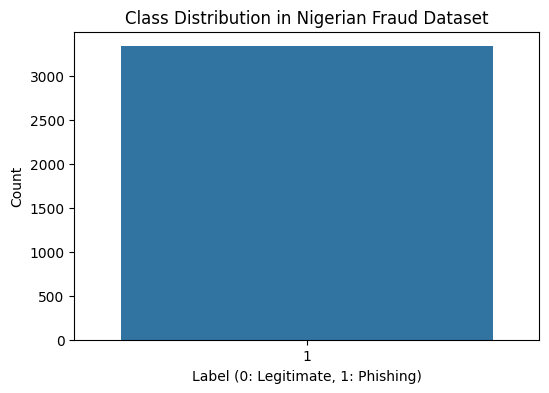

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Class distribution
plt.figure(figsize=(6,4))
sns.countplot(x='label', data=nigerian_fraud)
plt.title('Class Distribution in Nigerian Fraud Dataset')
plt.xlabel('Label (0: Legitimate, 1: Phishing)')
plt.ylabel('Count')
plt.show()

### Length of Emails

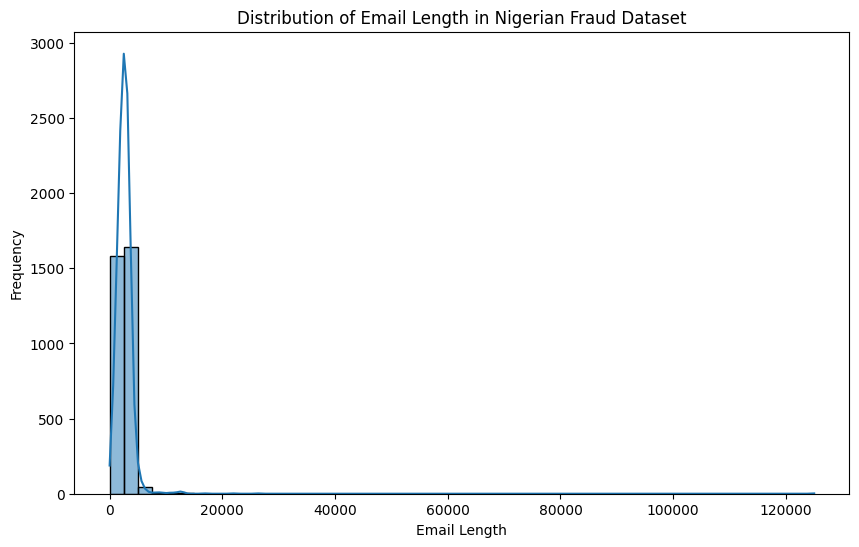

In [ ]:
# Calculate length of emails
nigerian_fraud['email_length'] = nigerian_fraud['subject'].str.len() + nigerian_fraud['body'].str.len()

# Plot email length distribution
plt.figure(figsize=(10,6))
sns.histplot(nigerian_fraud['email_length'], bins=50, kde=True)
plt.title('Distribution of Email Length in Nigerian Fraud Dataset')
plt.xlabel('Email Length')
plt.ylabel('Frequency')
plt.show()


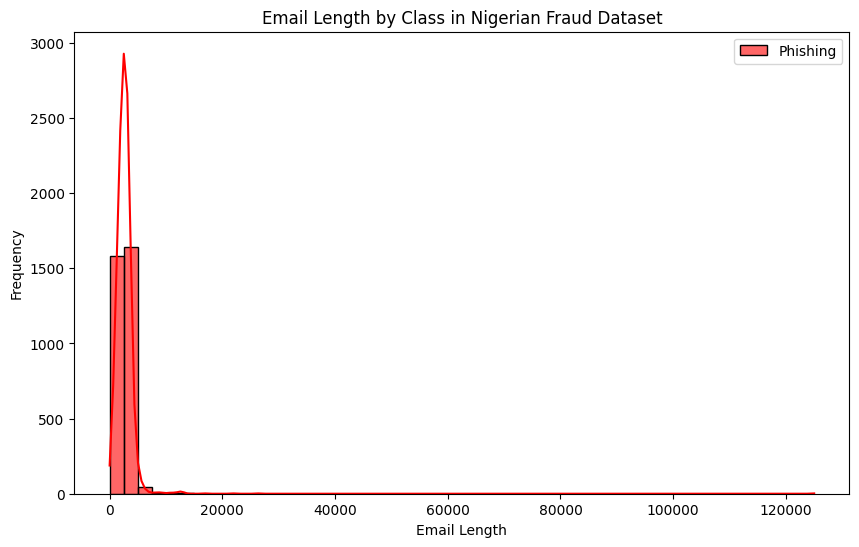

In [ ]:
# Compare lengths between phishing and legitimate emails
plt.figure(figsize=(10,6))
sns.histplot(nigerian_fraud[nigerian_fraud['label'] == 0]['email_length'], bins=50, kde=True, color='blue', label='Legitimate', alpha=0.6)
sns.histplot(nigerian_fraud[nigerian_fraud['label'] == 1]['email_length'], bins=50, kde=True, color='red', label='Phishing', alpha=0.6)
plt.title('Email Length by Class in Nigerian Fraud Dataset')
plt.xlabel('Email Length')
plt.ylabel('Frequency')
plt.legend()
plt.show()

### Subject Line Analysis

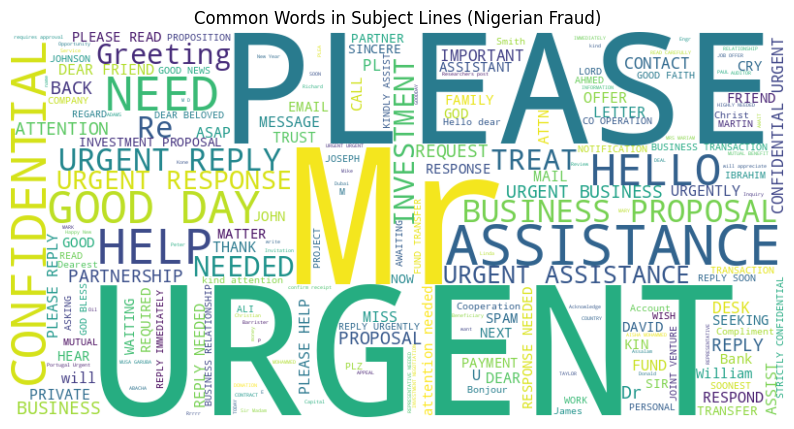

In [ ]:
from wordcloud import WordCloud

# Combine all subject lines
all_subjects = ' '.join(nigerian_fraud['subject'].dropna().values)

# Generate word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_subjects)

# Plot word cloud
plt.figure(figsize=(10,6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Common Words in Subject Lines (Nigerian Fraud)')
plt.show()

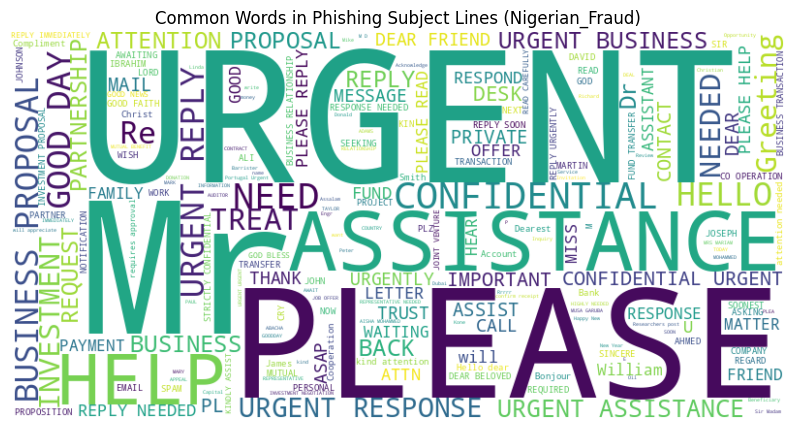

In [ ]:
# Separate word clouds for phishing and legitimate emails
phishing_subjects = ' '.join(nigerian_fraud[nigerian_fraud['label'] == 1]['subject'].dropna().values)

# Phishing word cloud
wordcloud_phishing = WordCloud(width=800, height=400, background_color='white').generate(phishing_subjects)
plt.figure(figsize=(10,6))
plt.imshow(wordcloud_phishing, interpolation='bilinear')
plt.axis('off')
plt.title('Common Words in Phishing Subject Lines (Nigerian_Fraud)')
plt.show()


### URLs and Special Characters

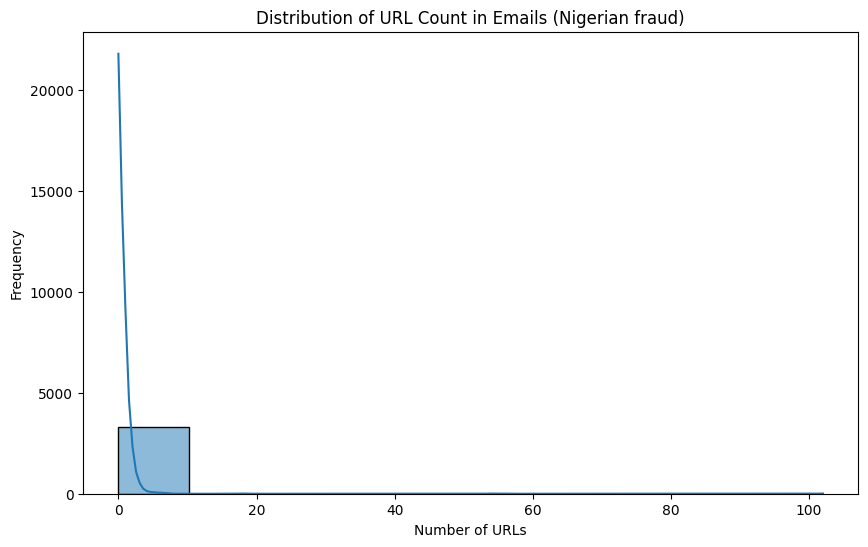

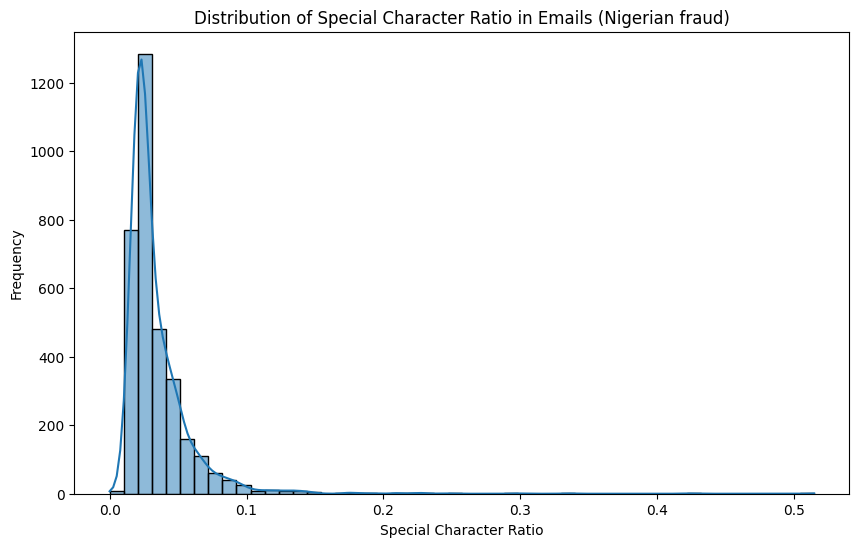

In [ ]:
import re

# Convert the 'body' column to strings
nigerian_fraud['body'] = nigerian_fraud['body'].astype(str)

# Function to count URLs
def count_urls(text):
    url_pattern = r'(https?://[^\s]+|http?://[^\s]+)'
    return len(re.findall(url_pattern, text))

# Apply function to body of emails
nigerian_fraud['url_count'] = nigerian_fraud['body'].apply(count_urls)

# Plot URL count distribution
plt.figure(figsize=(10,6))
sns.histplot(nigerian_fraud['url_count'], bins=10, kde=True)
plt.title('Distribution of URL Count in Emails (Nigerian fraud)')
plt.xlabel('Number of URLs')
plt.ylabel('Frequency')
plt.show()

# Function to calculate special character ratio
def get_special_char_ratio(text):
    special_chars = sum(not c.isalnum() and not c.isspace() for c in text)
    return special_chars / len(text) if len(text) > 0 else 0

# Apply function to body of emails
nigerian_fraud['special_char_ratio'] = nigerian_fraud['body'].apply(get_special_char_ratio)

# Plot special character ratio distribution
plt.figure(figsize=(10,6))
sns.histplot(nigerian_fraud['special_char_ratio'], bins=50, kde=True)
plt.title('Distribution of Special Character Ratio in Emails (Nigerian fraud)')
plt.xlabel('Special Character Ratio')
plt.ylabel('Frequency')
plt.show()



### Keyword Analysis

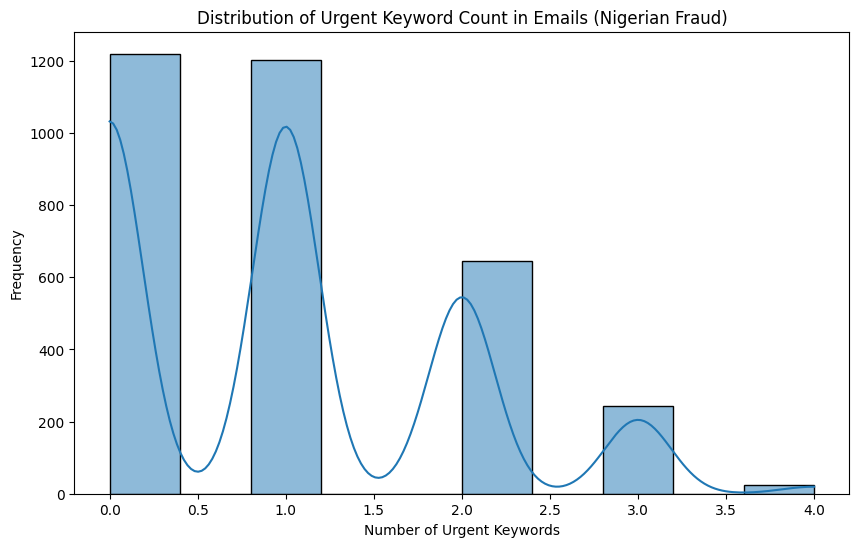

In [ ]:
def keyword_frequency(text, keywords):
    text = text.lower()
    return sum(keyword in text for keyword in keywords)

# Keywords for urgent action
urgent_keywords = [
    'urgent', 'immediately', 'asap', 'action required', 'important', 'critical', 'attention', 'prompt',
    'emergency', 'act now', 'time-sensitive', 'alert', 'high-priority', 'important update', 'do not ignore',
    'response needed', 'please respond'
]

# Apply keyword frequency function
nigerian_fraud['urgent_keyword_count'] = nigerian_fraud['body'].apply(lambda x: keyword_frequency(x, urgent_keywords))

# Plot urgent keyword count distribution
plt.figure(figsize=(10,6))
sns.histplot(nigerian_fraud['urgent_keyword_count'], bins=10, kde=True)
plt.title('Distribution of Urgent Keyword Count in Emails (Nigerian Fraud)')
plt.xlabel('Number of Urgent Keywords')
plt.ylabel('Frequency')
plt.show()



# Random Forest Model

### Feature Functions Defintion

In [ ]:
def check_urgent_action(text):
    urgent_keywords = [
        'urgent', 'immediately', 'asap', 'action required', 'important', 'critical', 'attention', 'prompt',
        'emergency', 'act now', 'time-sensitive', 'alert', 'high-priority', 'important update', 'do not ignore',
        'response needed', 'please respond'
    ]
    return any(keyword in text.lower() for keyword in urgent_keywords)

def check_poor_grammar(text):
    spelling_errors = [
        'teh', 'recieve', 'adn', 'definately', 'seperate', 'occured', 'untill', 'adress', 'wich', 'freind',
        'interrest', 'recieved', 'tommorow', 'hapen', 'acomodate', 'comitment', 'gratefull', 'inconvience',
        'posession', 'pronounciation', 'publically', 'recieve', 'untill', 'wierd', 'occurred', 'adres',
        'adressee', 'adress', 'suposed', 'suposse', 'succesfull', 'accomodate', 'acomodate', 'acommadate'
    ]
    return any(error in text.lower() for error in spelling_errors)

def check_unfamiliar_greeting(text):
    greetings = [
        'dear customer', 'dear user', 'hello', 'hi', 'dear sir', 'dear madam', 'to whom it may concern',
        'dear valued customer', 'greetings', 'hey', 'good day', 'hi there', 'dear friend'
    ]
    return any(greeting in text.lower() for greeting in greetings)

def check_requests_for_credentials(text):
    credentials_requests = [
        'login', 'password', 'ssn', 'social security', 'credit card', 'payment information',
        'username', 'credentials', 'account', 'access', 'verify', 'update', 'confirm',
        'authentication', 'secure', 'personal information', 'pin', 'two-factor authentication'
    ]
    return any(request in text.lower() for request in credentials_requests)

def check_too_good_to_be_true(text):
    too_good_to_be_true = [
        'won', 'winner', 'prize', 'free', 'gift', 'congratulations', 'jackpot', 'fortune', 'wealth',
        'cash', 'bonanza', 'reward', 'gain', 'profitable', 'lucrative', 'exclusive offer',
        'limited time', 'once in a lifetime', 'special offer', 'no catch', 'guaranteed', 'win big',
        'golden opportunity', 'get rich', 'earn money', 'investment opportunity'
    ]
    return any(offer in text.lower() for offer in too_good_to_be_true)

def check_suspicious_attachments(text):
    suspicious_attachments = [
        'attachment', 'file', 'download', 'click', 'open', 'see attached', 'document', 'invoice',
        'statement', 'receipt', 'urgent', 'important', 'security', 'alert', 'click here',
        'check attachment', 'attached file', 'view document', 'access file'
    ]
    return any(attachment in text.lower() for attachment in suspicious_attachments)

def check_html_tags(text):
    html_tags = ['<a', '<img', '<form', '<input', '<script', '<iframe']
    return any(tag in text.lower() for tag in html_tags)

def get_length(text):
    return len(text)

def get_special_char_ratio(text):
    special_chars = sum(not c.isalnum() and not c.isspace() for c in text)
    return special_chars / len(text)

def count_urls(text):
    url_pattern = r'(https?://[^\s]+|http?://[^\s]+)'
    urls = re.findall(url_pattern, text)
    return len(urls)

def check_generic_request(text):
    generic_phrases = [
        'as discussed', 'could you forward', 'please send', 'requesting document', 'quick info', 'need info',
        'can you send', 'provide details', 'send the file', 'urgent request', 'follow up', 'needed asap',
        'send me the document'
    ]
    return any(phrase in text.lower() for phrase in generic_phrases)

def check_polite_language(text):
    polite_phrases = ['please', 'kindly', 'could you', 'thank you', 'would you', 'grateful', 'appreciate', 'regards', 'sincerely']
    return any(phrase in text.lower() for phrase in polite_phrases)

def check_unusual_request(text):
    unusual_requests = ['gift cards', 'transfer money', 'bank details', 'send funds', 'urgent transfer', 'wire money', 'cryptocurrency']
    return any(request in text.lower() for request in unusual_requests)

def check_financial_terms(text):
    financial_terms = ['invoice', 'payment', 'credit', 'debit', 'bank', 'account', 'fund', 'transaction', 'balance', 'statement', 'due']
    return any(term in text.lower() for term in financial_terms)

def check_phishing_indicators(text):
    phishing_indicators = ['phishing', 'scam', 'fraud', 'fake', 'hoax', 'spoof', 'malware', 'virus', 'identity theft']
    return any(indicator in text.lower() for indicator in phishing_indicators)

def check_impersonal_language(text):
    impersonal_phrases = ['user', 'account holder', 'valued customer', 'member', 'client', 'account owner', 'subscriber']
    return any(phrase in text.lower() for phrase in impersonal_phrases)

def check_repeated_words(text):
    words = text.lower().split()
    return any(words.count(word) > 2 for word in words)

def check_abnormal_formatting(text):
    formatting_issues = ['ALL CAPS', '!!!', '???', 'red text', 'bold', 'italic']
    return any(issue in text for issue in formatting_issues)

def check_short_and_vague(text):
    return len(text) < 50 or 'important' in text.lower()

### Combining and Balancing Dataset & Handling Missing Values

In [ ]:

# Combine datasets
datasets = [ceas, spamassassin, trec_1, trec_2, trec_3, enron, ling, nazario, nigerian_fraud]
combined_df = pd.concat(datasets, ignore_index=True)

# Ensure all text columns are strings
combined_df['subject'] = combined_df['subject'].astype(str)
combined_df['body'] = combined_df['body'].astype(str)


In [ ]:
# Drop rows with missing values
combined_df.dropna(inplace=True)

In [ ]:
from sklearn.utils import resample

# Separate majority and minority classes
phishing = combined_df[combined_df['label'] == 1]
legit = combined_df[combined_df['label'] == 0]

# Balance the classes
if len(phishing) < len(legit):
    legit_downsampled = resample(legit, replace=False, n_samples=len(phishing), random_state=42)
    balanced_df = pd.concat([phishing, legit_downsampled])
else:
    phishing_downsampled = resample(phishing, replace=False, n_samples=len(legit), random_state=42)
    balanced_df = pd.concat([legit, phishing_downsampled])

# Shuffle the balanced dataset
balanced_df = balanced_df.sample(frac=1).reset_index(drop=True)


### Features Extraction

In [ ]:
# Feature extraction functions
def extract_features(df):
    df['email_length'] = df['subject'].str.len() + df['body'].str.len()
    df['url_count'] = df['body'].apply(count_urls)
    df['special_char_ratio'] = df['body'].apply(get_special_char_ratio)
    df['urgent_action'] = df['body'].apply(check_urgent_action)
    df['poor_grammar'] = df['body'].apply(check_poor_grammar)
    df['unfamiliar_greeting'] = df['body'].apply(check_unfamiliar_greeting)
    df['requests_for_credentials'] = df['body'].apply(check_requests_for_credentials)
    df['too_good_to_be_true'] = df['body'].apply(check_too_good_to_be_true)
    df['suspicious_attachments'] = df['body'].apply(check_suspicious_attachments)
    df['html_tags'] = df['body'].apply(check_html_tags)
    df['generic_request'] = df['body'].apply(check_generic_request)
    df['polite_language'] = df['body'].apply(check_polite_language)
    df['unusual_request'] = df['body'].apply(check_unusual_request)
    df['financial_terms'] = df['body'].apply(check_financial_terms)
    df['phishing_indicators'] = df['body'].apply(check_phishing_indicators)
    df['impersonal_language'] = df['body'].apply(check_impersonal_language)
    df['repeated_words'] = df['body'].apply(check_repeated_words)
    df['abnormal_formatting'] = df['body'].apply(check_abnormal_formatting)
    df['short_and_vague'] = df['body'].apply(check_short_and_vague)
    return df

# Apply feature extraction
combined_df = extract_features(combined_df)

# Convert boolean features to integers
bool_features = ['urgent_action', 'poor_grammar', 'unfamiliar_greeting', 'requests_for_credentials', 'too_good_to_be_true',
                 'suspicious_attachments', 'html_tags', 'generic_request', 'polite_language', 'unusual_request',
                 'financial_terms', 'phishing_indicators', 'impersonal_language', 'repeated_words', 'abnormal_formatting',
                 'short_and_vague']

combined_df[bool_features] = combined_df[bool_features].astype(int)

# Selected features and labels
features = combined_df[['email_length', 'url_count', 'special_char_ratio'] + bool_features]
labels = combined_df['label']

### Train-Test Split

In [ ]:
from sklearn.model_selection import train_test_split

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size=0.2, random_state=42)

### Train the Random Forest Model

In [ ]:
from sklearn.ensemble import RandomForestClassifier

# Instantiate the model
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)

# Train the model
rf_model.fit(X_train, y_train)


RandomForestClassifier(random_state=42)

### Evaluate the Model

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

# Make predictions on the test set
y_pred = rf_model.predict(X_test)

# Calculate evaluation metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print("Confusion Matrix:")
print(conf_matrix)


Accuracy: 0.8469
Precision: 0.8523
Recall: 0.8217
F1 Score: 0.8367
Confusion Matrix:
[[18913  2826]
 [ 3539 16306]]


## Feature Engineering

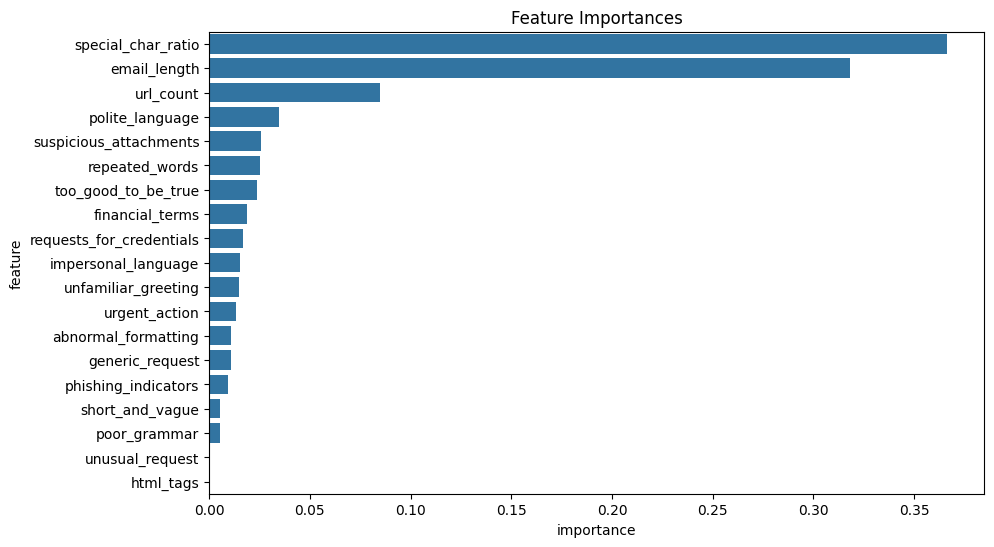

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Get feature importances
importances = rf_model.feature_importances_
feature_names = features.columns
feature_importances = pd.DataFrame({'feature': feature_names, 'importance': importances})
feature_importances = feature_importances.sort_values(by='importance', ascending=False)

# Plot feature importances
plt.figure(figsize=(10,6))
sns.barplot(x='importance', y='feature', data=feature_importances)
plt.title('Feature Importances')
plt.show()


## Fine-Tuning the Random Forest Hyperparameters

In [ ]:
# Define the most important features based on the plot
important_features = ['special_char_ratio', 'email_length', 'url_count',
                      'polite_language', 'suspicious_attachments', 'repeated_words']

# Prepare the data with the selected features
X_train_selected = X_train[important_features]
X_test_selected = X_test[important_features]


In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

# Define the parameter grid for fine-tuning
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False]
}

# Instantiate the RandomizedSearchCV object
rf_random = RandomizedSearchCV(estimator=rf_model,
                               param_distributions=param_grid,
                               n_iter=50,  # Number of iterations
                               cv=3,  # 3-fold cross-validation
                               verbose=2,  # Print details about progress
                               random_state=42,  # For reproducibility
                               n_jobs=-1)  # Use all available cores

# Fit the RandomizedSearchCV to the training data with selected features
rf_random.fit(X_train_selected, y_train)

# Get the best parameters
best_params = rf_random.best_params_
print(f"Best parameters found: {best_params}")

# Get the best model
best_rf_model = rf_random.best_estimator_

# Make predictions on the test set with the selected features
y_pred = best_rf_model.predict(X_test_selected)

# Calculate evaluation metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print("Confusion Matrix:")
print(conf_matrix)


Fitting 3 folds for each of 50 candidates, totalling 150 fits


/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid = os.fork()


Best parameters found: {'n_estimators': 200, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_features': 'log2', 'max_depth': 20, 'bootstrap': True}
Accuracy: 0.8456
Precision: 0.8518
Recall: 0.8156
F1 Score: 0.8333
Confusion Matrix:
[[15540  2269]
 [ 2948 13040]]


## Save the Best Random Forest Model

In [ ]:
# Save the best model
joblib.dump(best_rf_model, '/content/drive/MyDrive/Phishing_Email_Detection/models/best_rf_model.pkl')

['/content/drive/MyDrive/Phishing_Email_Detection/models/best_rf_model.pkl']

# Gradient Boosting Classifier

## Instantiate and Train the GB Classifier Model

### Import Necessary Librairies

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

### Instantiate and Train

In [ ]:
# Instantiate the model
gb_model = GradientBoostingClassifier(random_state=42)

# Train the model
gb_model.fit(X_train, y_train)


GradientBoostingClassifier(random_state=42)

## Feature Engineering

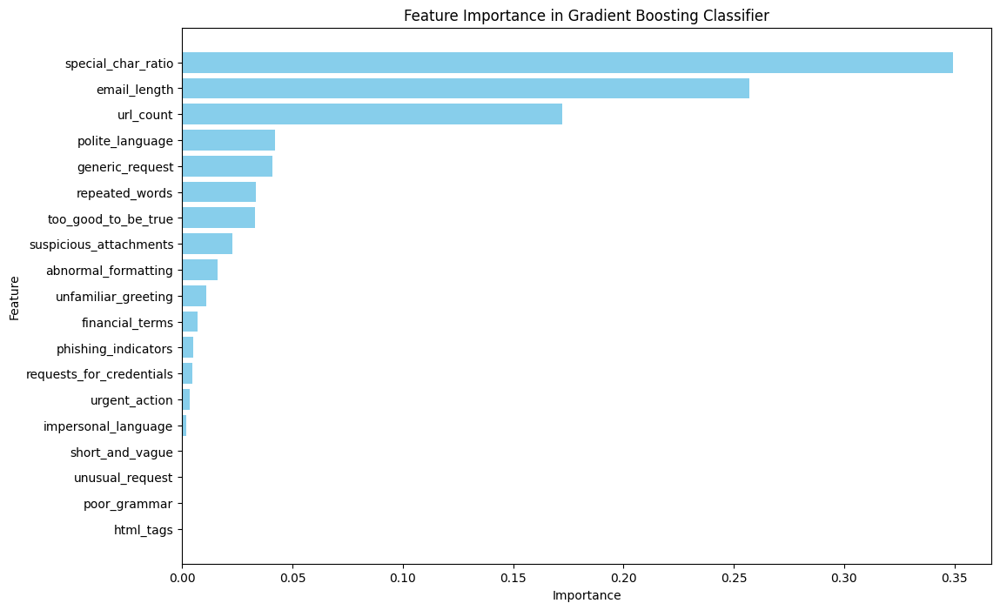

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Extract feature importances
feature_importances = gb_model.feature_importances_

# Create a DataFrame for better visualization
features_list = ['email_length', 'url_count', 'special_char_ratio'] + bool_features
importance_df = pd.DataFrame({
    'Feature': features_list,
    'Importance': feature_importances
})

# Sort the DataFrame by importance
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Plot the feature importances
plt.figure(figsize=(12, 8))
plt.barh(importance_df['Feature'], importance_df['Importance'], color='skyblue')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importance in Gradient Boosting Classifier')
plt.gca().invert_yaxis()
plt.show()


In [ ]:
# Define the most important features based on the plot
important_features = ['special_char_ratio', 'email_length', 'url_count',
                      'polite_language', 'generic_request', 'too_good_to_be_true', 'repeated_words']

# Prepare the data with the selected features
X_train_selected = X_train[important_features]
X_test_selected = X_test[important_features]

In [ ]:
# Instantiate the model
gb_model = GradientBoostingClassifier(random_state=42)

# Train the model
gb_model.fit(X_train_selected, y_train)

GradientBoostingClassifier(random_state=42)

## Evaluate the GBC Model

In [ ]:
# Make predictions on the test set
y_pred_gb = gb_model.predict(X_test_selected)

# Calculate evaluation metrics
accuracy_gb = accuracy_score(y_test, y_pred_gb)
precision_gb = precision_score(y_test, y_pred_gb)
recall_gb = recall_score(y_test, y_pred_gb)
f1_gb = f1_score(y_test, y_pred_gb)
conf_matrix_gb = confusion_matrix(y_test, y_pred_gb)

print(f"Gradient Boosting Model:")
print(f"Accuracy: {accuracy_gb:.4f}")
print(f"Precision: {precision_gb:.4f}")
print(f"Recall: {recall_gb:.4f}")
print(f"F1 Score: {f1_gb:.4f}")
print("Confusion Matrix:")
print(conf_matrix_gb)

Gradient Boosting Model:
Accuracy: 0.7799
Precision: 0.7691
Recall: 0.7643
F1 Score: 0.7667
Confusion Matrix:
[[14140  3669]
 [ 3769 12219]]


## Fine-Tune the GBC Model

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import RandomizedSearchCV

# Define the parameter grid
param_grid_gb = {
    'n_estimators': [100, 200, 300, 400, 500],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'max_depth': [3, 4, 5, 6, 7],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Instantiate the RandomizedSearchCV object
gb_random = RandomizedSearchCV(estimator=GradientBoostingClassifier(random_state=42),
                               param_distributions=param_grid_gb,
                               n_iter=50,  # Number of iterations
                               cv=3,  # 3-fold cross-validation
                               verbose=2,  # Print details about progress
                               random_state=42,  # For reproducibility
                               n_jobs=-1)  # Use all available cores

# Fit the RandomizedSearchCV to the training data
gb_random.fit(X_train_selected, y_train)

# Get the best parameters and model
best_params_gb = gb_random.best_params_
best_gb_model = gb_random.best_estimator_

# Make predictions and evaluate the model
y_pred_gb = best_gb_model.predict(X_test_selected)
accuracy_gb = accuracy_score(y_test, y_pred_gb)
precision_gb = precision_score(y_test, y_pred_gb)
recall_gb = recall_score(y_test, y_pred_gb)
f1_gb = f1_score(y_test, y_pred_gb)

print(f"Gradient Boosting Model - Best Parameters: {best_params_gb}")
print(f"Accuracy: {accuracy_gb:.4f}, Precision: {precision_gb:.4f}, Recall: {recall_gb:.4f}, F1 Score: {f1_gb:.4f}")


Fitting 3 folds for each of 50 candidates, totalling 150 fits


/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid = os.fork()
/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid = os.fork()


Gradient Boosting Model - Best Parameters: {'n_estimators': 300, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_depth': 7, 'learning_rate': 0.1}
Accuracy: 0.8356, Precision: 0.8394, Recall: 0.8069, F1 Score: 0.8228


# Logistic Regression Model

## Train the Logistic Regression Model

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler

# Standardize the features (important for Logistic Regression)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [ ]:
from sklearn.linear_model import LogisticRegression

# Instantiate the model
logreg_model = LogisticRegression(random_state=42, max_iter=1000)

# Train the model
logreg_model.fit(X_train, y_train)


LogisticRegression(max_iter=1000, random_state=42)

## Feature Engineering

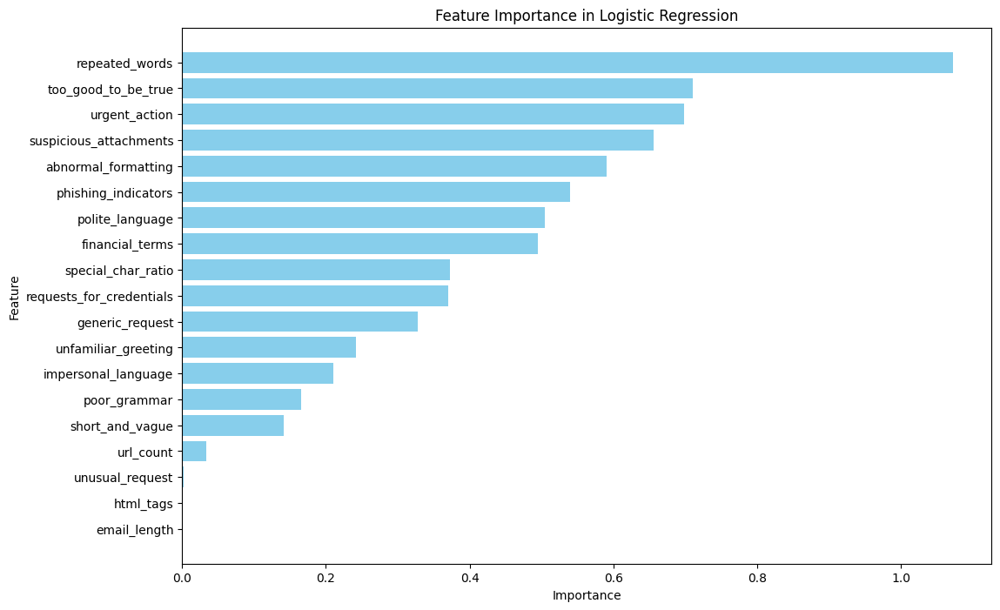

In [ ]:

# Extract the coefficients
coefficients = logreg_model.coef_[0]

# Create a DataFrame for better visualization
feature_names =  ['email_length', 'url_count', 'special_char_ratio'] + bool_features

importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': np.abs(coefficients)
})

# Sort the DataFrame by importance
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Plot the feature importances
plt.figure(figsize=(12, 8))
plt.barh(importance_df['Feature'], importance_df['Importance'], color='skyblue')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importance in Logistic Regression')
plt.gca().invert_yaxis()
plt.show()

In [ ]:
# Define the most important features based on the plot
important_features = ['repeated_words', 'too_good_to_be_true', 'urgent_action', 'suspicious_attachments',
                      'abnormal_formatting', 'phishing_indicators', 'polite_language', 'financial_terms',
                      'special_char_ratio', 'requests_for_credentials']

# Prepare the data with the selected features
X_train_selected = X_train[important_features]
X_test_selected = X_test[important_features]

In [ ]:
from sklearn.linear_model import LogisticRegression

# Instantiate the model
logreg_model = LogisticRegression(random_state=42, max_iter=1000)

# Train the model
logreg_model.fit(X_train_selected, y_train)

LogisticRegression(max_iter=1000, random_state=42)

## Evaluate the Logistic Regression Model

In [ ]:
# Make predictions on the test set
y_pred_logreg = logreg_model.predict(X_test_selected)

# Calculate evaluation metrics
accuracy_logreg = accuracy_score(y_test, y_pred_logreg)
precision_logreg = precision_score(y_test, y_pred_logreg)
recall_logreg = recall_score(y_test, y_pred_logreg)
f1_logreg = f1_score(y_test, y_pred_logreg)
conf_matrix_logreg = confusion_matrix(y_test, y_pred_logreg)

print(f"Logistic Regression Model:")
print(f"Accuracy: {accuracy_logreg:.4f}")
print(f"Precision: {precision_logreg:.4f}")
print(f"Recall: {recall_logreg:.4f}")
print(f"F1 Score: {f1_logreg:.4f}")
print("Confusion Matrix:")
print(conf_matrix_logreg)


Logistic Regression Model:
Accuracy: 0.6479
Precision: 0.6474
Recall: 0.5612
F1 Score: 0.6013
Confusion Matrix:
[[12923  4886]
 [ 7015  8973]]


## Fine-Tune the Logistic Regression Model

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import RandomizedSearchCV

# Define the parameter grid
param_grid_logreg = {
    'C': [0.01, 0.1, 1, 10, 100],
    'penalty': ['l1', 'l2'],
    'solver': ['liblinear', 'saga']
}

# Instantiate the RandomizedSearchCV object
logreg_random = RandomizedSearchCV(estimator=LogisticRegression(random_state=42),
                                   param_distributions=param_grid_logreg,
                                   n_iter=50,  # Number of iterations
                                   cv=3,  # 3-fold cross-validation
                                   verbose=2,  # Print details about progress
                                   random_state=42,  # For reproducibility
                                   n_jobs=-1)  # Use all available cores

# Fit the RandomizedSearchCV to the training data
logreg_random.fit(X_train_selected, y_train)

# Get the best parameters and model
best_params_logreg = logreg_random.best_params_
best_logreg_model = logreg_random.best_estimator_

# Make predictions and evaluate the model
y_pred_logreg = best_logreg_model.predict(X_test_selected)
accuracy_logreg = accuracy_score(y_test, y_pred_logreg)
precision_logreg = precision_score(y_test, y_pred_logreg)
recall_logreg = recall_score(y_test, y_pred_logreg)
f1_logreg = f1_score(y_test, y_pred_logreg)

print(f"Logistic Regression Model - Best Parameters: {best_params_logreg}")
print(f"Accuracy: {accuracy_logreg:.4f}, Precision: {precision_logreg:.4f}, Recall: {recall_logreg:.4f}, F1 Score: {f1_logreg:.4f}")


Fitting 3 folds for each of 20 candidates, totalling 60 fits


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:305: UserWarning: The total space of parameters 20 is smaller than n_iter=50. Running 20 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid = os.fork()


Logistic Regression Model - Best Parameters: {'solver': 'liblinear', 'penalty': 'l2', 'C': 100}
Accuracy: 0.6485, Precision: 0.6479, Recall: 0.5630, F1 Score: 0.6025


## Explantion of Performance

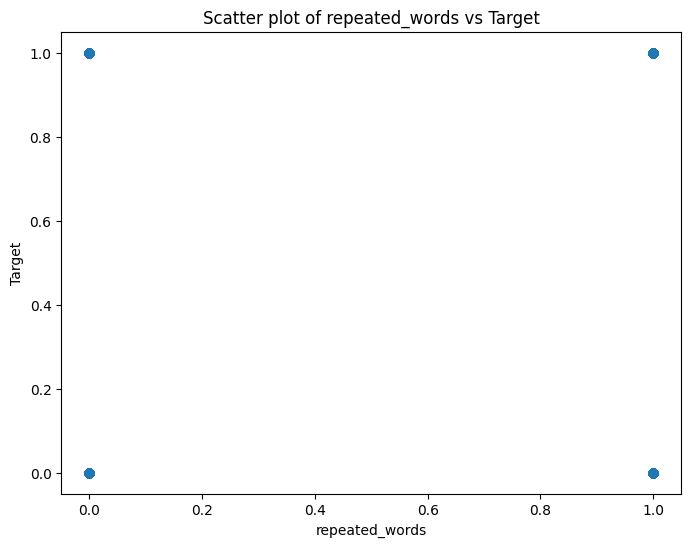

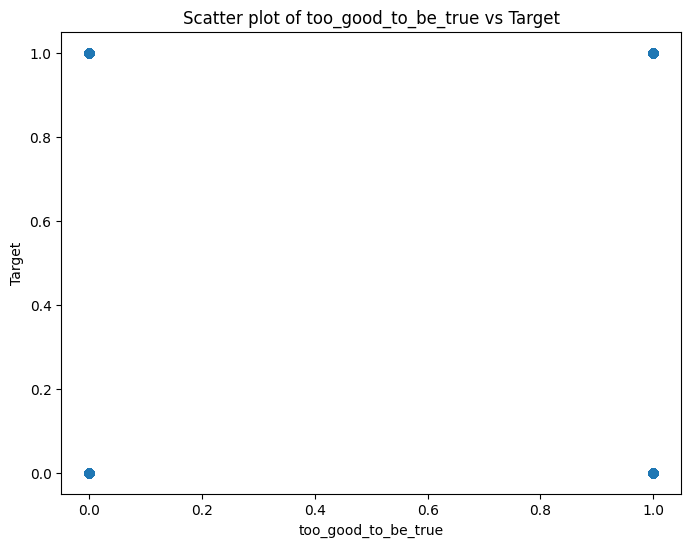

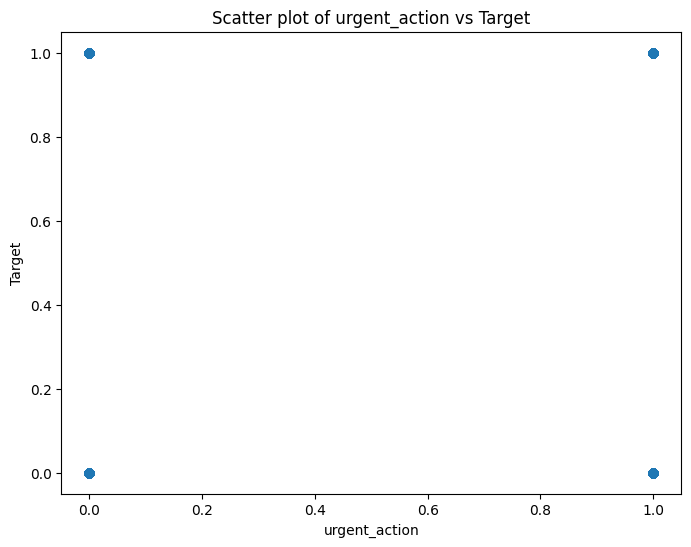

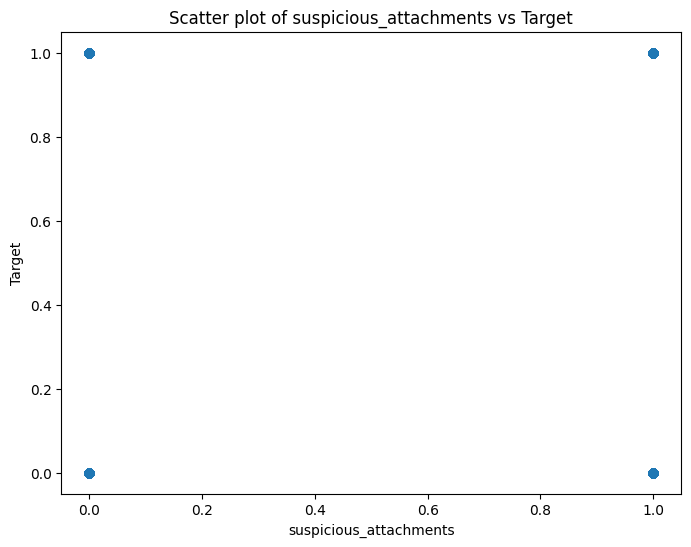

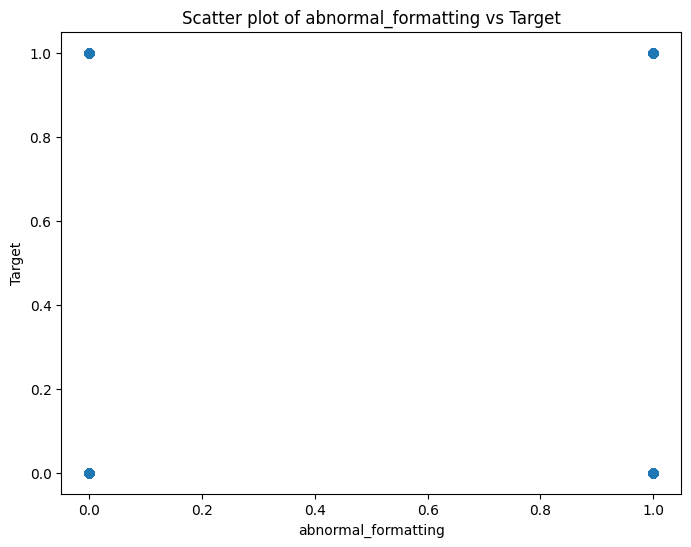

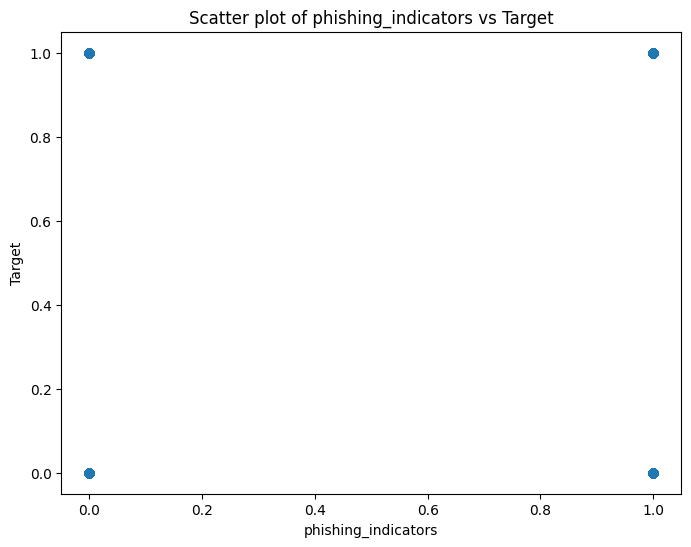

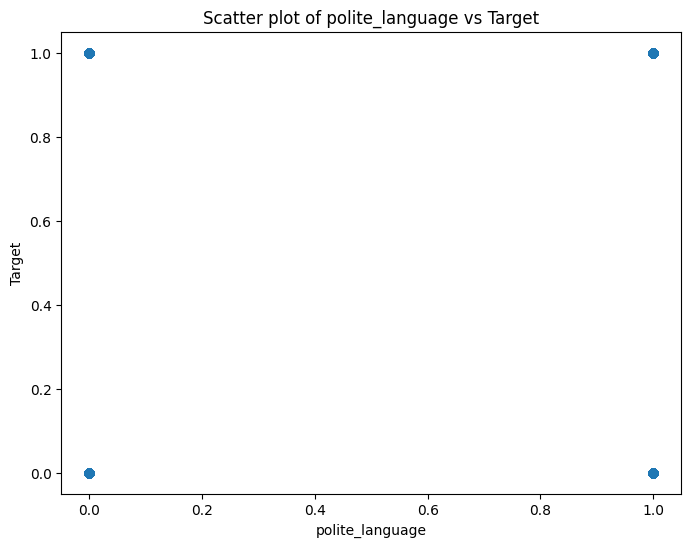

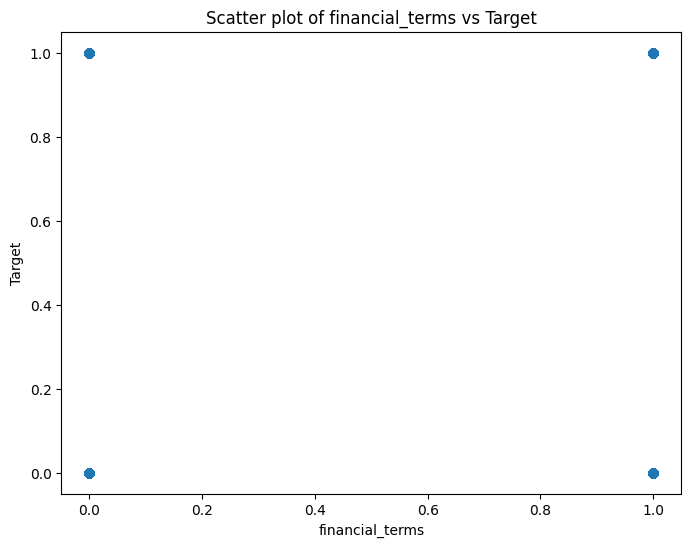

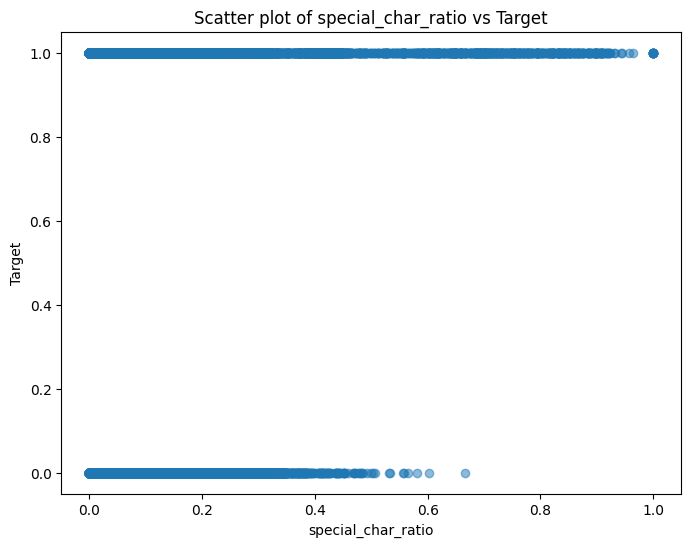

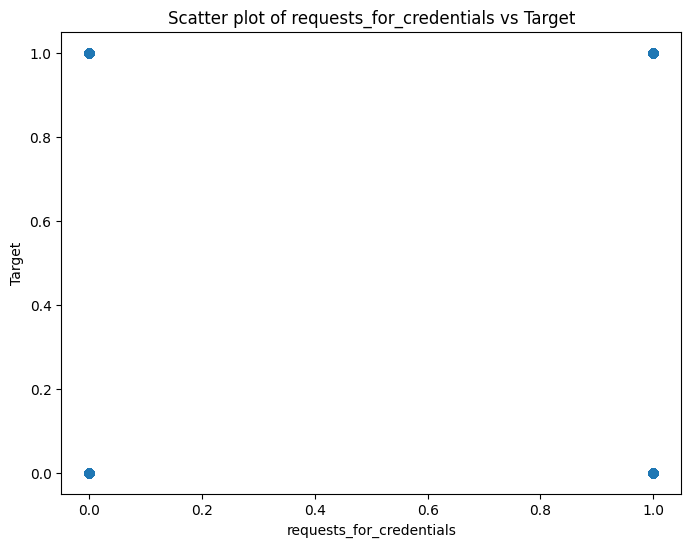

In [ ]:
import matplotlib.pyplot as plt

for feature in important_features:
    plt.figure(figsize=(8, 6))
    plt.scatter(X_train_selected[feature], y_train, alpha=0.5)
    plt.xlabel(feature)
    plt.ylabel('Target')
    plt.title(f'Scatter plot of {feature} vs Target')
    plt.show()


In [ ]:
import pandas as pd

# Combine features and target for easier calculation
df = X_train_selected.copy()
df['target'] = y_train

# Calculate correlation coefficients
correlation_matrix = df.corr()
print(correlation_matrix['target'].sort_values(ascending=False))


target                      1.000000
abnormal_formatting         0.070884
phishing_indicators         0.066189
too_good_to_be_true         0.049727
urgent_action              -0.006713
financial_terms            -0.035202
requests_for_credentials   -0.038448
special_char_ratio         -0.144201
polite_language            -0.160374
suspicious_attachments     -0.185578
repeated_words             -0.235415
Name: target, dtype: float64


In [ ]:
from scipy.stats import pearsonr

for feature in important_features:
    corr, _ = pearsonr(X_train_selected[feature], y_train)
    print(f'Pearson correlation between {feature} and target: {corr:.2f}')


Pearson correlation between repeated_words and target: -0.24
Pearson correlation between too_good_to_be_true and target: 0.05
Pearson correlation between urgent_action and target: -0.01
Pearson correlation between suspicious_attachments and target: -0.19
Pearson correlation between abnormal_formatting and target: 0.07
Pearson correlation between phishing_indicators and target: 0.07
Pearson correlation between polite_language and target: -0.16
Pearson correlation between financial_terms and target: -0.04
Pearson correlation between special_char_ratio and target: -0.14
Pearson correlation between requests_for_credentials and target: -0.04


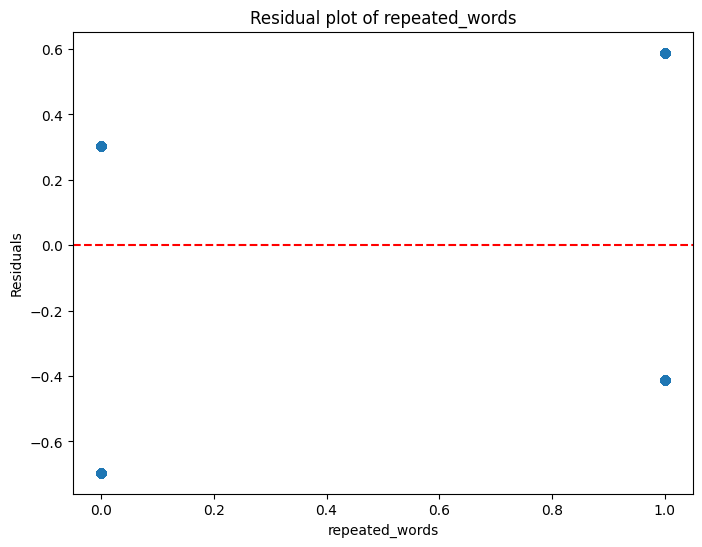

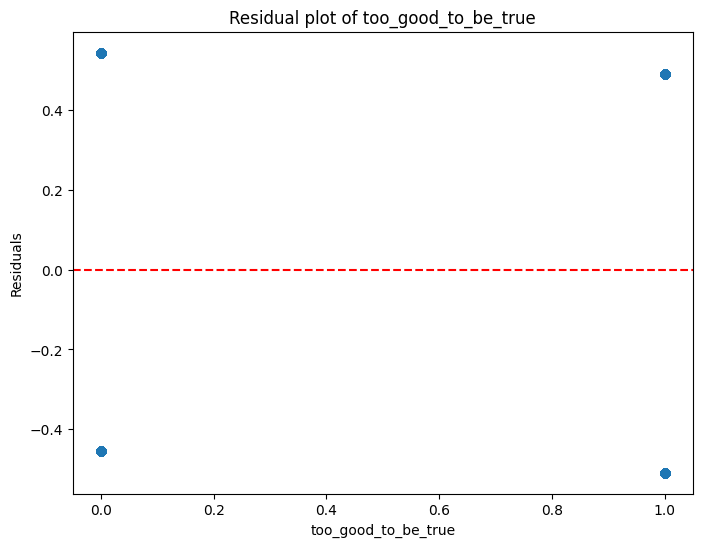

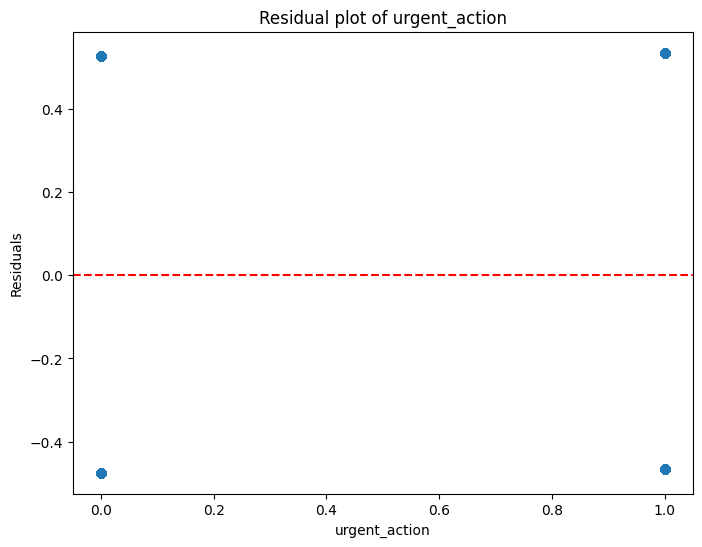

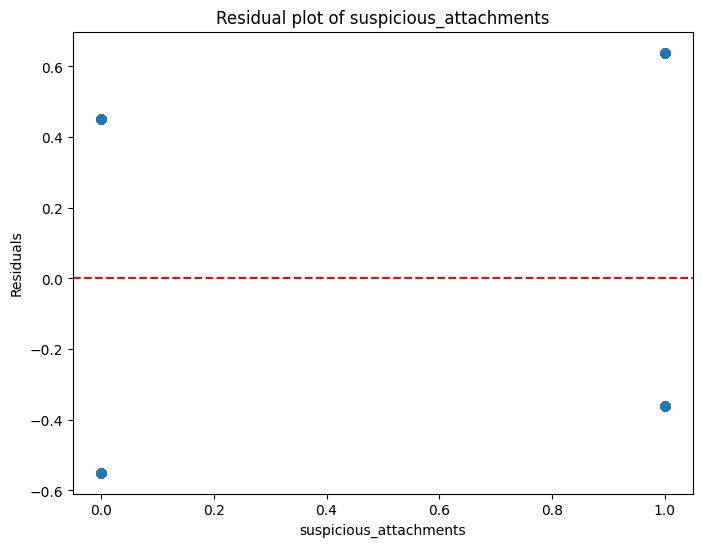

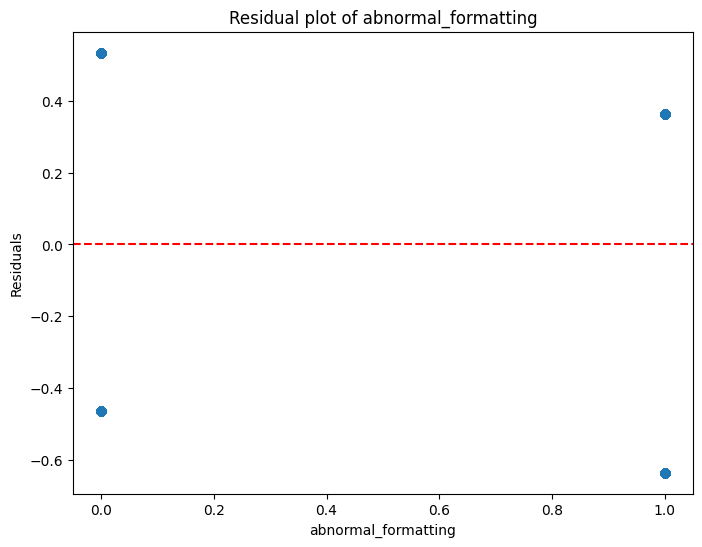

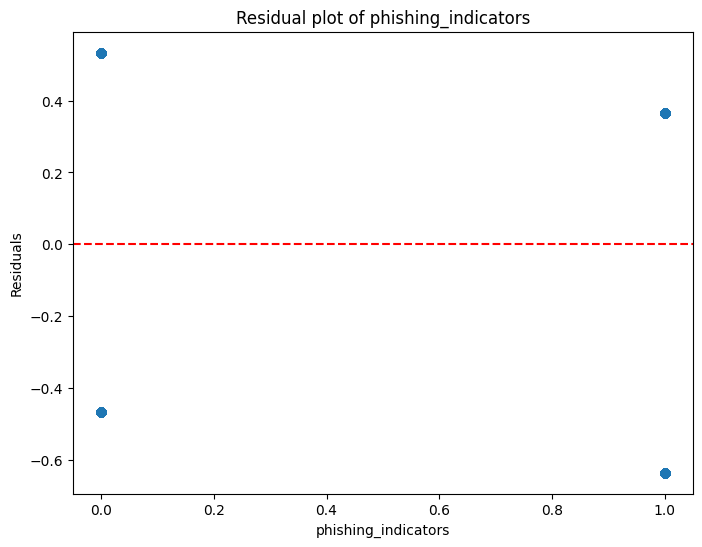

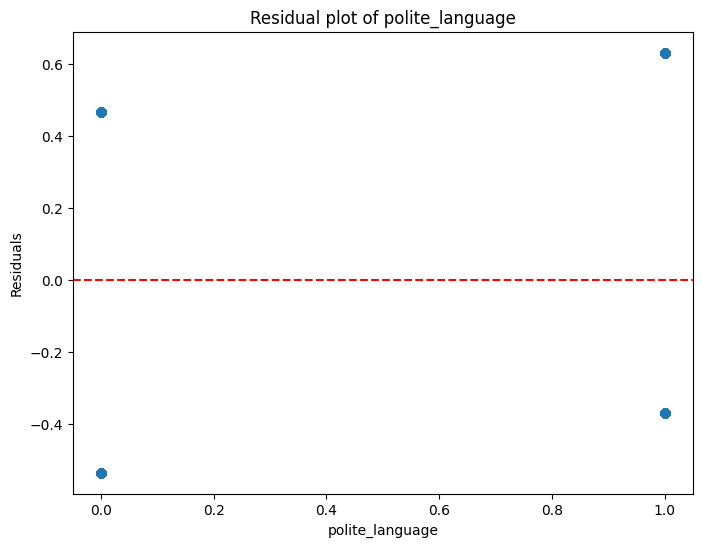

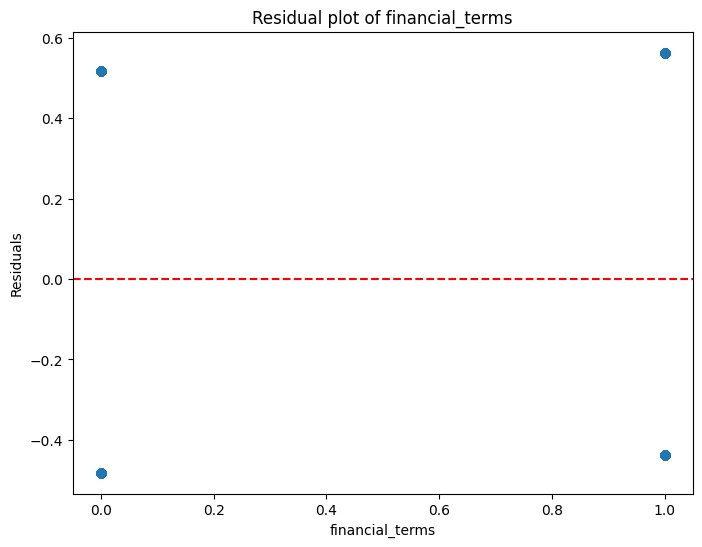

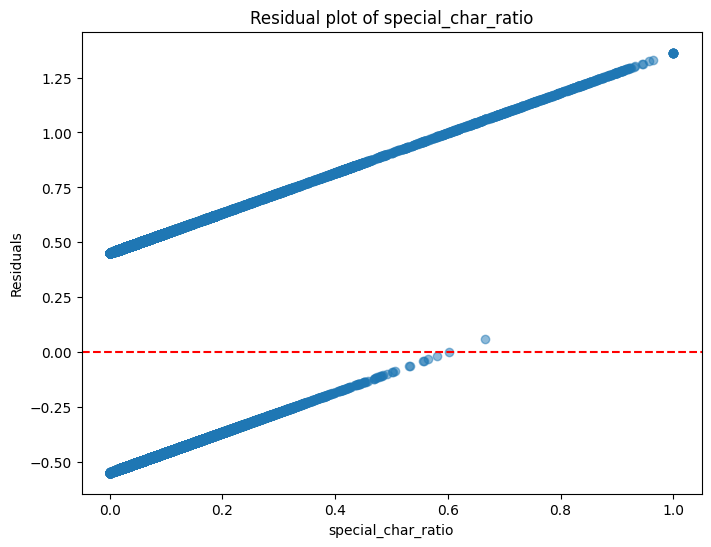

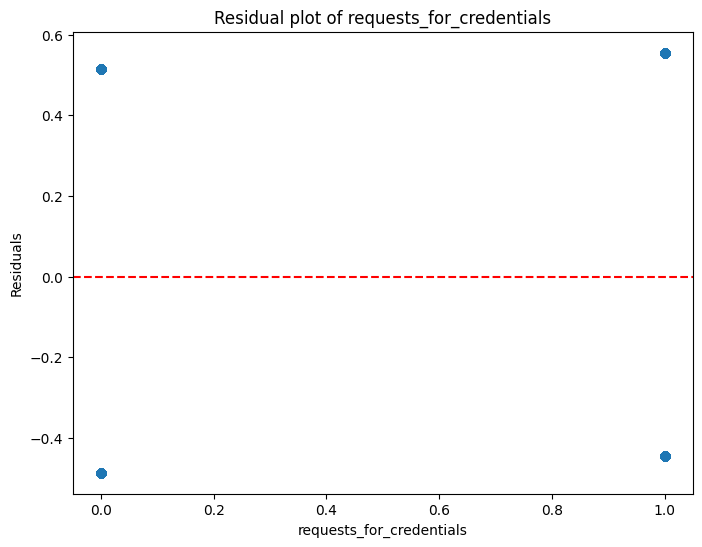

In [ ]:
import statsmodels.api as sm
import numpy as np

for feature in important_features:
    X = X_train_selected[feature]
    X = sm.add_constant(X)  # Adds a constant term to the predictor
    model = sm.OLS(y_train, X).fit()
    residuals = model.resid

    plt.figure(figsize=(8, 6))
    plt.scatter(X_train_selected[feature], residuals, alpha=0.5)
    plt.axhline(y=0, color='r', linestyle='--')
    plt.xlabel(feature)
    plt.ylabel('Residuals')
    plt.title(f'Residual plot of {feature}')
    plt.show()


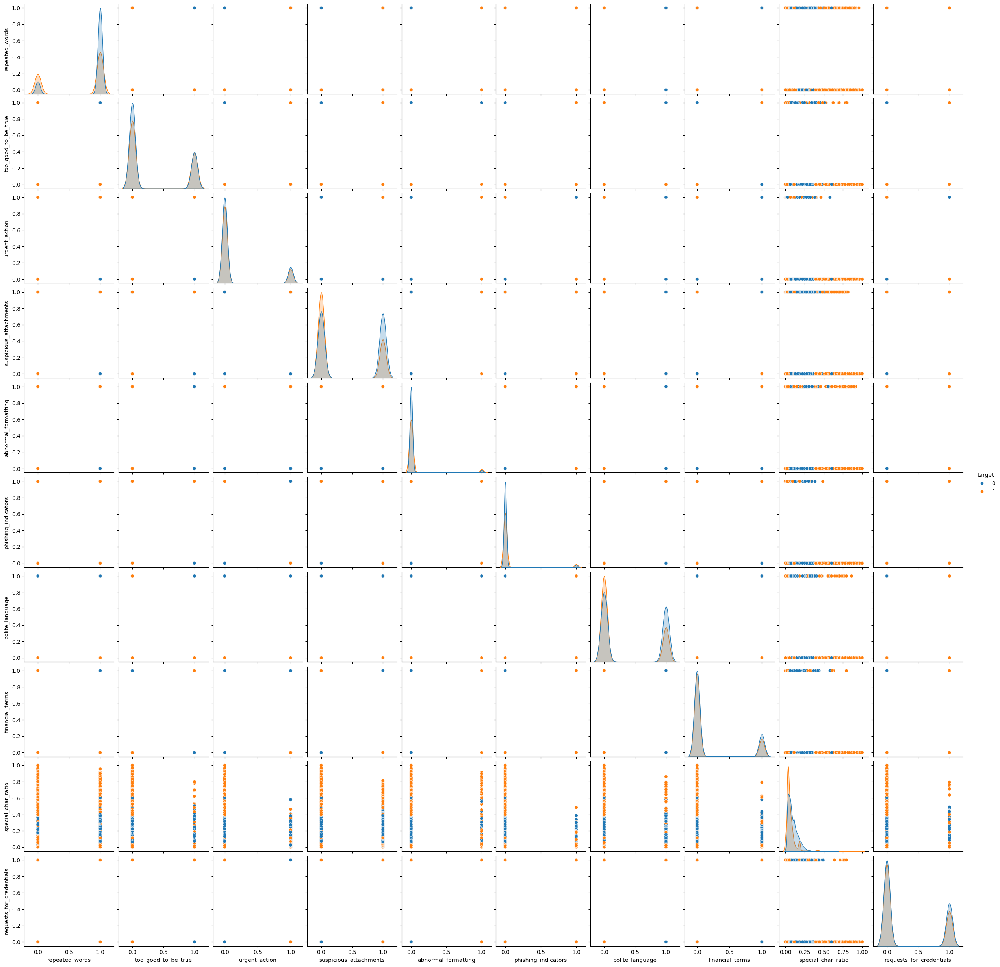

In [ ]:
import seaborn as sns

# Combine the features and target for visualization
df = X_train_selected.copy()
df['target'] = y_train

# Create a pair plot
sns.pairplot(df, hue='target')
plt.show()


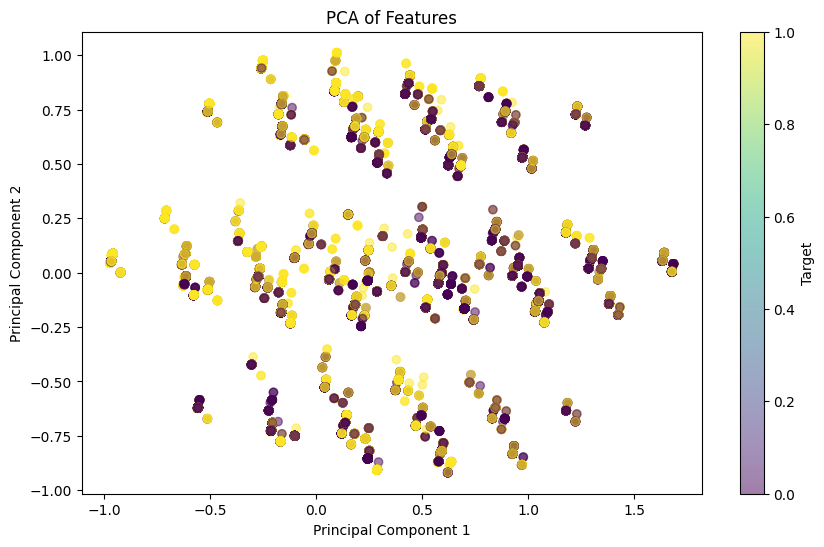

In [ ]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_train_selected)

plt.figure(figsize=(10, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y_train, cmap='viridis', alpha=0.5)
plt.title('PCA of Features')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.colorbar(label='Target')
plt.show()

# Homogeneous data appear clustered together with no clear separation between classes.


# DistilBERT Model

## Feature Engineering

### Feature Extraction Functions

In [ ]:
def check_urgent_action(text):
    urgent_keywords = [
        'urgent', 'immediately', 'asap', 'action required', 'important', 'critical', 'attention', 'prompt',
        'emergency', 'act now', 'time-sensitive', 'alert', 'high-priority', 'important update', 'do not ignore',
        'response needed', 'please respond'
    ]
    return any(keyword in text.lower() for keyword in urgent_keywords)

def check_poor_grammar(text):
    spelling_errors = [
        'teh', 'recieve', 'adn', 'definately', 'seperate', 'occured', 'untill', 'adress', 'wich', 'freind',
        'interrest', 'recieved', 'tommorow', 'hapen', 'acomodate', 'comitment', 'gratefull', 'inconvience',
        'posession', 'pronounciation', 'publically', 'recieve', 'untill', 'wierd', 'occurred', 'adres',
        'adressee', 'adress', 'suposed', 'suposse', 'succesfull', 'accomodate', 'acomodate', 'acommadate'
    ]
    return any(error in text.lower() for error in spelling_errors)

def check_unfamiliar_greeting(text):
    greetings = [
        'dear customer', 'dear user', 'hello', 'hi', 'dear sir', 'dear madam', 'to whom it may concern',
        'dear valued customer', 'greetings', 'hey', 'good day', 'hi there', 'dear friend'
    ]
    return any(greeting in text.lower() for greeting in greetings)

def check_requests_for_credentials(text):
    credentials_requests = [
        'login', 'password', 'ssn', 'social security', 'credit card', 'payment information',
        'username', 'credentials', 'account', 'access', 'verify', 'update', 'confirm',
        'authentication', 'secure', 'personal information', 'pin', 'two-factor authentication'
    ]
    return any(request in text.lower() for request in credentials_requests)

def check_too_good_to_be_true(text):
    too_good_to_be_true = [
        'won', 'winner', 'prize', 'free', 'gift', 'congratulations', 'jackpot', 'fortune', 'wealth',
        'cash', 'bonanza', 'reward', 'gain', 'profitable', 'lucrative', 'exclusive offer',
        'limited time', 'once in a lifetime', 'special offer', 'no catch', 'guaranteed', 'win big',
        'golden opportunity', 'get rich', 'earn money', 'investment opportunity'
    ]
    return any(offer in text.lower() for offer in too_good_to_be_true)

def check_suspicious_attachments(text):
    suspicious_attachments = [
        'attachment', 'file', 'download', 'click', 'open', 'see attached', 'document', 'invoice',
        'statement', 'receipt', 'urgent', 'important', 'security', 'alert', 'click here',
        'check attachment', 'attached file', 'view document', 'access file'
    ]
    return any(attachment in text.lower() for attachment in suspicious_attachments)

def check_html_tags(text):
    html_tags = ['<a', '<img', '<form', '<input', '<script', '<iframe']
    return any(tag in text.lower() for tag in html_tags)

def get_length(text):
    return len(text)

def get_special_char_ratio(text):
    special_chars = sum(not c.isalnum() and not c.isspace() for c in text)
    return special_chars / len(text)

def count_urls(text):
    url_pattern = r'(https?://[^\s]+|http?://[^\s]+)'
    urls = re.findall(url_pattern, text)
    return len(urls)

def check_generic_request(text):
    generic_phrases = [
        'as discussed', 'could you forward', 'please send', 'requesting document', 'quick info', 'need info',
        'can you send', 'provide details', 'send the file', 'urgent request', 'follow up', 'needed asap',
        'send me the document'
    ]
    return any(phrase in text.lower() for phrase in generic_phrases)

def check_polite_language(text):
    polite_phrases = ['please', 'kindly', 'could you', 'thank you', 'would you', 'grateful', 'appreciate', 'regards', 'sincerely']
    return any(phrase in text.lower() for phrase in polite_phrases)

def check_unusual_request(text):
    unusual_requests = ['gift cards', 'transfer money', 'bank details', 'send funds', 'urgent transfer', 'wire money', 'cryptocurrency']
    return any(request in text.lower() for request in unusual_requests)

def check_financial_terms(text):
    financial_terms = ['invoice', 'payment', 'credit', 'debit', 'bank', 'account', 'fund', 'transaction', 'balance', 'statement', 'due']
    return any(term in text.lower() for term in financial_terms)

def check_phishing_indicators(text):
    phishing_indicators = ['phishing', 'scam', 'fraud', 'fake', 'hoax', 'spoof', 'malware', 'virus', 'identity theft']
    return any(indicator in text.lower() for indicator in phishing_indicators)

def check_impersonal_language(text):
    impersonal_phrases = ['user', 'account holder', 'valued customer', 'member', 'client', 'account owner', 'subscriber']
    return any(phrase in text.lower() for phrase in impersonal_phrases)

def check_repeated_words(text):
    words = text.lower().split()
    return any(words.count(word) > 2 for word in words)

def check_abnormal_formatting(text):
    formatting_issues = ['ALL CAPS', '!!!', '???', 'red text', 'bold', 'italic']
    return any(issue in text for issue in formatting_issues)

def check_short_and_vague(text):
    return len(text) < 50 or 'important' in text.lower()

### Define the Datasets Preprocessing

In [ ]:
# Preprocess and Combine the Datasets

def preprocess_data(df, name):
    print(f"Preprocessing {name} dataset")
    df.dropna(inplace=True)
    df['subject'] = df['subject'].astype(str)
    df['body'] = df['body'].astype(str)
    df['text'] = df['subject'] + ' ' + df['body']
    df['urgent_action'] = df['text'].apply(check_urgent_action)
    df['poor_grammar'] = df['text'].apply(check_poor_grammar)
    df['unfamiliar_greeting'] = df['text'].apply(check_unfamiliar_greeting)
    df['requests_for_credentials'] = df['text'].apply(check_requests_for_credentials)
    df['too_good_to_be_true'] = df['text'].apply(check_too_good_to_be_true)
    df['suspicious_attachments'] = df['text'].apply(check_suspicious_attachments)
    df['html_tags'] = df['text'].apply(check_html_tags)
    df['length'] = df['text'].apply(get_length)
    df['special_char_ratio'] = df['text'].apply(get_special_char_ratio)
    df['url_count'] = df['text'].apply(count_urls)
    df['generic_request'] = df['text'].apply(check_generic_request)
    df['polite_language'] = df['text'].apply(check_polite_language)
    df['unusual_request'] = df['text'].apply(check_unusual_request)
    df['financial_terms'] = df['text'].apply(check_financial_terms)
    df['phishing_indicators'] = df['text'].apply(check_phishing_indicators)
    df['impersonal_language'] = df['text'].apply(check_impersonal_language)
    df['repeated_words'] = df['text'].apply(check_repeated_words)
    df['abnormal_formatting'] = df['text'].apply(check_abnormal_formatting)
    df['short_and_vague'] = df['text'].apply(check_short_and_vague)
    print(f"Processed {name} dataset")
    return df


### Preprocessing the Data

In [ ]:
ceas = preprocess_data(pd.read_csv('/content/drive/MyDrive/Phishing_Email_Detection/CEAS_08.csv'), "CEAS")
spamassassin = preprocess_data(pd.read_csv('/content/drive/MyDrive/Phishing_Email_Detection/SpamAssasin.csv'), "SpamAssassin")
trec_1 = preprocess_data(pd.read_csv('/content/drive/MyDrive/Phishing_Email_Detection/cleaned_TREC_06.csv'), "TREC_06")
trec_2 = preprocess_data(pd.read_csv('/content/drive/MyDrive/Phishing_Email_Detection/cleaned_TREC_05.csv'), "TREC_05")
trec_3 = preprocess_data(pd.read_csv('/content/drive/MyDrive/Phishing_Email_Detection/cleaned_TREC_07.csv'), "TREC_07")
enron = preprocess_data(pd.read_csv('/content/drive/MyDrive/Phishing_Email_Detection/Enron.csv'), "Enron")
ling = preprocess_data(pd.read_csv('/content/drive/MyDrive/Phishing_Email_Detection/Ling.csv'), "Ling")
nazario = preprocess_data(pd.read_csv('/content/drive/MyDrive/Phishing_Email_Detection/Nazario.csv'), "Nazario")
nigerian_fraud = preprocess_data(pd.read_csv('/content/drive/MyDrive/Phishing_Email_Detection/Nigerian_Fraud.csv'), "Nigerian_Fraud")


Preprocessing CEAS dataset
Processed CEAS dataset
Preprocessing SpamAssassin dataset
Processed SpamAssassin dataset
Preprocessing TREC_06 dataset
Processed TREC_06 dataset
Preprocessing TREC_05 dataset
Processed TREC_05 dataset
Preprocessing TREC_07 dataset
Processed TREC_07 dataset
Preprocessing Enron dataset
Processed Enron dataset
Preprocessing Ling dataset
Processed Ling dataset
Preprocessing Nazario dataset
Processed Nazario dataset
Preprocessing Nigerian_Fraud dataset
Processed Nigerian_Fraud dataset


## Combining and Balancing the Datasets

### Combine the Datasets

In [ ]:
combined_df = pd.concat([ceas, spamassassin, trec_1, trec_2, trec_3, enron, ling, nazario, nigerian_fraud])
combined_df.dropna(inplace=True)

print("Combined dataframe head:")
print(combined_df.head())
print("Combined dataframe info:")
print(combined_df.info())


Combined dataframe head:
                                              sender  \
0                   Young Esposito <Young@iworld.de>   
1                       Mok <ipline's1983@icable.ph>   
2  Daily Top 10 <Karmandeep-opengevl@universalnet...   
3                 Michael Parker <ivqrnai@pobox.com>   
4  Gretchen Suggs <externalsep1@loanofficertool.com>   

                                         receiver  \
0                     user4@gvc.ceas-challenge.cc   
1                   user2.2@gvc.ceas-challenge.cc   
2                   user2.9@gvc.ceas-challenge.cc   
3  SpamAssassin Dev <xrh@spamassassin.apache.org>   
4                   user2.2@gvc.ceas-challenge.cc   

                              date  \
0  Tue, 05 Aug 2008 16:31:02 -0700   
1  Tue, 05 Aug 2008 18:31:03 -0500   
2  Tue, 05 Aug 2008 20:28:00 -1200   
3  Tue, 05 Aug 2008 17:31:20 -0600   
4  Tue, 05 Aug 2008 19:31:21 -0400   

                                             subject  \
0                          Never a

### Balance the Combined Dataset using Undersampling

In [ ]:
phishing = combined_df[combined_df['label'] == 1]
legit = combined_df[combined_df['label'] == 0]

print(f"Number of phishing emails: {len(phishing)}, Number of legitimate emails: {len(legit)}")

if len(phishing) < len(legit):
    legit_downsampled = resample(legit, replace=False, n_samples=len(phishing), random_state=42)
    balanced_df = pd.concat([phishing, legit_downsampled])
else:
    phishing_downsampled = resample(phishing, replace=False, n_samples=len(legit), random_state=42)
    balanced_df = pd.concat([legit, phishing_downsampled])

balanced_df = balanced_df.sample(frac=1).reset_index(drop=True)

print("Distribution after balancing:")
print(balanced_df['label'].value_counts())

Number of phishing emails: 79317, Number of legitimate emails: 88078
Distribution after balancing:
label
0    79317
1    79317
Name: count, dtype: int64


## Create the Dataset Class

In [ ]:
class EmailDataset(Dataset):
    def __init__(self, texts, labels, additional_features, tokenizer, max_len):
        self.texts = texts.reset_index(drop=True)
        self.labels = labels.reset_index(drop=True)
        self.additional_features = additional_features.reset_index(drop=True)
        self.tokenizer = tokenizer
        self.max_len = max_len

    def __len__(self):
        return len(self.texts)
    def __getitem__(self, item):
        text = str(self.texts[item])
        label = self.labels[item]
        additional_features = self.additional_features.iloc[item].values.astype(float)
        encoding = self.tokenizer.encode_plus(
            text,
            add_special_tokens=True,
            max_length=self.max_len,
            return_token_type_ids=False,
            padding='max_length',
            truncation=True,
            return_attention_mask=True,
            return_tensors='pt',
        )
        return {
            'text': text,
            'input_ids': encoding['input_ids'].flatten(),
            'attention_mask': encoding['attention_mask'].flatten(),
            'additional_features': torch.tensor(additional_features, dtype=torch.float),
            'label': torch.tensor(label, dtype=torch.long)
        }


## Split the Data into Train and Test Sets

In [ ]:
feature_columns = [
    'urgent_action', 'poor_grammar', 'unfamiliar_greeting', 'requests_for_credentials', 'too_good_to_be_true',
    'suspicious_attachments', 'html_tags', 'length', 'special_char_ratio', 'url_count', 'generic_request',
    'polite_language', 'unusual_request', 'financial_terms', 'phishing_indicators', 'impersonal_language',
    'repeated_words', 'abnormal_formatting', 'short_and_vague'
]

train_texts, test_texts, train_labels, test_labels, train_additional_features, test_additional_features = train_test_split(
    balanced_df['text'], balanced_df['label'], balanced_df[feature_columns], test_size=0.1, random_state=42
)

# Train and test datasets
tokenizer = DistilBertTokenizer.from_pretrained('distilbert-base-multilingual-cased')

class EmailDataset(Dataset):
    def __init__(self, texts, labels, additional_features, tokenizer, max_len):
        self.texts = texts.reset_index(drop=True)
        self.labels = labels.reset_index(drop=True)
        self.additional_features = additional_features.reset_index(drop=True)
        self.tokenizer = tokenizer
        self.max_len = max_len

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, item):
        text = str(self.texts[item])
        label = self.labels[item]
        additional_features = self.additional_features.iloc[item].values.astype(float)
        encoding = self.tokenizer.encode_plus(
            text,
            add_special_tokens=True,
            max_length=self.max_len,
            return_token_type_ids=False,
            padding='max_length',
            truncation=True,
            return_attention_mask=True,
            return_tensors='pt',
        )
        return {
            'text': text,
            'input_ids': encoding['input_ids'].flatten(),
            'attention_mask': encoding['attention_mask'].flatten(),
            'additional_features': torch.tensor(additional_features, dtype=torch.float),
            'label': torch.tensor(label, dtype=torch.long)
        }

train_dataset = EmailDataset(train_texts, train_labels, train_additional_features, tokenizer, max_len=128)
test_dataset = EmailDataset(test_texts, test_labels, test_additional_features, tokenizer, max_len=128)



/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


## Train the Model using Multilingual DistilBERT

In [ ]:
class CustomDistilBertForSequenceClassification(nn.Module):
    def __init__(self, num_labels, additional_features_dim):
        super(CustomDistilBertForSequenceClassification, self).__init__()
        self.bert = DistilBertModel.from_pretrained('distilbert-base-multilingual-cased')
        self.dropout = nn.Dropout(0.3)
        self.classifier = nn.Linear(self.bert.config.hidden_size + additional_features_dim, num_labels)

    def forward(self, input_ids, attention_mask, additional_features):
        outputs = self.bert(input_ids=input_ids, attention_mask=attention_mask)
        pooled_output = outputs.last_hidden_state[:, 0]  # Use the first token's representation
        pooled_output = self.dropout(pooled_output)
        combined_output = torch.cat((pooled_output, additional_features), dim=1)
        logits = self.classifier(combined_output)
        return logits

additional_features_dim = len(feature_columns)

model = CustomDistilBertForSequenceClassification(num_labels=2, additional_features_dim=additional_features_dim)

training_args = TrainingArguments(
    output_dir='/content/drive/MyDrive/Phishing_Email_Detection/results_v2',
    num_train_epochs=2,
    per_device_train_batch_size=16,
    per_device_eval_batch_size=16,
    warmup_steps=500,
    weight_decay=0.01,
    logging_dir='/content/drive/MyDrive/Phishing_Email_Detection/logs_v2',
    logging_steps=10,
    evaluation_strategy='epoch',
    save_steps=500
)

# Define the custom trainer class
class CustomTrainer(Trainer):
    def compute_loss(self, model, inputs, return_outputs=False):
        labels = inputs.get("labels")
        input_ids = inputs.get("input_ids")
        attention_mask = inputs.get("attention_mask")
        additional_features = inputs.get("additional_features")
        logits = model(input_ids=input_ids, attention_mask=attention_mask, additional_features=additional_features)
        loss_fct = nn.CrossEntropyLoss()
        loss = loss_fct(logits.view(-1, 2), labels.view(-1))
        return (loss, logits) if return_outputs else loss

# Instantiate the trainer
trainer = CustomTrainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=test_dataset
)

trainer.train()

Some weights of the model checkpoint at distilbert-base-multilingual-cased were not used when initializing DistilBertModel: ['vocab_layer_norm.bias', 'vocab_layer_norm.weight', 'vocab_transform.weight', 'vocab_transform.bias', 'vocab_projector.bias']
- This IS expected if you are initializing DistilBertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DistilBertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


Epoch,Training Loss,Validation Loss


TypeError: CustomDistilBertForSequenceClassification.forward() got an unexpected keyword argument 'labels'

In [ ]:
import torch
import torch.nn as nn
from transformers import DistilBertModel, Trainer, TrainingArguments

# Define the custom model class
class CustomDistilBertForSequenceClassification(nn.Module):
    def __init__(self, num_labels, additional_features_dim):
        super(CustomDistilBertForSequenceClassification, self).__init__()
        self.bert = DistilBertModel.from_pretrained('distilbert-base-multilingual-cased')
        self.dropout = nn.Dropout(0.3)
        self.classifier = nn.Linear(self.bert.config.hidden_size + additional_features_dim, num_labels)

    def forward(self, input_ids, attention_mask, additional_features, labels=None):
        outputs = self.bert(input_ids=input_ids, attention_mask=attention_mask)
        pooled_output = outputs.last_hidden_state[:, 0]  # Use the first token's representation
        pooled_output = self.dropout(pooled_output)
        combined_output = torch.cat((pooled_output, additional_features), dim=1)
        logits = self.classifier(combined_output)

        loss = None
        if labels is not None:
            loss_fct = nn.CrossEntropyLoss()
            loss = loss_fct(logits.view(-1, self.classifier.out_features), labels.view(-1))

        return {'logits': logits, 'loss': loss}

# Define the additional features dimension
additional_features_dim = len(feature_columns)

# Instantiate the custom model
model = CustomDistilBertForSequenceClassification(num_labels=2, additional_features_dim=additional_features_dim)

# Define the training arguments
training_args = TrainingArguments(
    output_dir='/content/drive/MyDrive/Phishing_Email_Detection/results_v2',
    num_train_epochs=1,
    per_device_train_batch_size=16,
    per_device_eval_batch_size=16,
    warmup_steps=500,
    weight_decay=0.01,
    logging_dir='/content/drive/MyDrive/Phishing_Email_Detection/logs_v2',
    logging_steps=10,
    evaluation_strategy='epoch',
    save_steps=500,
)

# Define the custom trainer class
class CustomTrainer(Trainer):
    def compute_loss(self, model, inputs, return_outputs=False):
        labels = inputs.get("labels")
        input_ids = inputs.get("input_ids")
        attention_mask = inputs.get("attention_mask")
        additional_features = inputs.get("additional_features")
        outputs = model(input_ids=input_ids, attention_mask=attention_mask, additional_features=additional_features, labels=labels)
        loss = outputs['loss']
        return (loss, outputs) if return_outputs else loss

# Instantiate the trainer
trainer = CustomTrainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=test_dataset
)

# Train the model
trainer.train(resume_from_checkpoint='/content/drive/MyDrive/Phishing_Email_Detection/results_v2/checkpoint-8500')


/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
Some weights of the model checkpoint at distilbert-base-multilingual-cased were not used when initializing DistilBertModel: ['vocab_layer_norm.bias', 'vocab_layer_norm.weight', 'vocab_transform.weight', 'vocab_transform.bias', 'vocab_projector.bias']
- This IS expected if you are initializing DistilBertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DistilBertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


Epoch,Training Loss,Validation Loss
1,0.178500,0.106713


TrainOutput(global_step=8924, training_loss=0.00660456116716175, metrics={'train_runtime': 195.0173, 'train_samples_per_second': 732.089, 'train_steps_per_second': 45.76, 'total_flos': 0.0, 'train_loss': 0.00660456116716175, 'epoch': 1.0})

## Evaluate the Model

In [ ]:
def compute_metrics(p):
    pred, labels = p
    pred = np.argmax(pred, axis=1)
    accuracy = accuracy_score(labels, pred)
    precision, recall, f1, _ = precision_recall_fscore_support(labels, pred, average='binary')
    return {
        'accuracy': accuracy,
        'precision': precision,
        'recall': recall,
        'f1': f1,
    }

trainer = CustomTrainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=test_dataset,
    compute_metrics=compute_metrics
)

evaluation_results = trainer.evaluate()
print(evaluation_results)

{'eval_loss': 0.10671290755271912, 'eval_accuracy': 0.9808371154815936, 'eval_precision': 0.9805408137477887, 'eval_recall': 0.9810366624525917, 'eval_f1': 0.980788675429727, 'eval_runtime': 127.1565, 'eval_samples_per_second': 124.76, 'eval_steps_per_second': 7.801}


## Save the Model

In [ ]:
import os
import torch

# Create directory if not exists
save_directory = '/content/drive/MyDrive/Phishing_Email_Detection/models/phishing_detector_v2'
if not os.path.exists(save_directory):
    os.makedirs(save_directory)

# Save the state dictionary of the model
model_state_path = os.path.join(save_directory, 'pytorch_model.bin')
torch.save(model.state_dict(), model_state_path)

# Save the tokenizer
tokenizer.save_pretrained(save_directory)

# Save the model configuration
model_config = {
    'num_labels': model.classifier.out_features,
    'additional_features_dim': additional_features_dim,
    'bert_model_name': 'distilbert-base-multilingual-cased'
}
model_config_path = os.path.join(save_directory, 'model_config.bin')
torch.save(model_config, model_config_path)
